last updated 11 03 24

This notebook is to get the run times for each model on the highest and lowest resolutions; to estimate an average run time.IG DICITONARY!



In [1]:
#!pip install ipython

In [2]:
# imports
import torch
import torch.nn as nn
from torchvision.models import vgg16
import torch.optim.lr_scheduler as lr_scheduler
import torch.optim as optim
from sklearn.model_selection import train_test_split
import numpy as np

from functions import import_imagedata, ImageProcessor, label_oh_tf
from fns4wandb import  set_lossfn
from architectures import sevennet, smallnet1, smallnet2, smallnet3
from loop_fns import loop
from plotting import learning_curve, accuracy_curve, plot_confusion, check_save_path

from datetime import date
from tqdm import tqdm
import pprint
import collections
from IPython.display import clear_output
import time

import csv
import json
import pickle
import os

import wandb

In [3]:
# file paths
_save_location = r'/its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/4c3l'

_save_location= check_save_path(_save_location)

data_path = r'/its/home/nn268/antvis/antvis/optics/AugmentedDS_IDSW/'

gitHASH = 'ba98d399ef7d7859ed5ec7fa479db1e5ac643b38 '

In [4]:
wandb.login()

wandb: Currently logged in as: naughticalnonsence (antvis). Use `wandb login --relogin` to force relogin


True

In [5]:
#!pip install datetime

d = date.today()
#print(str(d), type(str(d)))

452 144               5/452 *100 = 1%
226 72                5/226 *100 = 2%
113 36                5/113 *100 = 4% -- 2/113 *100= 1.7% ~ 2%
57  18   (56.5,)      5/57 *100  = 8% -- 2/57 *100 = 3.5% ~ 4%.   1/57 = 1.75%
29   9   (28.5,)      5/29 *100  = 17% -- 2/29 *100 = 6.89 ~ 7%   1/28 = 3.57 ~ 4%
15   5   (14.5, 4.5)
8    3   (7.5,2.5)
4,   2   (, 1.5)

In [6]:
   

pp = pprint.PrettyPrinter(indent=4)

def save2csv_nest_dict(nested_dict, file_name, save_location:str):
  # flattern nested dictionary
  flatterend_dict = {}
  for k,v in nested_dict.items():
    if isinstance(v, dict):
      for nested_key, nested_val in v.items():
        flatterend_dict[f"{k}_{nested_key}"] = nested_val
    else:
      flatterend_dict[k] =v

  columns = list(flatterend_dict.keys())

  with open(save_location+str(file_name)+'.csv', "a+", newline="") as f:
      # using dictwriter
      writer = csv.DictWriter(f, fieldnames=columns)
      # using writeheader function
      if f.tell() == 0:
        writer.writeheader()
      writer.writerow(flatterend_dict)
      f.close()

# check dictionary values for json and csv

def check_obj4np(obj):
    if isinstance(obj, dict):
        return {key: check_obj4np(value) for key, value in obj.items()}
    if isinstance(obj,list):
        return [check_obj4np(item) for item in obj]
    if isinstance(obj,np.ndarray):
        return obj.tolist()
    if isinstance(obj, torch.Tensor):
        return obj.tolist()
    else:
        return obj

# save to json
def save2josn_nested_dict(nested_dict, file_name, save_location:str):
    nested_dict = check_obj4np(nested_dict)
    json_obj = json.dumps(nested_dict, indent=4)
    with open(save_location+str(file_name)+'.json', 'a+') as f:
        f.write(json_obj)
        f.close()

    
#save_location+str(file_name)+'.csv'
def save2csv(nested_dict, file_name, save_location:str):
    
    nested_dict = check_obj4np(nested_dict)
    
    columns = list(nested_dict.keys())
    path = os.path.join(save_location, file_name +".csv")
    try:
        with open(path, "a", newline="") as f:
            writer = csv.DictWriter(f, fieldnames=columns)
            # using dictwriter
            # using writeheader function
            if f.tell() == 0:
                writer.writeheader()
            writer.writerow(nested_dict)
            f.close()
    except IOError as e:
        print("I/O error({0}): {1}".format(e.errno, e.strerror))
    except ValueError:
              print("could not convert to string")
    except:
              print("unexpected error: ", sys.exc_info()[0])
        

def save2json(nested_dict, file_name, save_location:str):
    nested_dict = check_obj4np(nested_dict)
    #print(nested_dict)
    #print(nested_dict.items())
    json_obj = json.dumps(nested_dict, indent=4)
    #print(json_obj)
    path = os.path.join(save_location, file_name+".json")
    #print(path)
    with open(path, 'w') as f:
        f.write(json_obj)
        
        


def read_in_json(file_path, file_name):
    path = os.path.join(file_path, 'file_name')
    try:
        with open(path, 'r') as f:
            #obj = f.read()
            dj = json.load(f, object_pairs_hook= collections.OrderedDict) #obj, 
            #print(dj)
    except Exception as e:
        print("Error decoding Json")
        print(e)


class Flattern(nn.Module):
    def __init__(self):
        super(Flattern, self).__init__()
    def forward(self, x):
        #print(x.shape)
        x = x.flatten()
        return x


def choose_model(model_name, lin_lay, dropout):

    #for model_card in config.model_cards:
    #print('\n choose_model \n MODEL NAME: ',model_name)

    if model_name == '4c3l':
        return smallnet1(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == '3c2l':
        return smallnet2(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks = (3,5), dropout=dropout)
    elif model_name == '2c2l':
        return smallnet3(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == '7c3l':
        return sevennet(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == 'vgg16':
        model_vgg16 = vgg16(weights="IMAGENET1K_V1")
        vgg_feats = model_vgg16.features
        vgg_classifier = model_vgg16.classifier
        vgg_classifier.pop(6)

        vgg = nn.Sequential(
            vgg_feats,
            Flattern(),
            vgg_classifier,
            nn.Linear(4096,11),
            nn.Softmax(dim=0),
            )
        return vgg
    else:
        print('Model Name Not Recognised')


In [7]:
# dictionaries

date = date.today()

model_card_vgg = {'name': 'vgg', 'model': 'vgg16',
                  'f_lin_lay':[4096,
                             4096,
                             4096,
                             4096,
                             4096,
                             4096,
                             4096,
                            ],
                 'idx': 0,
                 'dropout':0.2}


model_card_7c3l = {'name': '7c3l', 'model': '7c3l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[248832,    # 452 144    # p5
                            59904,      # 226 72     # p5
                            11264,      # 113  36    # p2
                            1536,       # 57 18      # p1
                            172032,           # 29  9
                            172032,          # 15 5
                            172032,         # 8 3
                              ], 
                   'idx': 1,
                  'dropout':0.2}



model_card_4c3l = {'name': '4c3l', 'model': '4c3l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[539904,    # 452 144    # p5
                             141056,    # 226 72     # p5
                             35840,     # 113  36    # p2 #304640 #35840
                             9984,      # 57 18      # p1
                             2304,      # 29  9
                             512,       # 15 5
                             256],      # 8 3
                  'idx': 2,
                  'dropout':0.2}      

model_card_3c2l = {'name': '3c2l', 'model': '3c2l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[1069888,    # 452 144    # p5
                             274688,     #226 72      # p5
                             68096,      # 113  36    # p2
                             17280,      # 57 18      # p1
                             3840,       # 29  9
                             960,        # 15 5
                             256],
                  'idx': 3,
                  'dropout':0.2}       # 8 3

model_card_2c2l = {'name': '2c2l', 'model': '2c2l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[1055232,    # 452 144    # p5
                             267264,     #226 72      # p5
                             64512,      # 113  36    # p2
                             15552,      # 57 18      # p1
                             3072,       # 29  9
                             640,        # 15 5
                             128],
                  'idx': 4,
                  'dropout':0.1}       # 8 3

resolution_card_452144 = {'resolution':[452,144], 'padding':5, 'index':0}
resolution_card_22672 = {'resolution':[226,72], 'padding':5, 'index':1}
resolution_card_11336 = {'resolution':[113,36], 'padding':2, 'index':2}
resolution_card_5715 = {'resolution':[57,18], 'padding':1, 'index':3}

resolution_card_299 = {'resolution':[29,9], 'padding':0, 'index':4} # 
resolution_card_155 = {'resolution':[15,5], 'padding':0, 'index':5}
resolution_card_83 = {'resolution':[8,3], 'padding':0, 'index':6}



resolution_cards = [ resolution_card_11336, resolution_card_5715,
                    resolution_card_299, resolution_card_155, resolution_card_83] #resolution_card_452144, resolution_card_22672,
#resolution_cards = [resolution_card_11336]

#learning_rate_cards = [5e-5, 6e-5, 8e-5]
#learning_rate_cards =  [8.21592E-05, 6.62E-05, 6.01E-05, 5.97E-05]
learning_rate_cards=  [0.0001, 6e-5, 7e-5, 8e-5]
#wd_cards = [4e-5, 5e-5, 3.00E-05, 2.00E-05]
wd_cards =[0]
scheduler_cards = [0, 0.1, 0.2]

seeds = [8,2,3] # 4, 5,6

#model_cards =[model_card_vgg, model_card_7c3l, model_card_4c3l, model_card_3c2l, model_card_2c2l]
model_cards =[model_card_4c3l]

loss_fn_cards = ['CrossEntropy'] #'MSE', 
                        
config = dict({'parameters': 'parameters for big loop run'})
config.update({'model_cards':model_cards})
config.update({'resolution_cards':resolution_cards})
config.update({'learning_rate_cards':learning_rate_cards})
config.update({'wd_cards':wd_cards})
config.update({'scheduler_cards':scheduler_cards})
config.update({'seeds':seeds})
config.update({'loss_fn_cards': loss_fn_cards})


#print(model_card_vgg)
#print('')
#pp.pprint(config) # dictionary of dictionaries of lists and lists of dictionaries

In [8]:

def train_val(model, x_train, x_val, y_train, y_val, res, pad, save_dict, lr, loss_fn, epochs,optimizer, scheduler_value,model_name, av_lum): #train_dl, val_dl, 


    
    #optimizer = torch.optim.Adam(model.parameters(), lr=lr)#build_optimizer(mo
    #scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=scheduler_value) 
    #scheduler'
    ####
    
    #model = model.to(device)
    model.train()
    
    
    #losses= []
    #predictions = []
    t_loss_list = []
    v_loss_list = []
    t_predict_list = []
    v_predict_list = []
    t_accuracy_list = []
    v_accuracy_list = []
    t_label_list = []
    v_label_list = []
    #labels = []

    
    total_epochs = 0
    for epoch in tqdm(range(epochs)):

        print('Training...')
    
        t_loss, train_prediction, t_correct, model, optimizer = loop(model=model, X=x_train, Y=y_train, loss_fn=loss_fn, device=device, 
                                                                     size= res,  pad=pad, num_classes=11, model_name= model_name, av_lum=av_lum,
                                                                     optimizer=optimizer) #,   scheduler =scheduler
        
        t_loss_list.append(t_loss)
        t_predict_list.append(train_prediction)
        wandb.log({'t_loss':t_loss})
        #wandb.log({'t_predict_list':train_prediction})
        #wandb.log({'train_labels':list(y_train)})
        train_acc = (t_correct/len(x_train)*100)
        print('train accuracy: ', train_acc )
        t_accuracy_list.append(train_acc)
        wandb.log({'train_acc':train_acc})
        #y_train_save = y_train.tolist()

        
        #clear_output()
        
            
        print('validating...')
        
        v_loss, val_prediction, val_correct= loop(model=model, X=x_val, Y=y_val, loss_fn=loss_fn, device=device,
                                                  size= res,  pad=pad, num_classes=11, model_name= model_name, 
                                                  av_lum=av_lum, train=False)
        #
        #scheduler.step()
        v_loss_list.append(v_loss)
        v_predict_list.append(val_prediction)
        wandb.log({'v_loss':v_loss})
        #wandb.log({'v_predict_list':val_prediction})
        #wandb.log({'y_val':list(y_val)})
        val_acc = (val_correct/len(x_val)*100)
        v_accuracy_list.append(val_acc)
        print('validation accuracy: ', val_acc )
        wandb.log({'val_acc':val_acc})

        #clear_output()
            
        total_epochs += 1
        
    save_dict['Current_Epoch'] = epochs
    save_dict['training_samples'] = len(x_train)
    save_dict['validation_samples'] = len(x_val)

    save_dict['t_accuracy_list'] = t_accuracy_list 
    save_dict['v_accuracy_list'] = v_accuracy_list  #
            
    #model = best_model
    save_dict['t_loss_list'] = t_loss_list
    save_dict['v_loss_list'] = v_loss_list
    
    save_dict['t_labels'] = y_train
    save_dict['v_labels'] = y_val
    
    save_dict['t_predict_list'] = t_predict_list 
    save_dict['v_predict_list'] = v_predict_list  #
    
    #wandb.log({'y_train':y_train})
    #wandb.log({'t_predict_list':t_predict_list})

    #wandb.log({'t_accuracy_list':t_accuracy_list})

    #y_val_save = y_val.tolist()
    
    
    #

    
    #wandb.log({'v_accuracy_list':v_accuracy_list})

    return model, save_dict

def test_loop(model, model_name, X, Y, res, pad, save_dict, loss_fn, device, av_lum, num_classes=11):
    model = model.eval()
    predict_list = []
    current_loss = 0
    total_count =0
    num_correct = 0
    correct = 0
    colour ='colour'
    size =  res

    with torch.no_grad():
        print('Testing...') 
        for idx, img in enumerate(X):

            #image pre processing
            prepro = ImageProcessor(device)
            if model_name == 'vgg16':
                tense = prepro.colour_size_tense(img, colour, size, av_lum, pad, vg=True) #[29, 9], 15, 5, [8,3]
            elif (model_name == '7c3l' and size == [29, 9]) or (model_name == '7c3l' and size == [15, 5]) or (model_name == '7c3l' and size ==[8, 3]):
                tense = prepro.colour_size_tense(img, colour, size, av_lum, pad, vg=True)
            else:
                tense = prepro.colour_size_tense(img, colour, size,av_lum,  pad)

            # send through model
            prediction = model.forward(tense)
            label = label_oh_tf(Y[idx], num_classes).to(device)
            loss = loss_fn(prediction, label)

            if prediction.argmax()==label.argmax():
                num_correct +=1
            total_count +=1
            correct +=(prediction.argmax()==label.argmax()).sum().item()

            predict_list.append(prediction.argmax())

        acc = num_correct/total_count
        accuracy = 100*(acc)
        
        
        
        current_loss += loss.item()
        
    return accuracy, predict_list, Y, current_loss


def get_data(random_seed):
    file_path =  data_path
    #print(file_path)
    img_len = len(os.listdir(file_path))
    
    x, y = import_imagedata(file_path)
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.3, train_size=0.7,
                                     random_state=random_seed, shuffle=True)
    x_train, x_val, y_train, y_val = train_test_split(x_train,y_train, test_size=0.3, train_size=0.7,
                                     random_state=random_seed, shuffle=True)

    return x_train, y_train, x_val, y_val, x_test, y_test


    
def get_lin_lay(model_card, resolution):
    if resolution == [452, 144]:
        lin_lay = model_card['f_lin_lay'][0]
    elif resolution == [226, 72]:
        lin_lay = model_card['f_lin_lay'][1]
    elif resolution == [113, 36]:
        lin_lay = model_card['f_lin_lay'][2]
    elif resolution == [57, 18]:
        lin_lay = model_card['f_lin_lay'][3]
    elif resolution == [29, 9]:
        lin_lay = model_card['f_lin_lay'][4]
    elif resolution == [15, 5]:
        lin_lay = model_card['f_lin_lay'][5]
    elif resolution == [8, 3]:
        lin_lay = model_card['f_lin_lay'][6]
    else:
        print("PARAMETER NOT FOUND: \n f_lin_lay FROM MODEL CARD")
    return lin_lay


In [9]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"


def _go(config=None):
    
    if len(gitHASH) <1:
        print("YOU FORGET THE GIT HASH")
        return
    else:
        print('Git Hash registered')
        
    with wandb.init(config=config, project=f"test 2 Run Big Loop", notes="First logging test of big loop. limitied data",):
        config = wandb.config
        start = time.process_time()
    
        for model_idx, model_card in enumerate(config['model_cards']):
            
            model_name = model_card['model']
            model_index = model_card['idx']
            dropout = model_card['dropout'] 
            
            
            for res_idx, resolution_card in enumerate(config['resolution_cards']):
    
                resolution = resolution_card['resolution']
                pad = resolution_card['padding']
               
                lin_lay = get_lin_lay(model_card, resolution)
    
                
                for lr_idx, lr in enumerate(config['learning_rate_cards']):
                    for wd_idx, wd_card in enumerate(wd_cards):
                        for sched_idx, scheduler_value in enumerate(config['scheduler_cards']):
                            for seed_idx, seed in enumerate(config['seeds']):
                                seed = seed
                                for lossfn_idx, lossfn in enumerate(config['loss_fn_cards']):
                                    
                                    
                                    #print('Model: ', str(model_name), f" idx: {model_idx} / {len(config.model_cards)}")
                                    #print(config.model_cards, len(config.model_cards), type(config.model_cards))
                                    print('Model: ', str(model_name), f" idx: {model_idx} / {len(config.model_cards)}")
                                    print('resolution: ', str(resolution), f"  idx: {res_idx} / {len(config['resolution_cards'])}")
                                    print('learning rate: ', str(lr), f"  idx: {lr_idx} / {len(config['learning_rate_cards'])}")
                                    print('weight decay: ', str(wd_card), f"  idx: {wd_idx} / {len(config['wd_cards'])}")
                                    print('scheduler: ', str(scheduler_value), f"  idx: {sched_idx} / {len(config['scheduler_cards'])}")
                                    print('seed: ', str(seed), f"  idx:  {seed_idx} / {len(config['seeds'])}")
                                    print('loss function: ', str(lossfn), f" idx: {lossfn_idx} / {len(config['loss_fn_cards'])}")
                                    run_start_time = time.process_time()
                                    print(run_start_time)
   
                                    print(time.process_time() - start)
                                    
        
                                    epochs = 20 #40

                                    IP = ImageProcessor(device)

                                    print(f"Total epochs: {epochs}")
                                     
                                    wandb.log({'gitHash':gitHASH})
                                    wandb.log({'Epochs': epochs})
                                    # set save dictionary
                                    save_dict = {'Run' : f"{model_name}_{date}",
                                                 'Current_Epoch': 0,
                                                 'save_location' : _save_location}
                                    
                                    # set model
                                    model = choose_model(model_name, lin_lay, dropout).to(device)
                                    #print(model, '\n', type(config))
                                    # get image data
                                    x_train, y_train, x_val, y_val, x_test, y_test = get_data(seed)
                                    av_lum = IP.new_luminance(x_train)
                                    
                                    # set loss function
                                    loss_fn = set_lossfn(lossfn)
                                    
                                    # set optimizer
                                    optimizer = torch.optim.Adam(model.parameters(),lr=lr)
                   
                                    #scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=scheduler_value, last_epoch=-1) 

                                    
                                    wandb.watch(model, loss_fn, log='all', log_freq=2, idx = model_index)
                                    model, save_dict=  train_val(model, x_train, x_val, y_train, y_val, resolution, pad, save_dict, lr, loss_fn,epochs, optimizer, scheduler_value,
                                                                   model_name, av_lum)

                                    #test                                               Y,          
                                    test_acc,test_predict_list, y_test, test_loss = test_loop(model, model_name, x_test, y_test,resolution, pad, save_dict,loss_fn,
                                                                                              device, av_lum, num_classes=11) #model, model_name, X, Y, res, pad, loss_fn, device, num_classes=11
                                    
                                    #print(test_predict_list)
                                    print(' \n train acc: ', save_dict['t_accuracy_list'][-1])
                                    print(' \n val acc: ', save_dict['v_accuracy_list'][-1])
                                    print(' \n test acc: ', test_acc)
                                    
                                    save_dict.update({'test_acc': test_acc})
                                    save_dict.update({'test_predict': test_predict_list})
                                    save_dict.update({'test_labels': list(y_test)})
                                    save_dict.update({'test_loss':test_loss})

                                    loop_run_name = f"{save_dict['Run']}_{resolution}_{lr}_{scheduler_value}_{seed}_{lossfn}"


                                    learning_curve(save_dict['t_loss_list'], save_dict['v_loss_list'], save_location=save_dict['save_location'],run_name=loop_run_name)
                                    accuracy_curve(save_dict['t_accuracy_list'], save_dict['v_accuracy_list'],save_location=save_dict['save_location'],run_name=loop_run_name)
                                    test_predict_list=[pred.cpu() for pred in test_predict_list]
                                    plot_confusion(predictions= test_predict_list, actual= y_test, title = "Test Confusion matrix", run_name = loop_run_name,save_location =save_dict['save_location'])
                                    
                                    wandb.log({'test_acc': test_acc})
                                    wandb.log({'test_predict': test_predict_list})
                                    wandb.log({'test_labels': list(y_test)})
                                    #saving
                                    diction = {}
                                    d = date.today()
                                    d=str(d)
                                    diction.update({'Date':d})
                                    diction.update({'gitHASH':str(gitHASH)})
                                    diction.update({'model_name': str(model_name)})
                                    diction.update({'loss_fn': str(lossfn)})
                                    diction.update({'lr': str(lr)})
                                    diction.update({'wd': str(wd_card)})
                                    diction.update({'scheduler value': str(scheduler_value)})
                                    diction.update({'seed': str(seed)})
                                    diction.update({'resolution': str(resolution)})
                                    diction.update({'pad': int(pad)})
                                    diction.update({'lin_lay': int(lin_lay)})
                                    diction.update({'run time': (time.process_time() - run_start_time)})
                                    diction.update(save_dict)
                                    
                                    save_location = save_dict['save_location']
                                    title = save_dict['Run']
                                    save2json(diction, title, save_location)
                                    save2csv(diction, title, save_location)
        
                                    diction['model.state_dict'] = model.state_dict() #to('cpu').
        
                                    with open(f"{save_location}{loop_run_name}.pkl", 'wb+') as f:
                                        pickle.dump(diction, f)
                                    
                                    #clear_output()
                                    
                                    print(f' \n END {model_name} {resolution} Run Time: ',time.process_time() - run_start_time)

        print('Final Run time:  ',time.process_time() - start)

Git Hash registered


Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
10.924774796
0.0006588640000000368
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.339678762641284
validating...


  5%|██▊                                                      | 1/20 [00:09<03:01,  9.56s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:50,  9.45s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.113027959547887
validating...


 15%|████████▌                                                | 3/20 [00:28<02:39,  9.38s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.826888756692444
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:29,  9.35s/it]

validation accuracy:  18.446601941747574
Training...
train accuracy:  20.107079119571683
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:19,  9.31s/it]

validation accuracy:  21.497919556171983
Training...
train accuracy:  24.747174301011302
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:11,  9.43s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  30.220107079119572
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:01,  9.31s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  34.56276026174896
validating...


 40%|██████████████████████▊                                  | 8/20 [01:14<01:51,  9.32s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  36.34741225461035
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.39s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  40.333135038667464
validating...


 50%|████████████████████████████                            | 10/20 [01:33<01:33,  9.31s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  42.1772754312909
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:24,  9.39s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  43.96192742415229
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:52<01:14,  9.30s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  47.947650208209396
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:01<01:05,  9.35s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  46.99583581201666
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:10<00:55,  9.33s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  50.98155859607376
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:20<00:46,  9.31s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  52.58774538964902
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:29<00:37,  9.37s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  52.34979179060083
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:39<00:28,  9.36s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  54.491374182034505
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:48<00:18,  9.39s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  56.33551457465794
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:57<00:09,  9.38s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  58.536585365853654
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:07<00:00,  9.36s/it]

validation accuracy:  41.33148404993065
Testing...


 
 train acc:  58.536585365853654
 
 val acc:  41.33148404993065
 
 test acc:  39.029126213592235


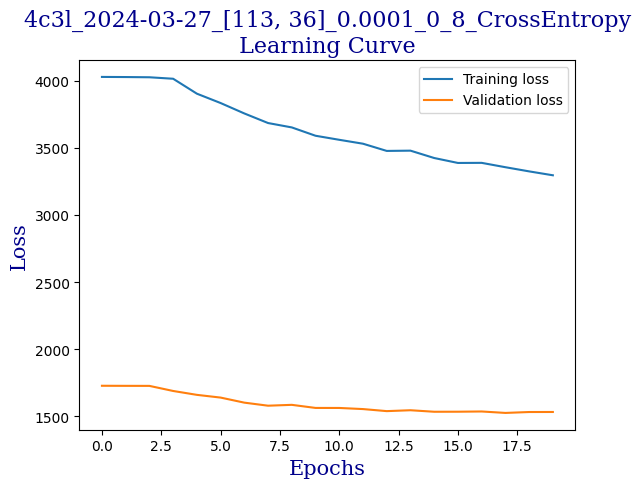

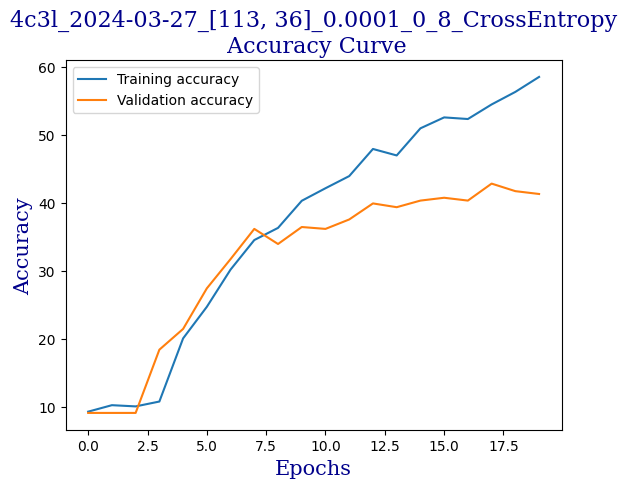

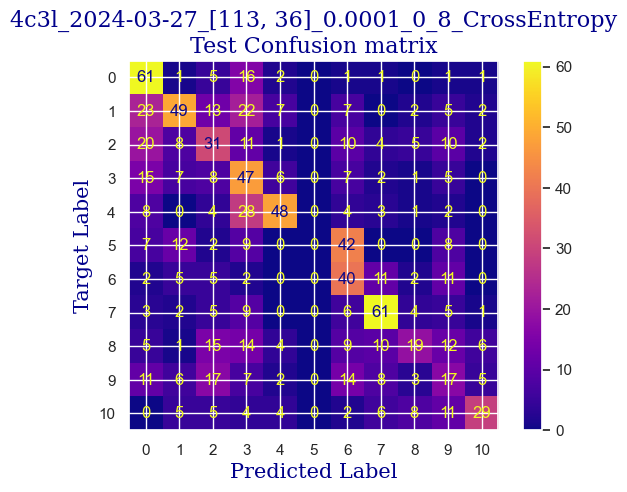

 
 END 4c3l [113, 36] Run Time:  197.082099443
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
208.007877481
197.083772707
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.469958358120167
validating...


  5%|██▊                                                      | 1/20 [00:09<02:53,  9.16s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:47,  9.32s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 15%|████████▌                                                | 3/20 [00:27<02:38,  9.31s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.005353955978585
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:30,  9.40s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:20,  9.36s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.44s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:02,  9.41s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.005353955978585
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.48s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:42,  9.35s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 50%|████████████████████████████                            | 10/20 [01:33<01:33,  9.31s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.707911957168353
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:24,  9.40s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:52<01:14,  9.32s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:01<01:05,  9.40s/it]

validation accuracy:  10.263522884882107
Training...
train accuracy:  10.767400356930398
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.39s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  11.362284354550862
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:20<00:46,  9.39s/it]

validation accuracy:  8.460471567267684
Training...
train accuracy:  11.600237953599049
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.39s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  17.668054729327782
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:39<00:28,  9.38s/it]

validation accuracy:  22.88488210818308
Training...
train accuracy:  25.698988697204044
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:48<00:18,  9.34s/it]

validation accuracy:  23.994452149791957
Training...
train accuracy:  30.101130279595477
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:57<00:09,  9.33s/it]

validation accuracy:  27.600554785020805
Training...
train accuracy:  32.1832242712671
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:07<00:00,  9.37s/it]

validation accuracy:  28.9875173370319
Testing...


 
 train acc:  32.1832242712671
 
 val acc:  28.9875173370319
 
 test acc:  29.80582524271845


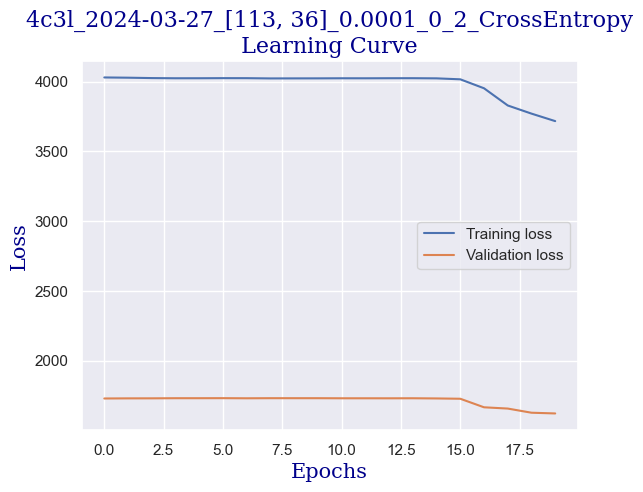

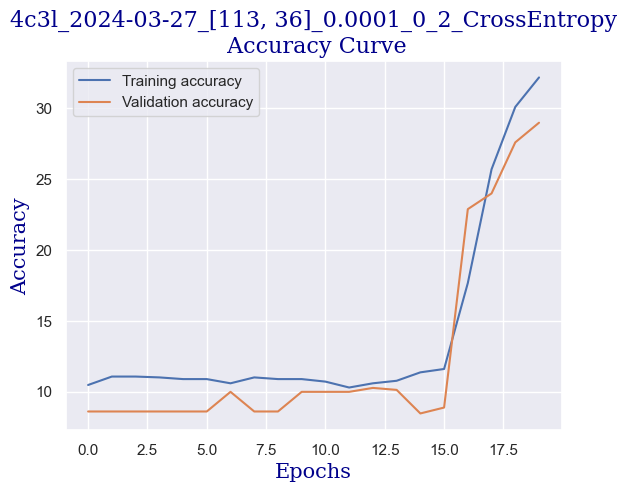

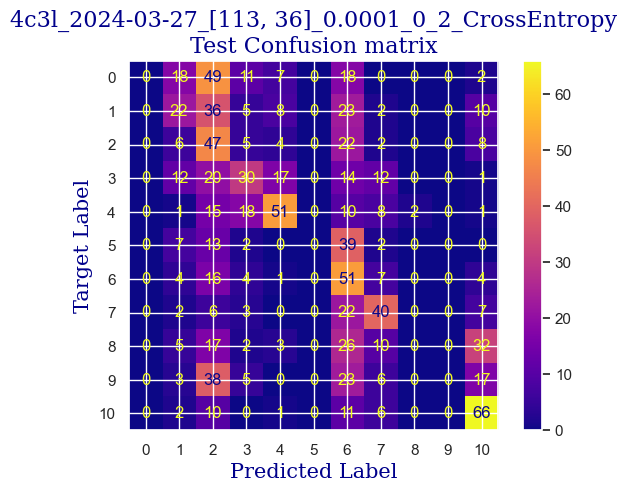

 
 END 4c3l [113, 36] Run Time:  193.63136464599998
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
401.640305526
390.716193777
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.804283164782866
validating...


  5%|██▊                                                      | 1/20 [00:10<03:11, 10.07s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.053539559785841
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:48,  9.37s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████▌                                                | 3/20 [00:28<02:39,  9.36s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.302795954788817
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:30,  9.43s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  20.70196311719215
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.40s/it]

validation accuracy:  19.694868238557557
Training...
train accuracy:  27.959547888161808
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:10,  9.32s/it]

validation accuracy:  28.84882108183079
Training...
train accuracy:  31.4098750743605
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:01,  9.34s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  34.7412254610351
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:51,  9.33s/it]

validation accuracy:  26.907073509015255
Training...
train accuracy:  37.120761451516955
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:44,  9.47s/it]

validation accuracy:  33.14840499306519
Training...
train accuracy:  36.94229625223082
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.40s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  40.095181439619274
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:26,  9.60s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  40.3926234384295
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.49s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  40.92801903628792
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.51s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  42.59369422962522
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.49s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  42.71267102914932
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.42s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  43.90243902439025
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.45s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  45.33016061867936
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.37s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  46.162998215348004
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.44s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  48.00713860797144
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.44s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  46.22248661511005
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.45s/it]

validation accuracy:  33.42579750346741
Testing...


 
 train acc:  46.22248661511005
 
 val acc:  33.42579750346741
 
 test acc:  33.689320388349515


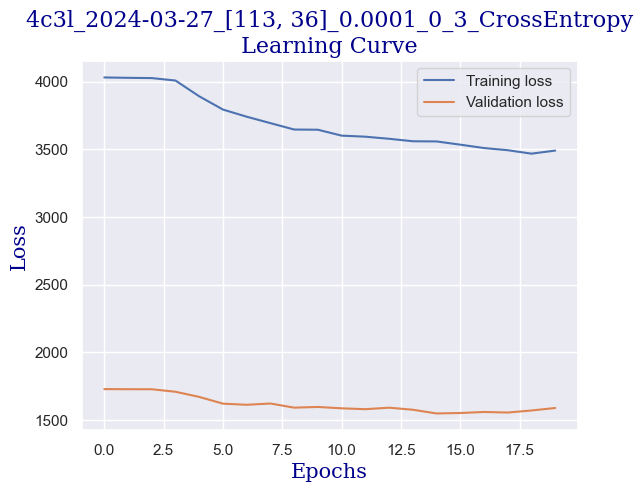

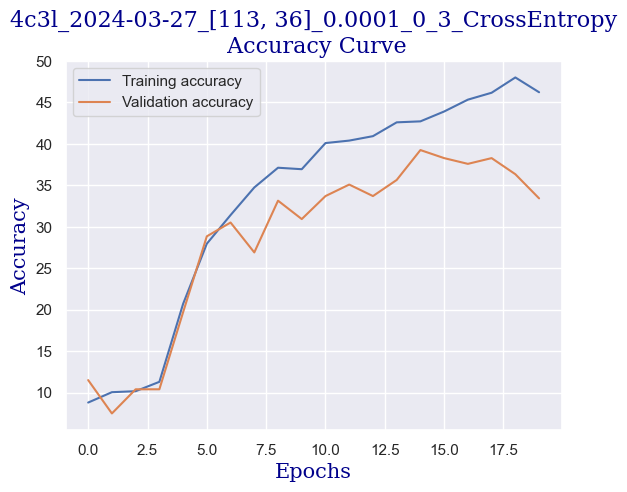

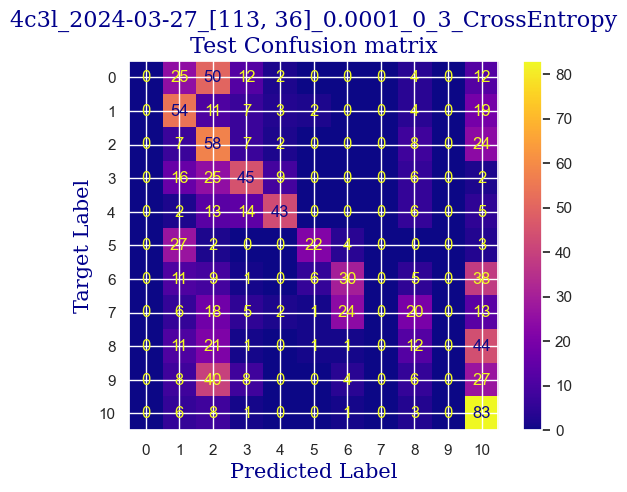

 
 END 4c3l [113, 36] Run Time:  195.322909556
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
596.964177857
586.040067274
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.57763236168947
validating...


  5%|██▊                                                      | 1/20 [00:09<02:54,  9.21s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.58893515764426
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:50,  9.48s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  17.965496728138014
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.43s/it]

validation accuracy:  28.155339805825243
Training...
train accuracy:  29.7441998810232
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:31,  9.48s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  33.789411064842355
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.41s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  36.34741225461035
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:11,  9.38s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  37.120761451516955
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:01,  9.34s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  38.54848304580607
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.48s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  40.095181439619274
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.37s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  40.98750743604997
validating...


 50%|████████████████████████████                            | 10/20 [01:33<01:33,  9.39s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  43.426531826293875
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:24,  9.43s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  45.15169541939322
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:52<01:15,  9.38s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  45.15169541939322
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.46s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  46.63890541344438
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:55,  9.33s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  45.56811421772755
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:20<00:46,  9.39s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  47.88816180844736
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.37s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  49.256395002974415
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:39<00:28,  9.38s/it]

validation accuracy:  45.49237170596394
Training...
train accuracy:  48.00713860797144
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.37s/it]

validation accuracy:  43.27323162274618
Training...
train accuracy:  48.66151100535396
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:58<00:09,  9.39s/it]

validation accuracy:  41.19278779472954
Training...
train accuracy:  51.21951219512195
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.42s/it]

validation accuracy:  44.521497919556175
Testing...


 
 train acc:  51.21951219512195
 
 val acc:  44.521497919556175
 
 test acc:  41.359223300970875


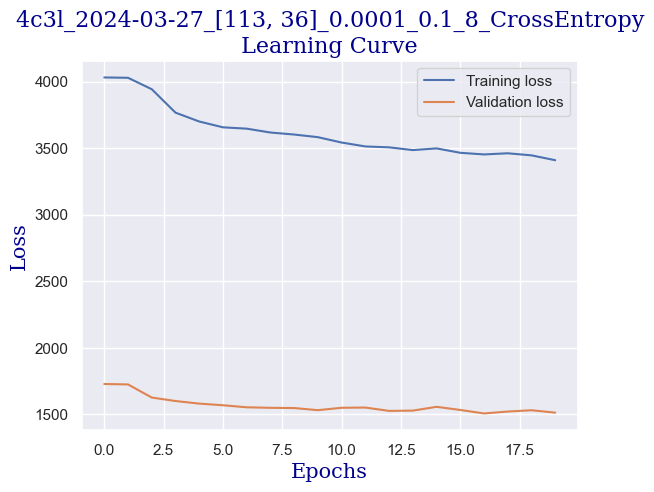

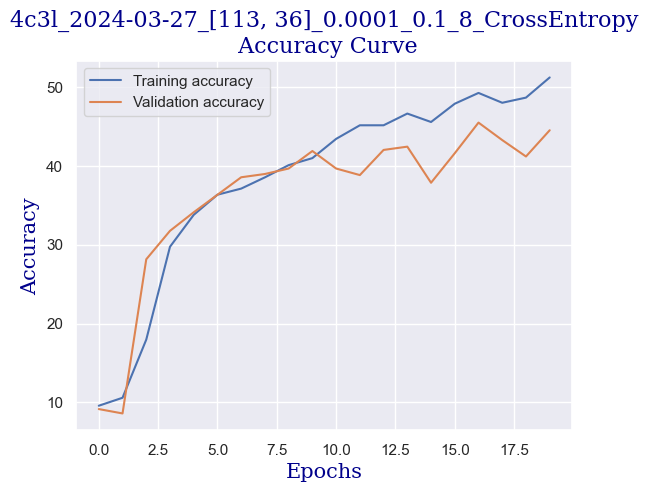

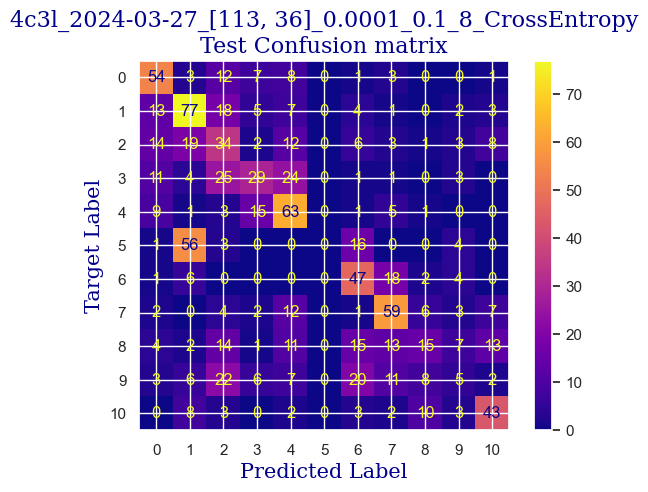

 
 END 4c3l [113, 36] Run Time:  194.67462057800003
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
791.639957411
780.715844157
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.804283164782866
validating...


  5%|██▊                                                      | 1/20 [00:09<02:59,  9.47s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  10.648423557406305
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:49,  9.42s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.529446757882214
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.53s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.707911957168353
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:30,  9.43s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.886377156454492
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.41s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.053539559785841
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:11,  9.37s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.875074360499703
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:01,  9.33s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  11.362284354550862
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.37s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.39s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 50%|████████████████████████████                            | 10/20 [01:33<01:33,  9.38s/it]

validation accuracy:  11.373092926490985
Training...
train accuracy:  16.00237953599048
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:25,  9.50s/it]

validation accuracy:  17.891816920943135
Training...
train accuracy:  23.378941106484234
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:52<01:15,  9.40s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  24.806662700773348
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.43s/it]

validation accuracy:  23.43966712898752
Training...
train accuracy:  28.73289708506841
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.35s/it]

validation accuracy:  27.045769764216367
Training...
train accuracy:  30.93396787626413
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:20<00:46,  9.35s/it]

validation accuracy:  26.352288488210817
Training...
train accuracy:  33.25401546698394
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.41s/it]

validation accuracy:  26.352288488210817
Training...
train accuracy:  35.5145746579417
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:39<00:28,  9.34s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  37.71564544913742
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.41s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  38.66745984533016
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:58<00:09,  9.42s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  38.48899464604402
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.41s/it]

validation accuracy:  32.31622746185853
Testing...


 
 train acc:  38.48899464604402
 
 val acc:  32.31622746185853
 
 test acc:  36.699029126213595


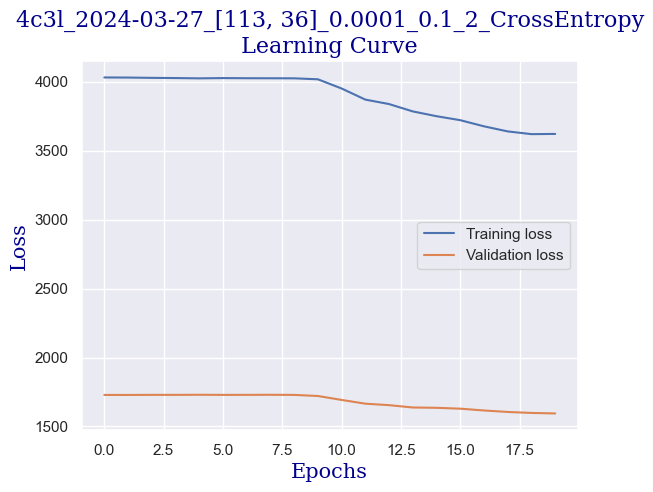

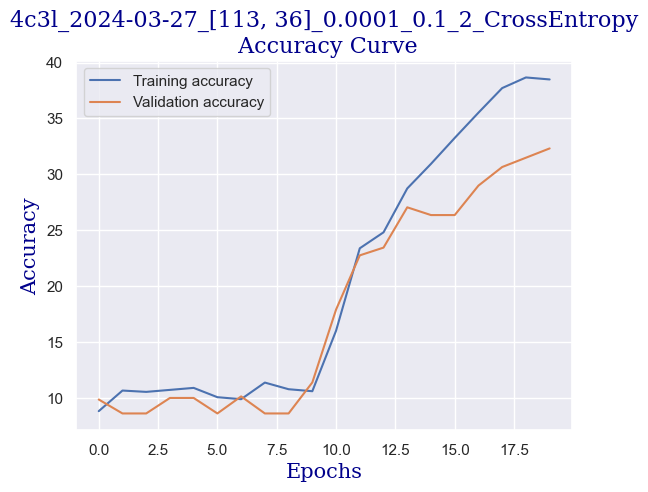

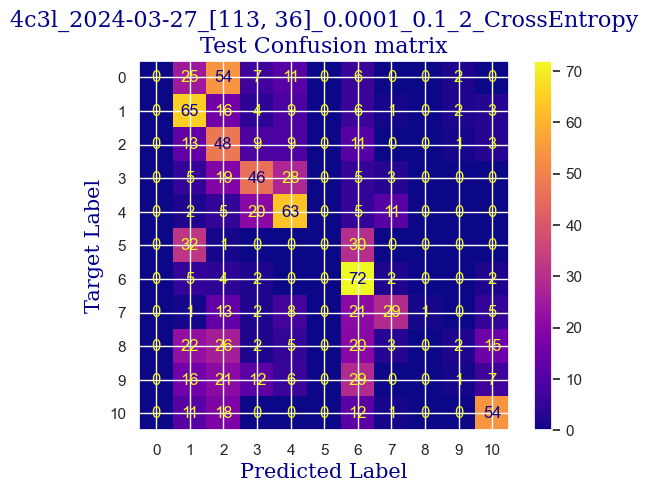

 
 END 4c3l [113, 36] Run Time:  194.45682970300004
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
986.097910483
975.173797491
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.75609756097561
validating...


  5%|██▊                                                      | 1/20 [00:09<02:57,  9.32s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.994051160023796
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:51,  9.52s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.648423557406305
validating...


 15%|████████▌                                                | 3/20 [00:28<02:39,  9.36s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.58893515764426
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:31,  9.45s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.172516359309935
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.45s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.838191552647235
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.48s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.350981558596075
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:02,  9.41s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.339678762641284
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:54,  9.51s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.350981558596075
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.42s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  16.5377751338489
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.45s/it]

validation accuracy:  20.804438280166433
Training...
train accuracy:  24.033313503866747
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:24,  9.42s/it]

validation accuracy:  26.352288488210817
Training...
train accuracy:  27.364663890541348
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:14,  9.37s/it]

validation accuracy:  25.104022191400833
Training...
train accuracy:  30.93396787626413
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.43s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  31.88578227245687
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.36s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  36.64485425342058
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.42s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  37.775133848899465
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.42s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  38.07257584770969
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.41s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  39.440809042236765
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.38s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  41.34443783462225
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:58<00:09,  9.39s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  40.749553837001784
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.42s/it]

validation accuracy:  34.812760055478506
Testing...


 
 train acc:  40.749553837001784
 
 val acc:  34.812760055478506
 
 test acc:  37.57281553398058


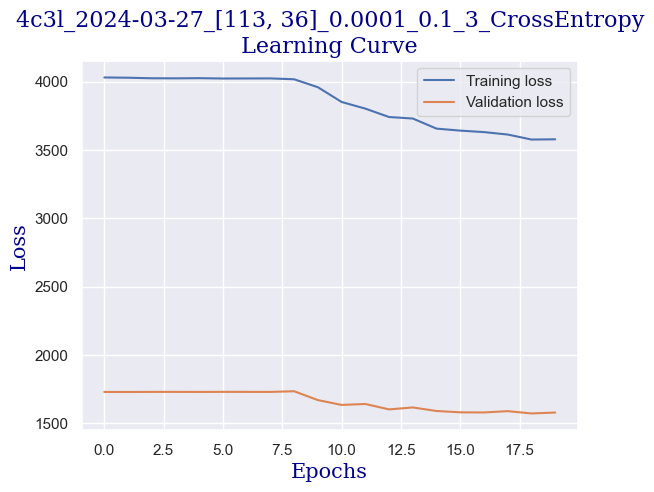

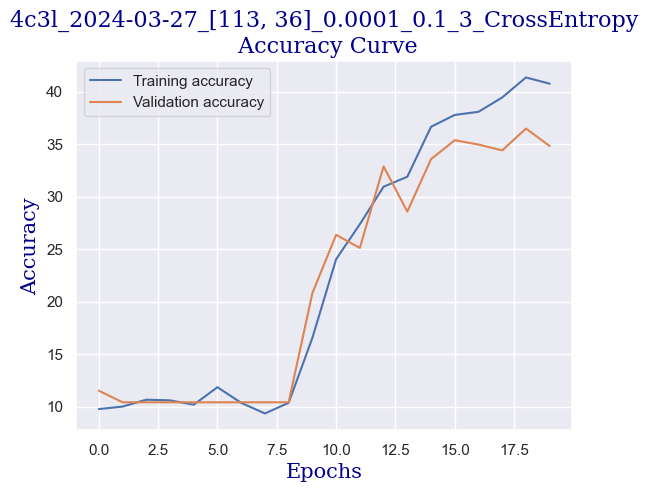

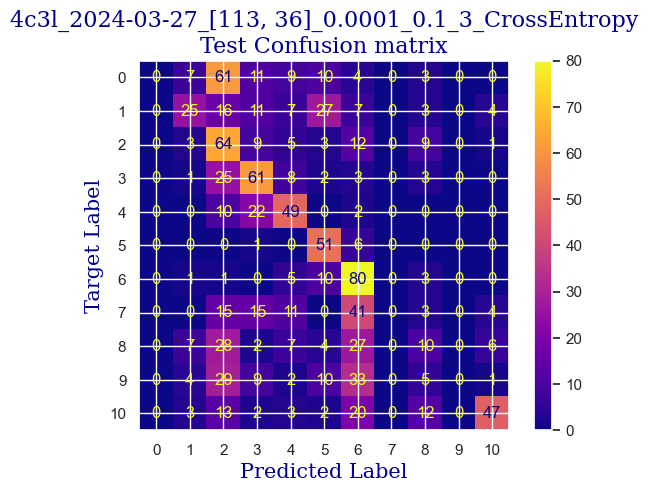

 
 END 4c3l [113, 36] Run Time:  194.62154015800013
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
1180.720727061
1169.796615215
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.339678762641284
validating...


  5%|██▊                                                      | 1/20 [00:09<03:02,  9.61s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  14.634146341463413
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:50,  9.45s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  29.684711481261157
validating...


 15%|████████▌                                                | 3/20 [00:28<02:38,  9.35s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  36.22843545508626
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:30,  9.38s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  40.15466983938132
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.41s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  41.106484235574065
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.45s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  42.1772754312909
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:02,  9.41s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  43.426531826293875
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.48s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  42.653182629387274
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.42s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  45.27067221891731
validating...


 50%|████████████████████████████                            | 10/20 [01:35<01:36,  9.66s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  46.46044021415824
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:23,  9.32s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  47.65020820939917
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:52<01:14,  9.31s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  48.66151100535396
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.45s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  48.958953004164194
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.36s/it]

validation accuracy:  47.57281553398058
Training...
train accuracy:  49.97025580011898
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.59s/it]

validation accuracy:  45.63106796116505
Training...
train accuracy:  51.16002379535991
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:38,  9.53s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  51.04104699583581
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.41s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  52.88518738845925
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.50s/it]

validation accuracy:  47.57281553398058
Training...
train accuracy:  55.08625817965497
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.45s/it]

validation accuracy:  49.09847434119279
Training...
train accuracy:  55.3837001784652
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.45s/it]

validation accuracy:  49.09847434119279
Testing...


 
 train acc:  55.3837001784652
 
 val acc:  49.09847434119279
 
 test acc:  47.76699029126213


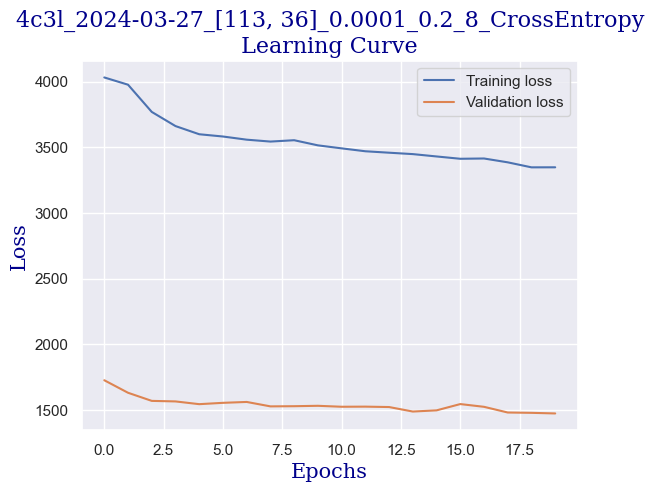

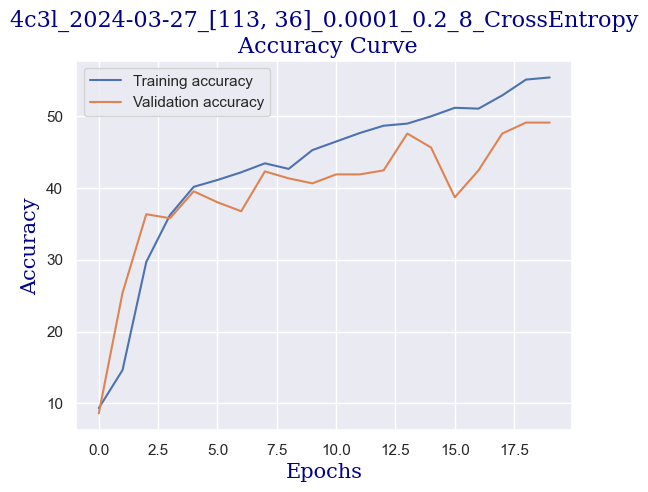

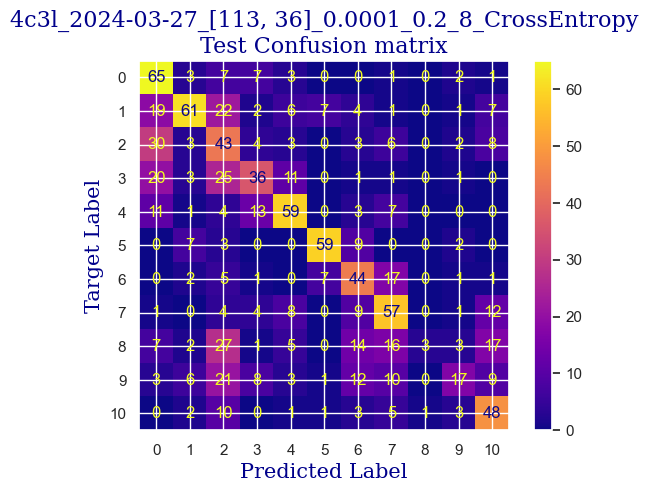

 
 END 4c3l [113, 36] Run Time:  195.28472191900005
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
1376.006784854
1365.082671815
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.863771564544914
validating...


  5%|██▊                                                      | 1/20 [00:09<02:59,  9.46s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.053539559785841
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.53s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.06484235574063
validating...


 15%|████████▌                                                | 3/20 [00:28<02:39,  9.37s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.005353955978585
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:30,  9.43s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.44s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.291493158834028
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.45s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.421772754312908
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:02,  9.40s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.23200475907198
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.48s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.41s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.89767995240928
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:35,  9.52s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:25,  9.44s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.24330755502677
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.43s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.481261154074955
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.49s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.183819155264723
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.39s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.124330755502678
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.44s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.40s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  12.373587150505651
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.39s/it]

validation accuracy:  15.950069348127602
Training...
train accuracy:  20.166567519333732
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.36s/it]

validation accuracy:  24.965325936199722
Training...
train accuracy:  25.401546698393812
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:58<00:09,  9.33s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  29.56573468173706
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.42s/it]

validation accuracy:  22.330097087378643
Testing...


 
 train acc:  29.56573468173706
 
 val acc:  22.330097087378643
 
 test acc:  26.407766990291265


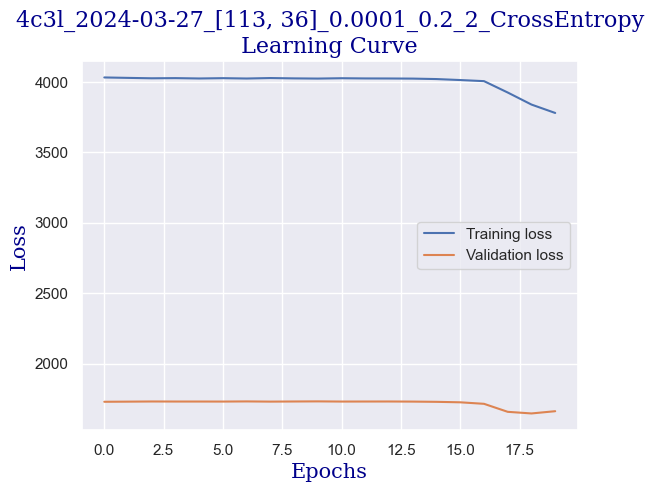

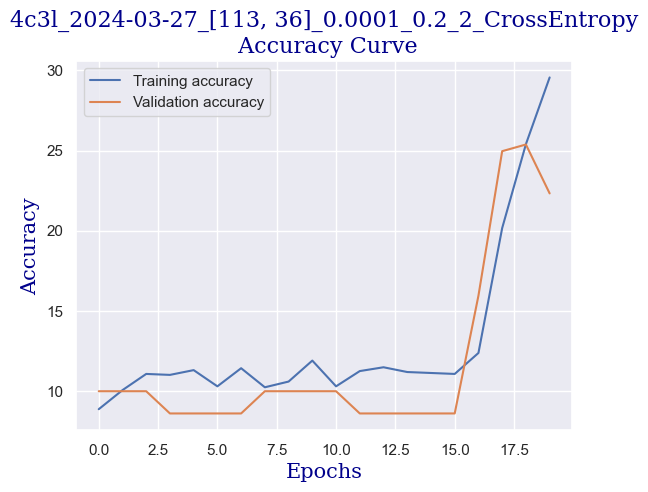

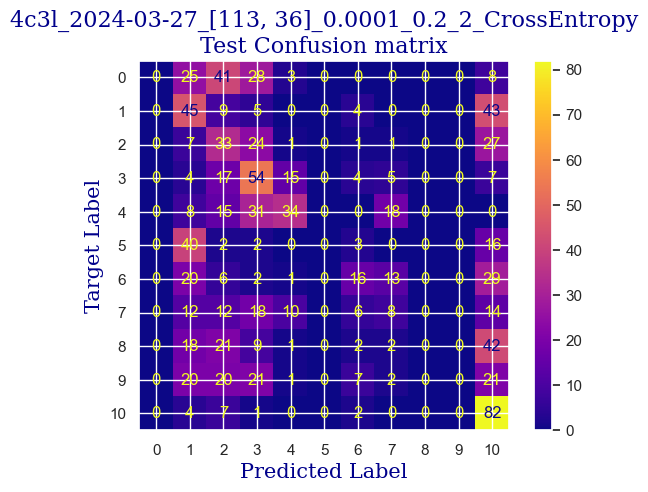

 
 END 4c3l [113, 36] Run Time:  194.6442239989999
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
1570.652354752
1559.7282433359999
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.030933967876264
validating...


  5%|██▊                                                      | 1/20 [00:09<03:03,  9.67s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.934562760261748
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.51s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.767400356930398
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.49s/it]

validation accuracy:  8.737864077669903
Training...
train accuracy:  16.061867935752527
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:31,  9.46s/it]

validation accuracy:  17.05963938973648
Training...
train accuracy:  25.580011897679956
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:22,  9.48s/it]

validation accuracy:  26.49098474341193
Training...
train accuracy:  29.327781082688876
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.45s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  33.670434265318264
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:02,  9.40s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  35.5145746579417
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.45s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  37.775133848899465
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.37s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  39.440809042236765
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.44s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  40.03569303985723
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:24,  9.34s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  43.426531826293875
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.41s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  43.96192742415229
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:05,  9.39s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  45.09220701963117
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.35s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  46.46044021415824
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:46,  9.36s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  48.60202260559191
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.34s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  50.089232599643076
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:39<00:27,  9.30s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  51.16002379535991
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.38s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  54.01546698393813
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:58<00:09,  9.29s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  54.491374182034505
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:07<00:00,  9.40s/it]

validation accuracy:  41.60887656033287
Testing...


 
 train acc:  54.491374182034505
 
 val acc:  41.60887656033287
 
 test acc:  40.77669902912621


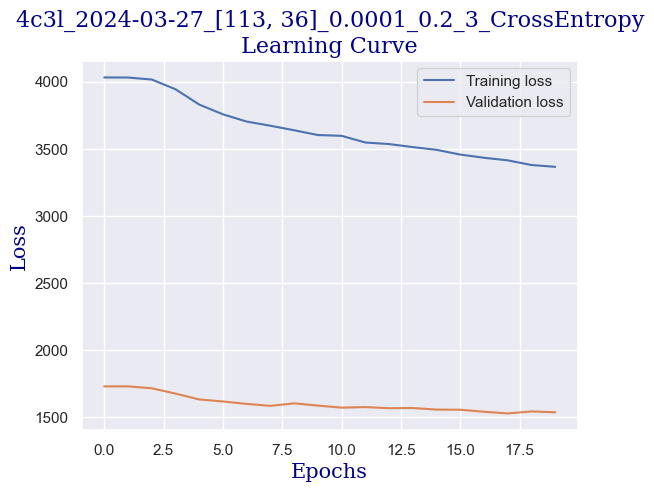

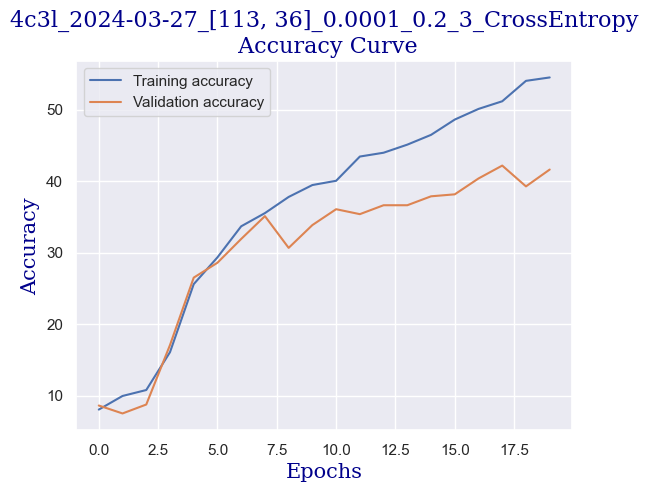

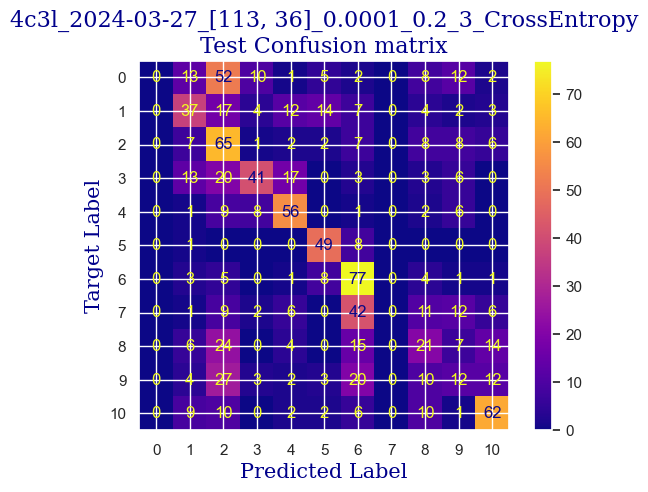

 
 END 4c3l [113, 36] Run Time:  194.27528190499993
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
1764.928768598
1754.004664337
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.458655562165378
validating...


  5%|██▊                                                      | 1/20 [00:09<02:58,  9.39s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.39916716240333
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:50,  9.46s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.75609756097561
validating...


 15%|████████▌                                                | 3/20 [00:28<02:38,  9.32s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.458655562165378
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:30,  9.44s/it]

validation accuracy:  16.36615811373093
Training...
train accuracy:  16.061867935752527
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:20,  9.38s/it]

validation accuracy:  20.804438280166433
Training...
train accuracy:  25.639500297441998
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.43s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  31.05294467578822
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:01,  9.38s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  33.19452706722189
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.41s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  33.61094586555622
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:42,  9.36s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  40.45211183819155
validating...


 50%|████████████████████████████                            | 10/20 [01:33<01:33,  9.34s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  41.99881023200476
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:23,  9.33s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  43.96192742415229
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:52<01:14,  9.33s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  43.842950624628195
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:05,  9.42s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  44.25936942296252
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.36s/it]

validation accuracy:  42.995839112343965
Training...
train accuracy:  46.04402141582391
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:20<00:47,  9.44s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  45.80606781677573
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.36s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  46.81737061273052
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:39<00:28,  9.36s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  47.76918500892326
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.47s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  48.78048780487805
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:58<00:09,  9.35s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  50.32718619869125
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:07<00:00,  9.40s/it]

validation accuracy:  43.96671289875174
Testing...


 
 train acc:  50.32718619869125
 
 val acc:  43.96671289875174
 
 test acc:  40.0


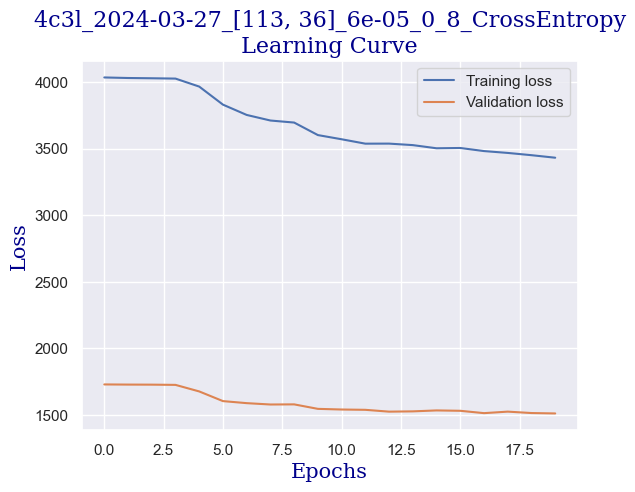

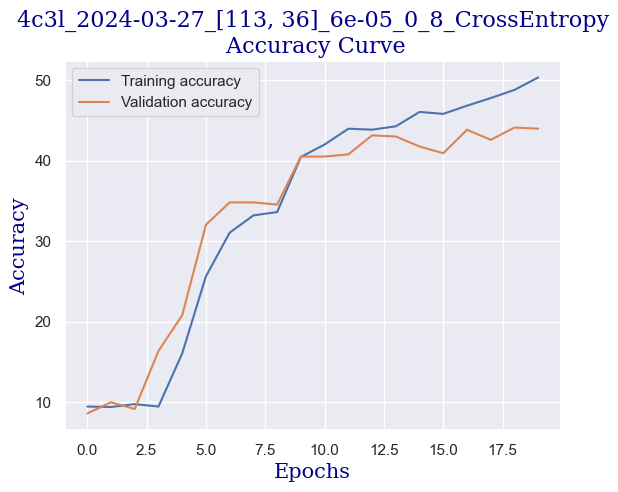

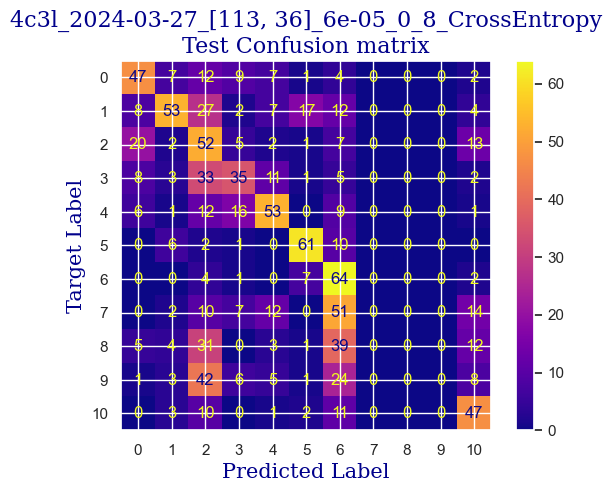

 
 END 4c3l [113, 36] Run Time:  194.194582224
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
1959.124464891
1948.200347927
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.625817965496728
validating...


  5%|██▊                                                      | 1/20 [00:09<03:06,  9.79s/it]

validation accuracy:  9.015256588072122
Training...
train accuracy:  9.458655562165378
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:53,  9.63s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.826888756692444
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.45s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.886377156454492
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:32,  9.50s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.24330755502677
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:22,  9.48s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.815585960737657
validating...


 30%|█████████████████                                        | 6/20 [00:57<02:13,  9.50s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.934562760261748
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:02,  9.45s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.40s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.40s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.421772754312908
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.49s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.529446757882214
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:24,  9.40s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.302795954788817
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:14,  9.37s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.945865556216537
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.44s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.38s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.600237953599049
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:22<00:47,  9.54s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.40s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.826888756692444
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.40s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.35s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.838191552647235
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:58<00:09,  9.29s/it]

validation accuracy:  15.811373092926493
Training...
train accuracy:  17.846519928613922
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.41s/it]

validation accuracy:  19.972260748959776
Testing...


 
 train acc:  17.846519928613922
 
 val acc:  19.972260748959776
 
 test acc:  18.54368932038835


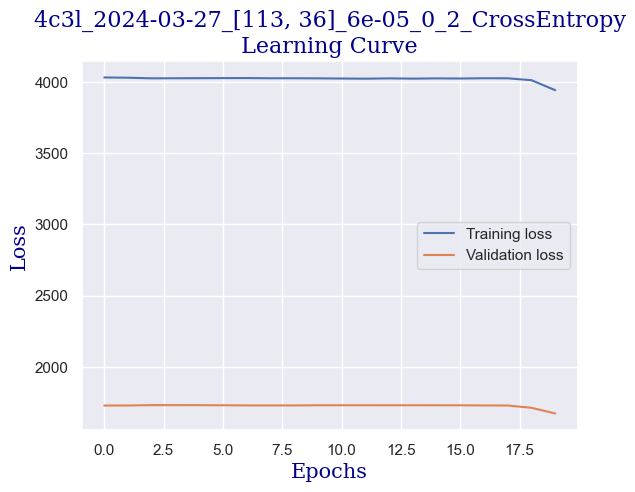

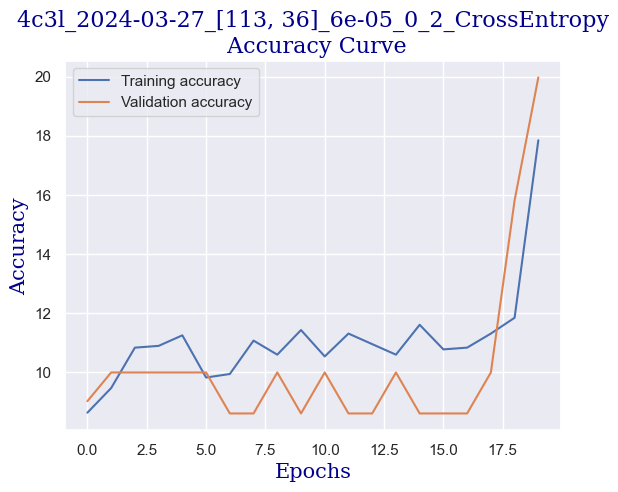

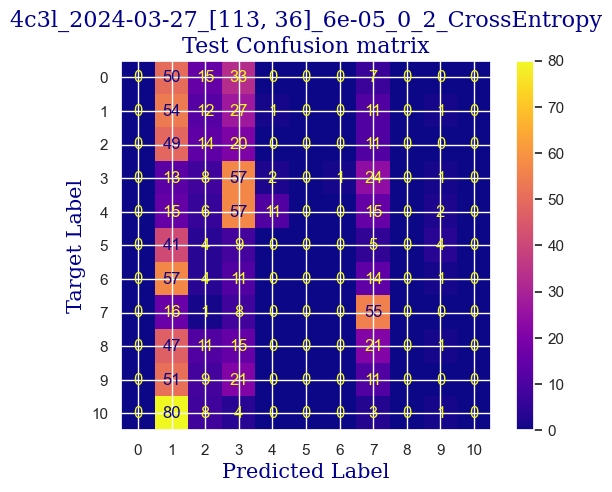

 
 END 4c3l [113, 36] Run Time:  194.50929795700017
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
2153.634866199
2142.7107535190003
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.923259964306961
validating...


  5%|██▊                                                      | 1/20 [00:09<02:59,  9.46s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.994051160023796
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:54,  9.70s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  11.302795954788817
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.47s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  12.07614515169542
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:33,  9.58s/it]

validation accuracy:  13.176144244105409
Training...
train accuracy:  22.843545508625816
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:22,  9.51s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  33.31350386674599
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.45s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  38.786436644854255
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.49s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  39.67876264128495
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.38s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  41.522903033908385
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.43s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  42.1772754312909
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.40s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  44.43783462224866
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:24,  9.43s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  45.44913741820345
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.41s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  47.35276621058894
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.48s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  48.423557406305775
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.40s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  50.089232599643076
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:46,  9.39s/it]

validation accuracy:  46.601941747572816
Training...
train accuracy:  51.69541939321832
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.40s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  52.468768590124924
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.37s/it]

validation accuracy:  46.18585298196949
Training...
train accuracy:  55.80011897679953
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.45s/it]

validation accuracy:  45.214979195561725
Training...
train accuracy:  54.84830458060678
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.38s/it]

validation accuracy:  47.01803051317614
Training...
train accuracy:  56.39500297441998
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.44s/it]

validation accuracy:  48.40499306518724
Testing...


 
 train acc:  56.39500297441998
 
 val acc:  48.40499306518724
 
 test acc:  46.116504854368934


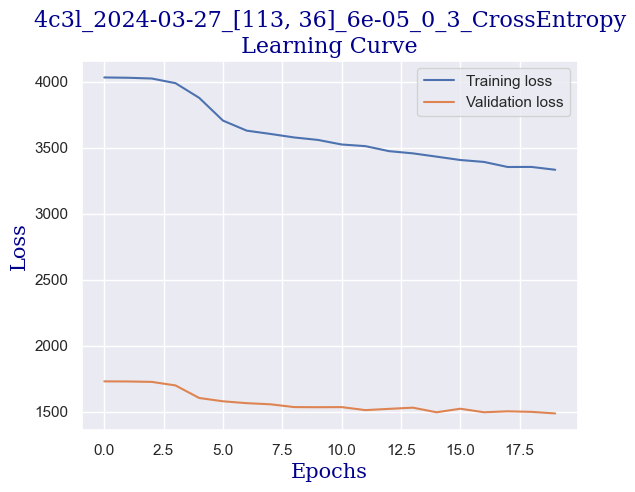

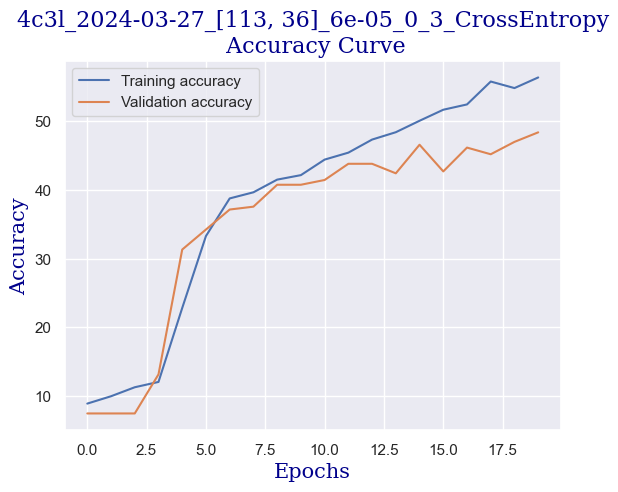

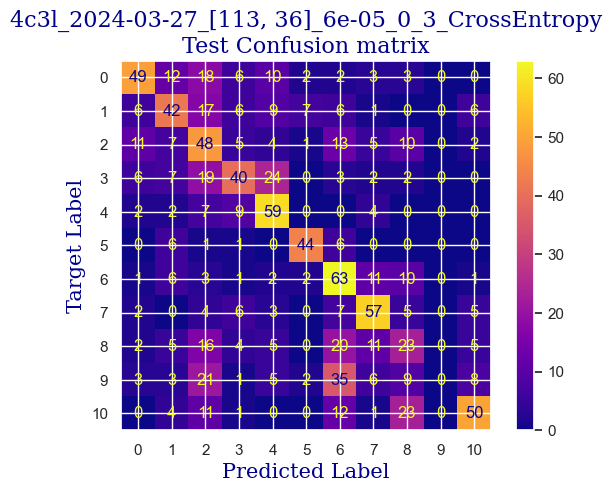

 
 END 4c3l [113, 36] Run Time:  195.19274924399997
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
2348.828729975
2337.9046172820003
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.815585960737657
validating...


  5%|██▊                                                      | 1/20 [00:09<02:58,  9.37s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:52,  9.58s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.44s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.41046995835812
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:33,  9.61s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.40s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.48s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.994051160023796
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:02,  9.44s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  15.348007138607972
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.37s/it]

validation accuracy:  22.88488210818308
Training...
train accuracy:  25.698988697204044
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:44,  9.46s/it]

validation accuracy:  32.17753120665742
Training...
train accuracy:  31.88578227245687
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.45s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  35.99048185603807
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:25,  9.51s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  38.13206424747174
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.45s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  41.58239143367044
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.52s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  41.4039262343843
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.40s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  43.12908982748364
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.46s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  46.04402141582391
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.34s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  47.70969660916121
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:27,  9.31s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  49.31588340273647
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.42s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  49.851279000594886
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.37s/it]

validation accuracy:  44.66019417475729
Training...
train accuracy:  51.21951219512195
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.44s/it]

validation accuracy:  39.94452149791955
Testing...


 
 train acc:  51.21951219512195
 
 val acc:  39.94452149791955
 
 test acc:  36.99029126213592


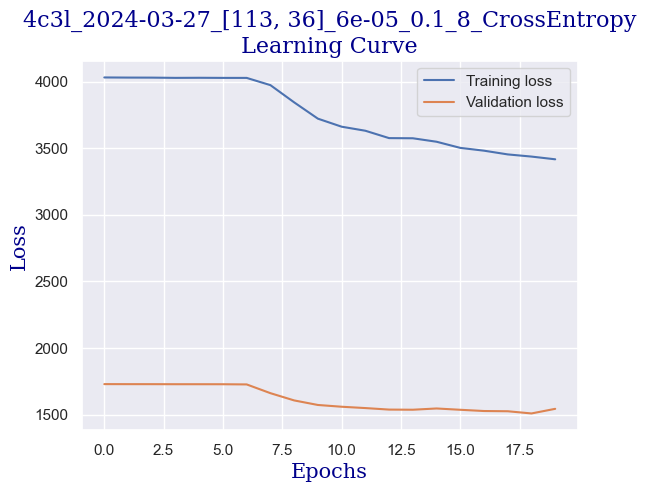

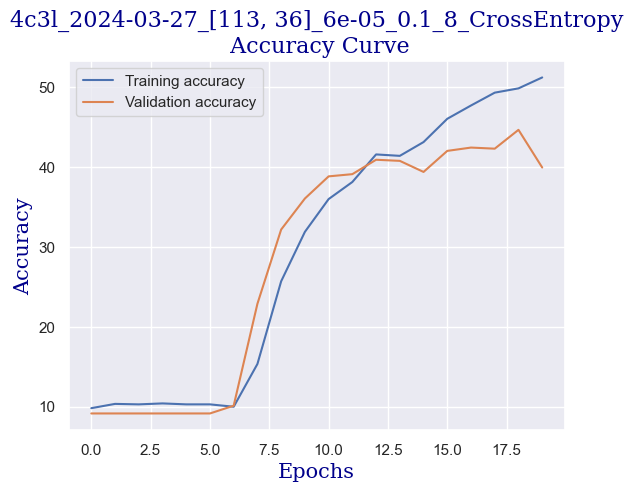

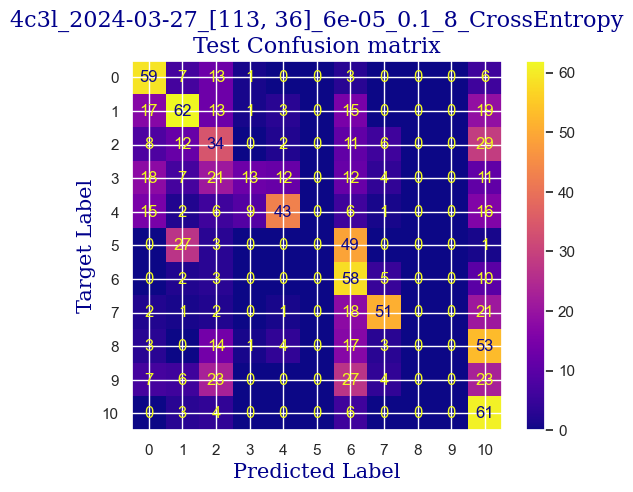

 
 END 4c3l [113, 36] Run Time:  195.1175801180002
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
2543.947360431
2533.0232473650003
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.625817965496728
validating...


  5%|██▊                                                      | 1/20 [00:09<03:00,  9.52s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.54s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 15%|████████▌                                                | 3/20 [00:28<02:39,  9.41s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:31,  9.50s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:19,  9.31s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.362284354550862
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:10,  9.33s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:02,  9.39s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.24330755502677
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.34s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.826888756692444
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.41s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.994051160023796
validating...


 50%|████████████████████████████                            | 10/20 [01:33<01:33,  9.37s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.945865556216537
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:24,  9.44s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.600237953599049
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:52<01:15,  9.42s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  14.039262343842951
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:01<01:05,  9.33s/it]

validation accuracy:  16.22746185852982
Training...
train accuracy:  21.415823914336706
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.35s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  27.007733491969066
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:20<00:46,  9.35s/it]

validation accuracy:  22.330097087378643
Training...
train accuracy:  28.851873884592504
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.38s/it]

validation accuracy:  28.29403606102635
Training...
train accuracy:  31.647828673408686
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:39<00:28,  9.36s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  33.432480666270074
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.43s/it]

validation accuracy:  29.542302357836338
Training...
train accuracy:  34.68173706127305
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:58<00:09,  9.35s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  36.2879238548483
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.40s/it]

validation accuracy:  31.06796116504854
Testing...


 
 train acc:  36.2879238548483
 
 val acc:  31.06796116504854
 
 test acc:  31.74757281553398


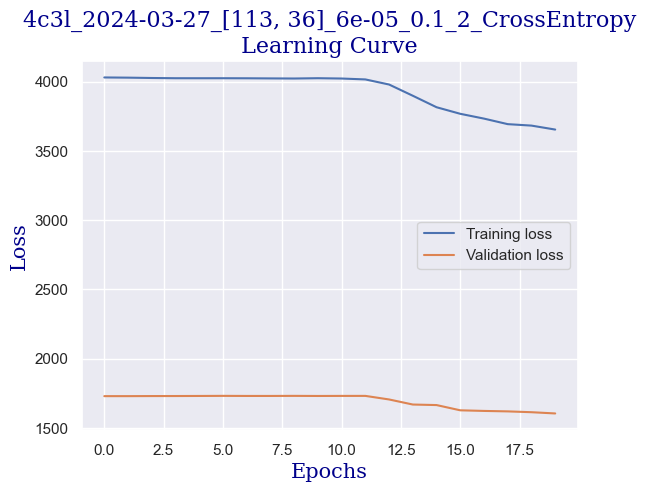

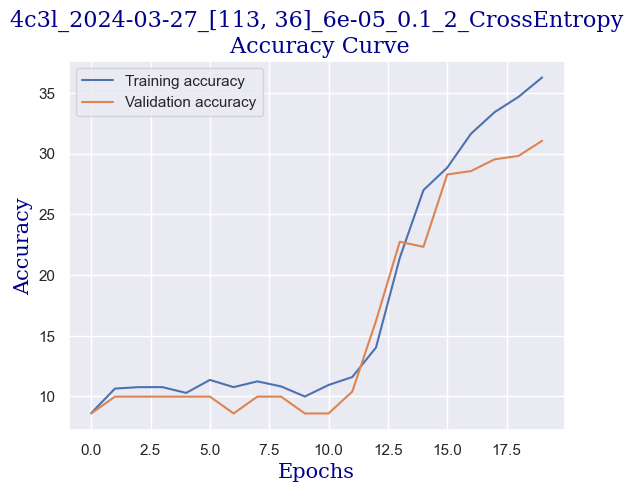

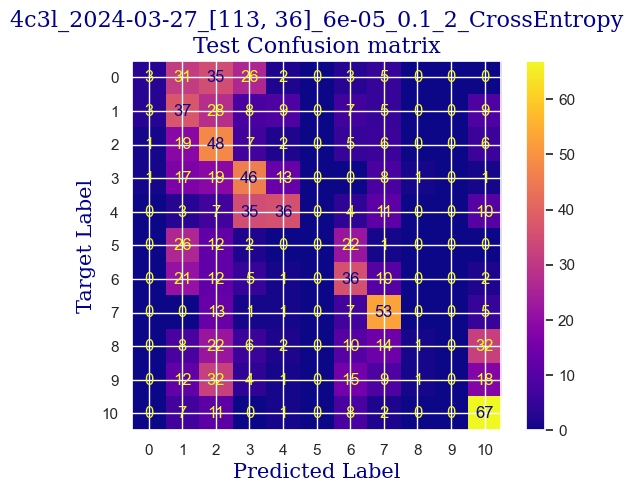

 
 END 4c3l [113, 36] Run Time:  194.2935779290001
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
2738.241981407
2727.317867652
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.113027959547887
validating...


  5%|██▊                                                      | 1/20 [00:09<03:02,  9.58s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.75609756097561
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:53,  9.61s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.39916716240333
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.43s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.767400356930398
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:32,  9.53s/it]

validation accuracy:  11.650485436893204
Training...
train accuracy:  15.407495538370016
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:20,  9.39s/it]

validation accuracy:  19.27877947295423
Training...
train accuracy:  22.367638310529447
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:11,  9.37s/it]

validation accuracy:  19.00138696255201
Training...
train accuracy:  25.81796549672814
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:02,  9.45s/it]

validation accuracy:  19.55617198335645
Training...
train accuracy:  28.13801308744795
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.36s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  31.231409875074363
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.45s/it]

validation accuracy:  28.84882108183079
Training...
train accuracy:  35.15764425936943
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.44s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  36.16894705532421
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:25,  9.46s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  38.13206424747174
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.47s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  40.27364663890541
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.47s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  40.3926234384295
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.45s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  41.99881023200476
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.45s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  44.02141582391434
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.44s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  44.49732302201071
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.40s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  43.66448542534206
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.46s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  45.746579417013685
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.39s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  46.162998215348004
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.45s/it]

validation accuracy:  39.1123439667129
Testing...


 
 train acc:  46.162998215348004
 
 val acc:  39.1123439667129
 
 test acc:  39.6116504854369


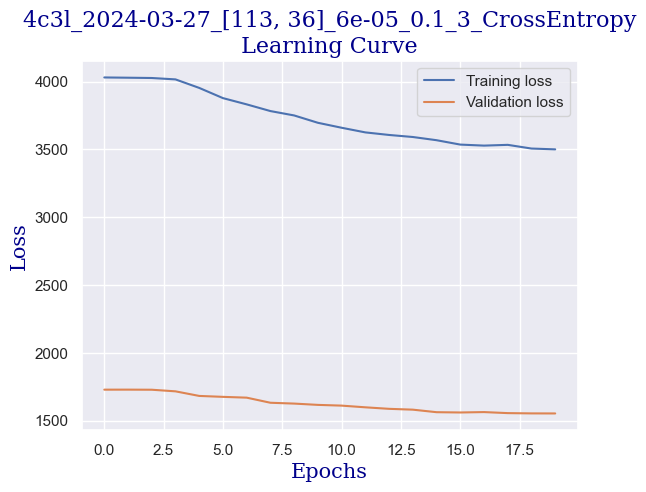

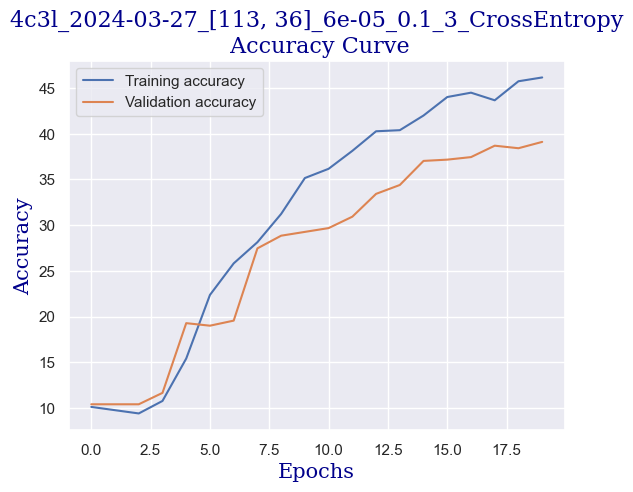

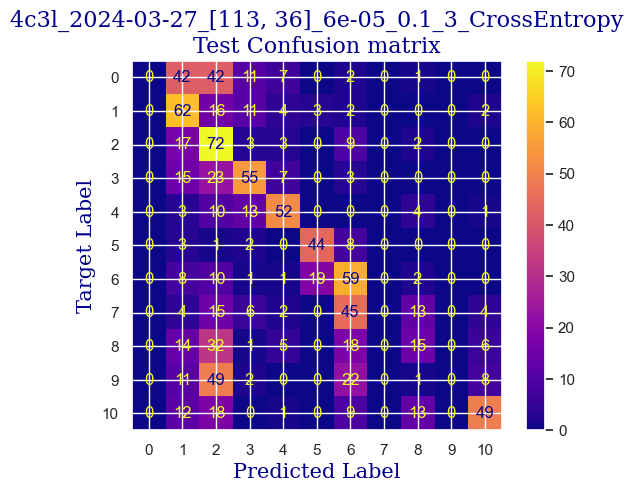

 
 END 4c3l [113, 36] Run Time:  195.11765131599986
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
2933.360551664
2922.436434445
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.804283164782866
validating...


  5%|██▊                                                      | 1/20 [00:09<03:01,  9.56s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.41046995835812
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.55s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.767400356930398
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.45s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.875074360499703
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:32,  9.52s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.41046995835812
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:20,  9.39s/it]

validation accuracy:  14.147018030513175
Training...
train accuracy:  17.37061273051755
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.46s/it]

validation accuracy:  25.65880721220527
Training...
train accuracy:  31.4098750743605
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:02,  9.45s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  37.001784651992864
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:54,  9.52s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  38.48899464604402
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:42,  9.34s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  41.34443783462225
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:33,  9.36s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  44.25936942296252
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:24,  9.41s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  46.81737061273052
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.39s/it]

validation accuracy:  44.9375866851595
Training...
train accuracy:  48.24509220701963
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:05,  9.33s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  50.56513979773945
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.40s/it]

validation accuracy:  43.96671289875174
Training...
train accuracy:  51.21951219512195
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.42s/it]

validation accuracy:  44.79889042995839
Training...
train accuracy:  52.944675788221296
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.48s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  52.52825698988697
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.45s/it]

validation accuracy:  45.63106796116505
Training...
train accuracy:  54.729327781082695
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:19,  9.50s/it]

validation accuracy:  45.90846047156727
Training...
train accuracy:  56.157049375371805
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.44s/it]

validation accuracy:  47.57281553398058
Training...
train accuracy:  58.06067816775729
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.44s/it]

validation accuracy:  47.988904299583915
Testing...


 
 train acc:  58.06067816775729
 
 val acc:  47.988904299583915
 
 test acc:  45.14563106796117


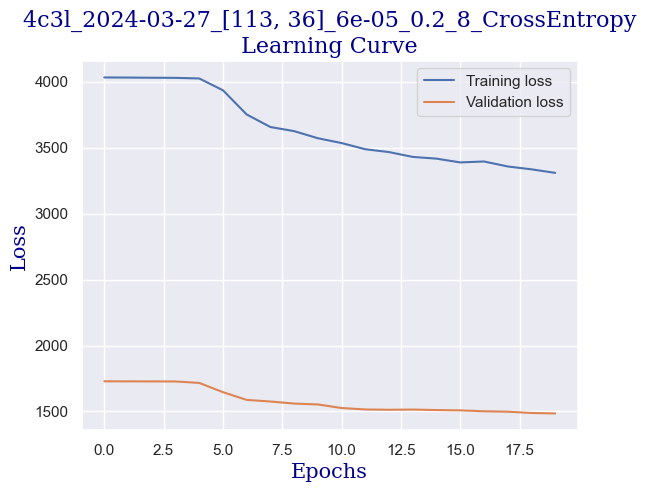

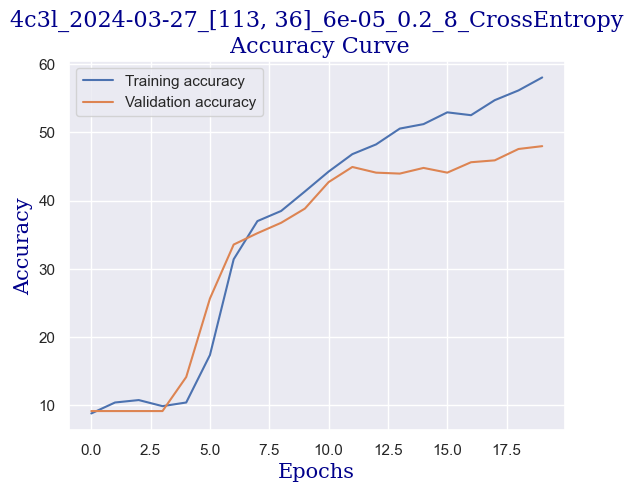

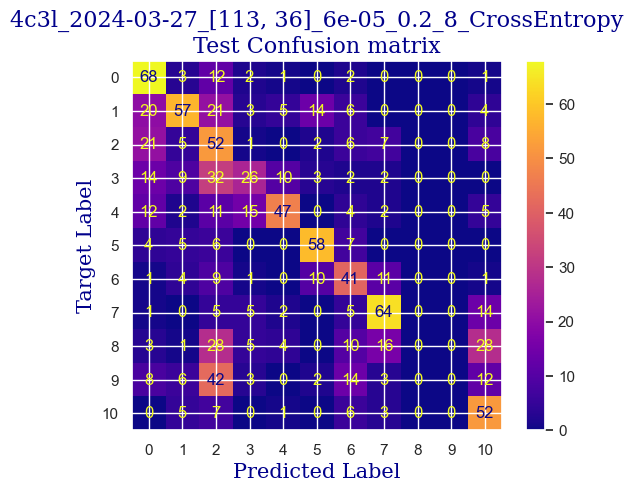

 
 END 4c3l [113, 36] Run Time:  195.10874591799984
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
3128.47028996
3117.5461847740003
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  7.555026769779893
validating...


  5%|██▊                                                      | 1/20 [00:09<02:57,  9.37s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  8.982748364069007
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:49,  9.44s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.458655562165378
validating...


 15%|████████▌                                                | 3/20 [00:28<02:38,  9.34s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.24330755502677
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:30,  9.44s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:19,  9.30s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:10,  9.32s/it]

validation accuracy:  13.176144244105409
Training...
train accuracy:  14.158239143367043
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:02,  9.43s/it]

validation accuracy:  18.8626907073509
Training...
train accuracy:  25.520523497917907
validating...


 40%|██████████████████████▊                                  | 8/20 [01:14<01:52,  9.34s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  30.75550267697799
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.41s/it]

validation accuracy:  30.79056865464632
Training...
train accuracy:  33.19452706722189
validating...


 50%|████████████████████████████                            | 10/20 [01:33<01:33,  9.32s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  36.52587745389649
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:24,  9.44s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  39.14336704342653
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:52<01:15,  9.42s/it]

validation accuracy:  27.600554785020805
Training...
train accuracy:  43.48602022605592
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.46s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  42.77215942891136
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.40s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  44.37834622248661
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:20<00:46,  9.39s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  45.44913741820345
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.40s/it]

validation accuracy:  47.71151178918169
Training...
train accuracy:  47.828673408685304
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:39<00:28,  9.41s/it]

validation accuracy:  45.90846047156727
Training...
train accuracy:  47.828673408685304
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:19,  9.51s/it]

validation accuracy:  45.214979195561725
Training...
train accuracy:  48.00713860797144
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:58<00:09,  9.41s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  48.423557406305775
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.43s/it]

validation accuracy:  49.375866851595006
Testing...


 
 train acc:  48.423557406305775
 
 val acc:  49.375866851595006
 
 test acc:  50.873786407766985


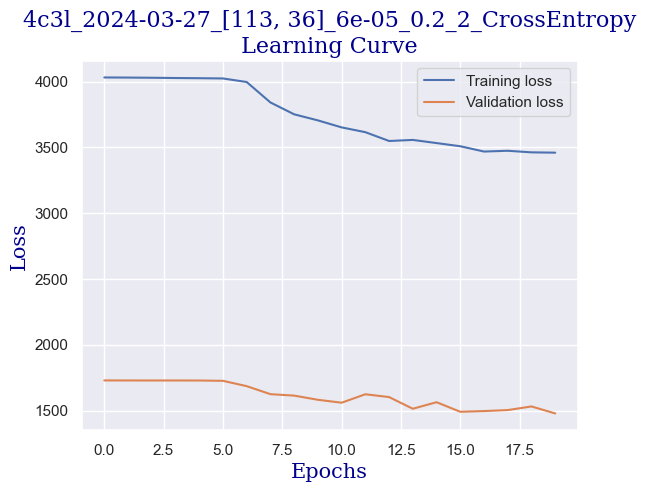

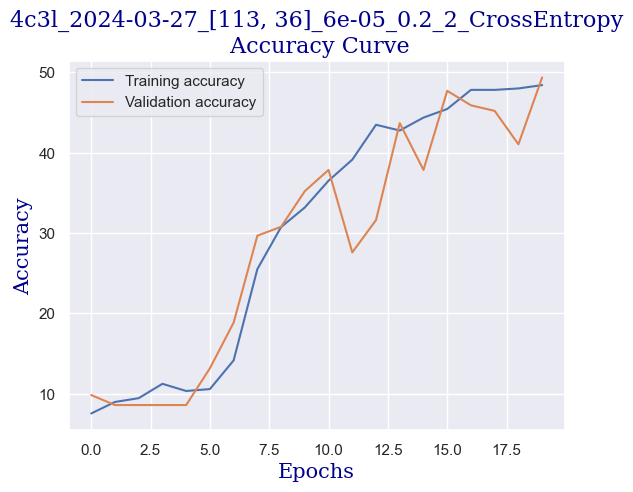

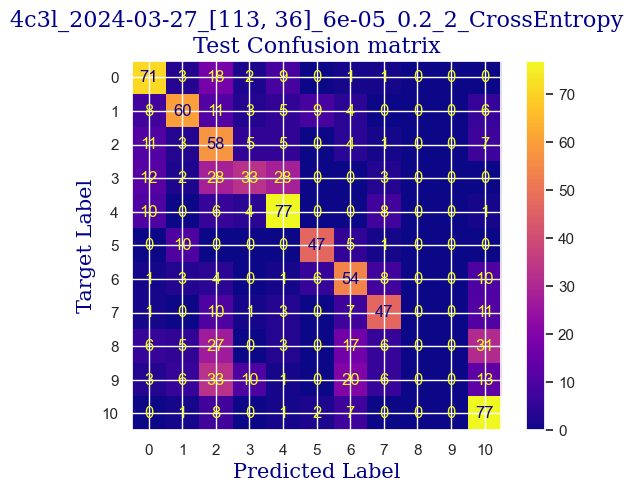

 
 END 4c3l [113, 36] Run Time:  194.95600165299993
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
3323.427338255
3312.503226795
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.696609161213564
validating...


  5%|██▊                                                      | 1/20 [00:09<03:00,  9.51s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.75609756097561
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:50,  9.48s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.183819155264723
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.43s/it]

validation accuracy:  13.592233009708737
Training...
train accuracy:  18.262938726948246
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:33,  9.56s/it]

validation accuracy:  18.723994452149793
Training...
train accuracy:  27.364663890541348
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.44s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  31.469363474122545
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.49s/it]

validation accuracy:  29.958391123439664
Training...
train accuracy:  33.72992266508031
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.48s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  34.86020226055919
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.43s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  38.013087447947655
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:44,  9.50s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  38.90541344437835
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:35,  9.51s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  40.214158239143366
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:25,  9.53s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  41.58239143367044
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.50s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  43.96192742415229
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:07,  9.62s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  48.00713860797144
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.43s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  49.55383700178465
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:22<00:47,  9.42s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  50.62462819750149
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.43s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  51.63593099345628
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:41<00:28,  9.43s/it]

validation accuracy:  43.27323162274618
Training...
train accuracy:  52.409280190362885
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:19,  9.51s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  52.944675788221296
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.43s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  55.80011897679953
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.48s/it]

validation accuracy:  45.76976421636616
Testing...


 
 train acc:  55.80011897679953
 
 val acc:  45.76976421636616
 
 test acc:  42.23300970873786


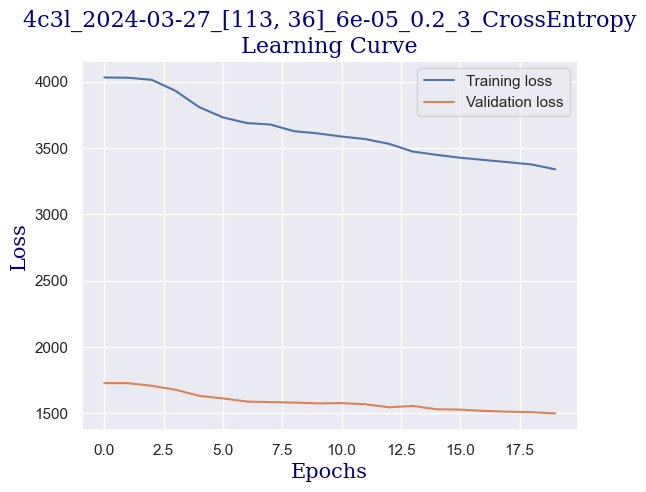

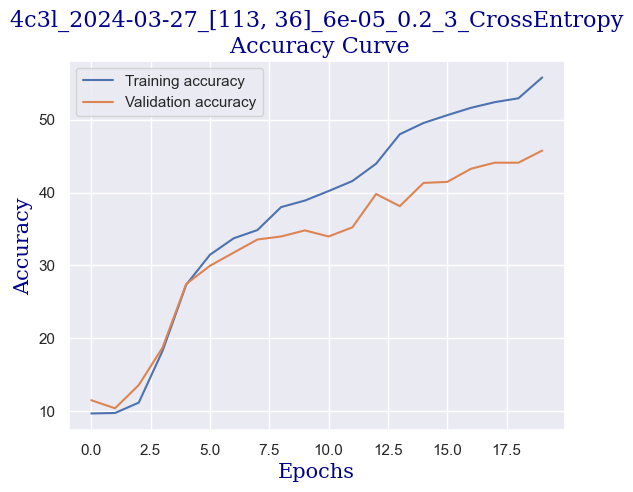

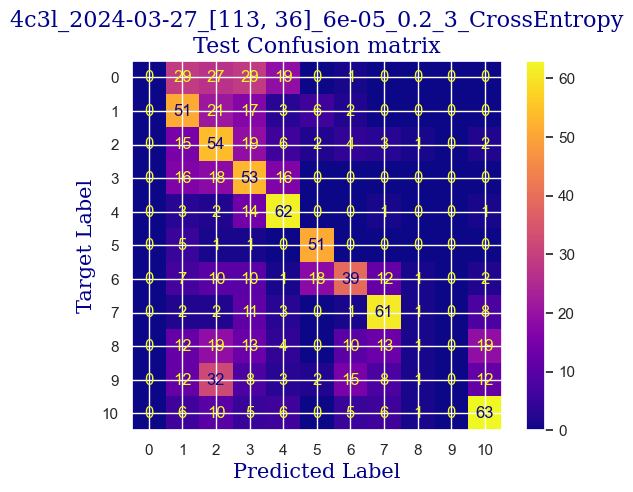

 
 END 4c3l [113, 36] Run Time:  195.88400160699985
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
3519.312389253
3508.388275152
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.1017251635931
validating...


  5%|██▊                                                      | 1/20 [00:09<02:59,  9.46s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.518143961927423
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:53,  9.61s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  12.195121951219512
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.48s/it]

validation accuracy:  15.39528432732316
Training...
train accuracy:  22.903033908387865
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:35,  9.70s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  32.24271267102915
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:22,  9.53s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  35.098155859607374
validating...


 30%|█████████████████                                        | 6/20 [00:57<02:12,  9.49s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  38.66745984533016
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.49s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  40.45211183819155
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.41s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  41.4039262343843
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:44,  9.47s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  44.49732302201071
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.45s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  44.79476502082094
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:25,  9.45s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  47.23378941106484
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.44s/it]

validation accuracy:  44.9375866851595
Training...
train accuracy:  48.66151100535396
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.43s/it]

validation accuracy:  43.41192787794729
Training...
train accuracy:  51.576442593694225
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.39s/it]

validation accuracy:  44.382801664355064
Training...
train accuracy:  52.706722189173114
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:22<00:47,  9.43s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  52.8256989886972
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.40s/it]

validation accuracy:  47.8502080443828
Training...
train accuracy:  53.77751338488994
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.43s/it]

validation accuracy:  45.90846047156727
Training...
train accuracy:  56.33551457465794
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:19,  9.50s/it]

validation accuracy:  47.295423023578365
Training...
train accuracy:  58.95300416418798
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.44s/it]

validation accuracy:  47.01803051317614
Training...
train accuracy:  58.71505056513979
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.48s/it]

validation accuracy:  44.521497919556175
Testing...


 
 train acc:  58.71505056513979
 
 val acc:  44.521497919556175
 
 test acc:  40.58252427184466


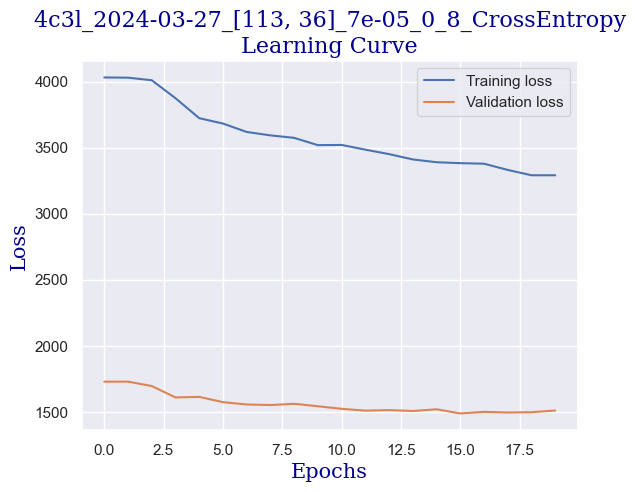

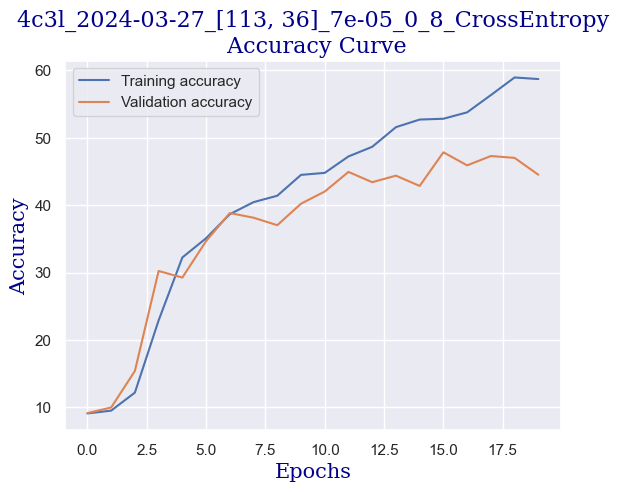

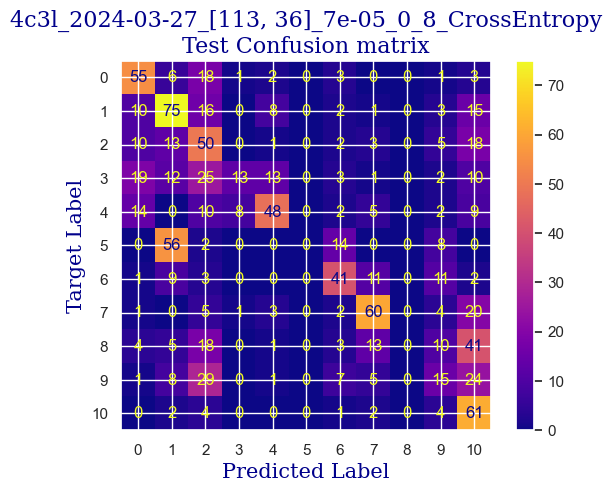

 
 END 4c3l [113, 36] Run Time:  195.84283709599958
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
3715.156128659
3704.232010259
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.447352766210589
validating...


  5%|██▊                                                      | 1/20 [00:09<03:00,  9.48s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.637120761451518
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:53,  9.63s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.005353955978585
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.47s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.89767995240928
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:34,  9.68s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.183819155264723
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:22,  9.50s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 30%|█████████████████                                        | 6/20 [00:57<02:14,  9.60s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.41046995835812
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.52s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.945865556216537
validating...


 40%|██████████████████████▊                                  | 8/20 [01:16<01:54,  9.51s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.41046995835812
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.45s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.540749553837001
validating...


 50%|████████████████████████████                            | 10/20 [01:35<01:34,  9.45s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:24,  9.40s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.707911957168353
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.38s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.540749553837001
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.44s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.38s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.481261154074955
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:22<00:47,  9.44s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.540749553837001
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.38s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.707911957168353
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:41<00:28,  9.52s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.421772754312908
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.40s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.719214753123142
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.35s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.183819155264723
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.46s/it]

validation accuracy:  8.599167822468793
Testing...


 
 train acc:  11.183819155264723
 
 val acc:  8.599167822468793
 
 test acc:  9.12621359223301


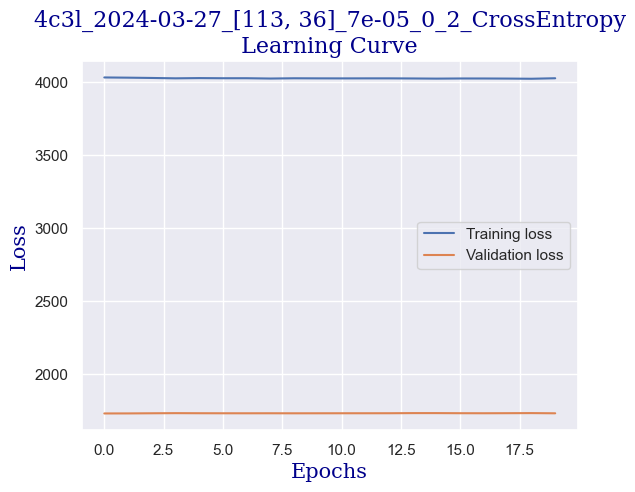

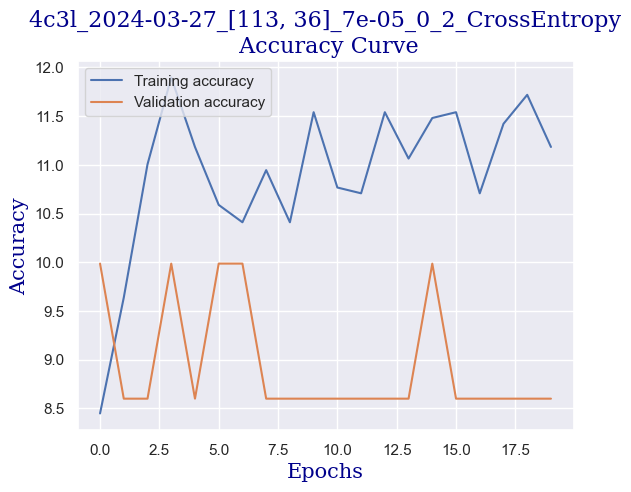

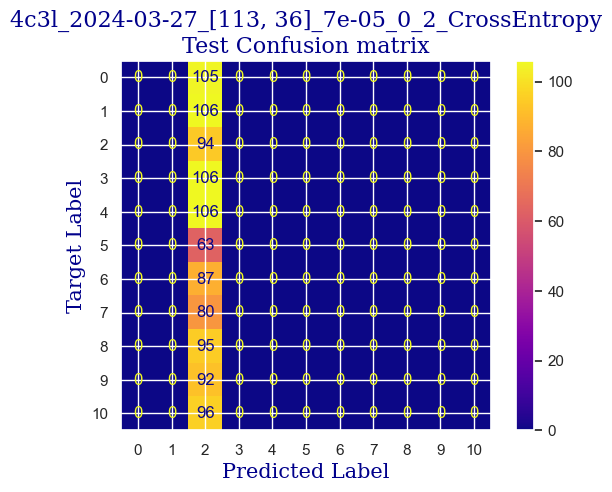

 
 END 4c3l [113, 36] Run Time:  195.3867530370003
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
3910.54409583
3899.619974428
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.458655562165378
validating...


  5%|██▊                                                      | 1/20 [00:09<02:59,  9.43s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.696609161213564
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:52,  9.57s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.339678762641284
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.44s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  15.764425936942297
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:32,  9.52s/it]

validation accuracy:  19.00138696255201
Training...
train accuracy:  23.49791790600833
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:20,  9.39s/it]

validation accuracy:  21.081830790568652
Training...
train accuracy:  28.375966686496135
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:11,  9.38s/it]

validation accuracy:  23.43966712898752
Training...
train accuracy:  33.0755502676978
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:02,  9.44s/it]

validation accuracy:  28.84882108183079
Training...
train accuracy:  35.99048185603807
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.40s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  40.333135038667464
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.44s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  41.46341463414634
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.43s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  45.03271861986913
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:25,  9.45s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  46.400951814396194
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.42s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  50.02974419988102
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.43s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  50.62462819750149
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.37s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  51.87388459250446
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:46,  9.40s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  54.134443783462224
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:38,  9.52s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  54.788816180844734
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.50s/it]

validation accuracy:  43.41192787794729
Training...
train accuracy:  56.216537775133844
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:19,  9.56s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  58.239143367043425
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.46s/it]

validation accuracy:  47.57281553398058
Training...
train accuracy:  59.19095776323617
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.46s/it]

validation accuracy:  47.8502080443828
Testing...


 
 train acc:  59.19095776323617
 
 val acc:  47.8502080443828
 
 test acc:  46.990291262135926


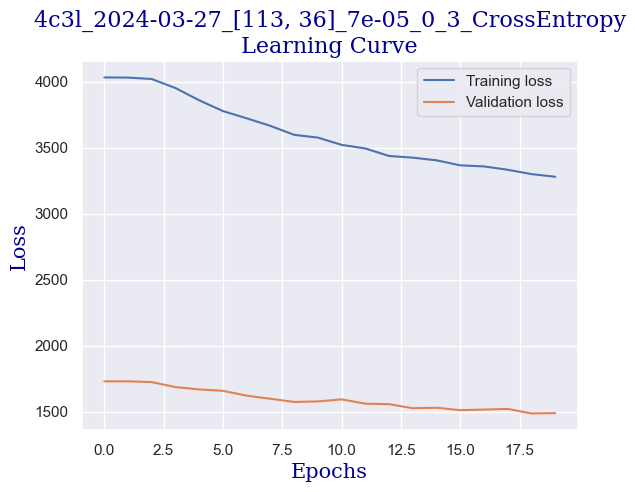

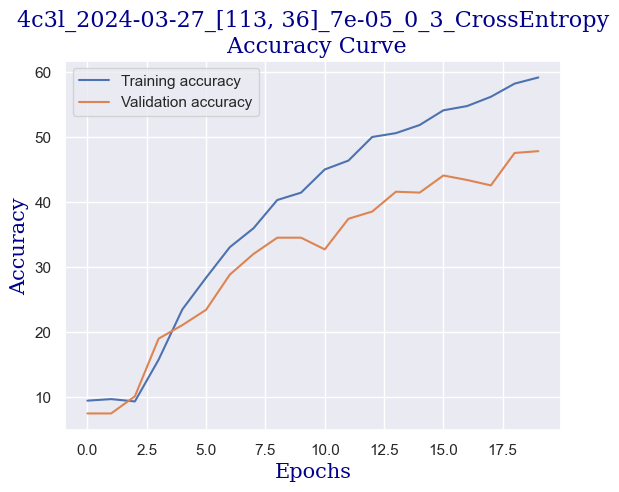

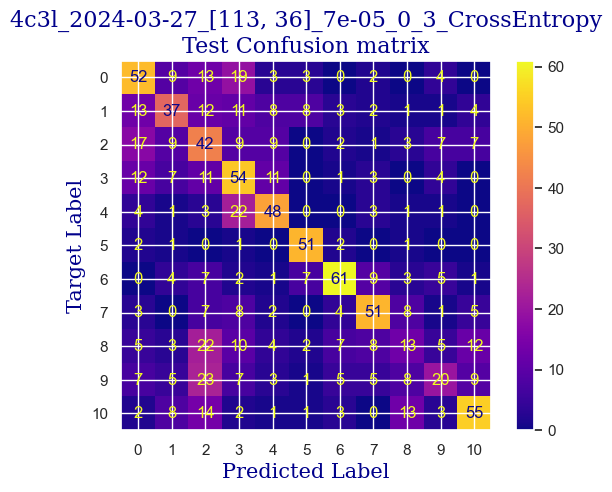

 
 END 4c3l [113, 36] Run Time:  195.5286402480001
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
4106.073622854
4095.149504569
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.387864366448543
validating...


  5%|██▊                                                      | 1/20 [00:09<03:00,  9.51s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.1017251635931
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:54,  9.68s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.57763236168947
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.50s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.280190362879239
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:33,  9.59s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  10.113027959547887
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:20,  9.40s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.767400356930398
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:06,  9.01s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  13.979773944080904
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:57,  9.05s/it]

validation accuracy:  16.643550624133148
Training...
train accuracy:  24.15229030339084
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:49,  9.09s/it]

validation accuracy:  25.79750346740638
Training...
train accuracy:  32.36168947055324
validating...


 45%|█████████████████████████▋                               | 9/20 [01:23<01:41,  9.25s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  36.04997025580012
validating...


 50%|████████████████████████████                            | 10/20 [01:32<01:32,  9.30s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  40.03569303985723
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:42<01:24,  9.35s/it]

validation accuracy:  27.600554785020805
Training...
train accuracy:  41.82034503271862
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:51<01:15,  9.38s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  42.9506246281975
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:01<01:06,  9.46s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  43.60499702558001
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:10<00:56,  9.41s/it]

validation accuracy:  44.79889042995839
Training...
train accuracy:  46.162998215348004
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:20<00:47,  9.42s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  47.947650208209396
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:29<00:37,  9.42s/it]

validation accuracy:  45.35367545076283
Training...
train accuracy:  48.720999405116
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:39<00:28,  9.41s/it]

validation accuracy:  47.71151178918169
Training...
train accuracy:  48.89946460440214
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:48<00:18,  9.49s/it]

validation accuracy:  44.9375866851595
Training...
train accuracy:  49.13741820345033
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:57<00:09,  9.40s/it]

validation accuracy:  44.9375866851595
Training...
train accuracy:  50.148720999405114
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:07<00:00,  9.38s/it]

validation accuracy:  46.18585298196949
Testing...


 
 train acc:  50.148720999405114
 
 val acc:  46.18585298196949
 
 test acc:  41.359223300970875


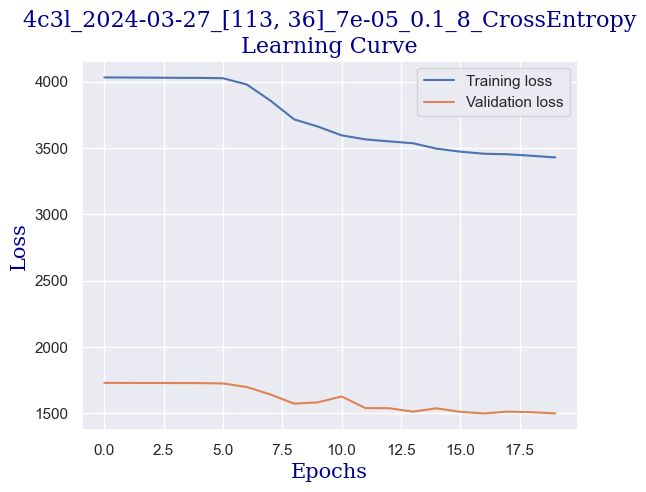

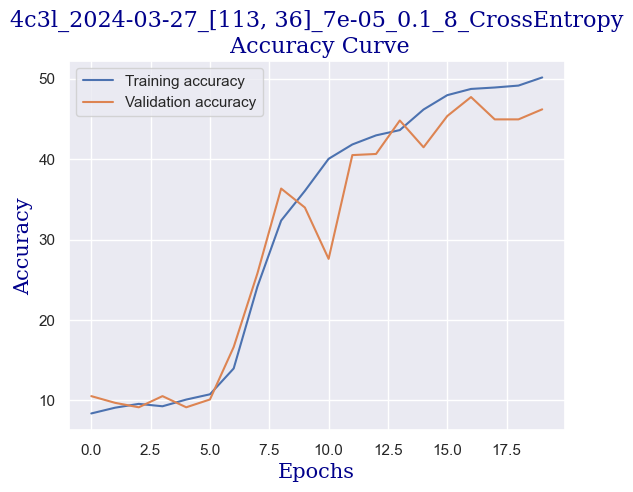

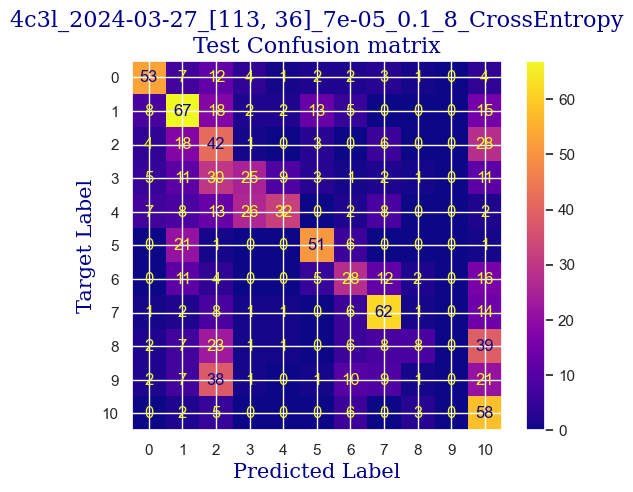

 
 END 4c3l [113, 36] Run Time:  193.9852942110001
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
4300.06040921
4289.1363019400005
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.625817965496728
validating...


  5%|██▊                                                      | 1/20 [00:09<03:00,  9.50s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  9.518143961927423
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:53,  9.62s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.945865556216537
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.47s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:32,  9.55s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.421772754312908
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.40s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  13.38488994646044
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.48s/it]

validation accuracy:  17.753120665742024
Training...
train accuracy:  20.82093991671624
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.47s/it]

validation accuracy:  21.7753120665742
Training...
train accuracy:  26.115407495538367
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.41s/it]

validation accuracy:  24.133148404993065
Training...
train accuracy:  29.44675788221297
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.41s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  30.93396787626413
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:33,  9.39s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  34.38429506246282
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:25,  9.55s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  35.39559785841761
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:16,  9.52s/it]

validation accuracy:  30.79056865464632
Training...
train accuracy:  38.48899464604402
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.49s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  39.26234384295063
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.40s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  40.63057703747769
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.45s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  42.117787031528856
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.38s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  43.307555026769776
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.39s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  46.87685901249257
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.43s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  47.88816180844736
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.37s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  49.01844140392623
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.45s/it]

validation accuracy:  34.674063800277395
Testing...


 
 train acc:  49.01844140392623
 
 val acc:  34.674063800277395
 
 test acc:  34.368932038834956


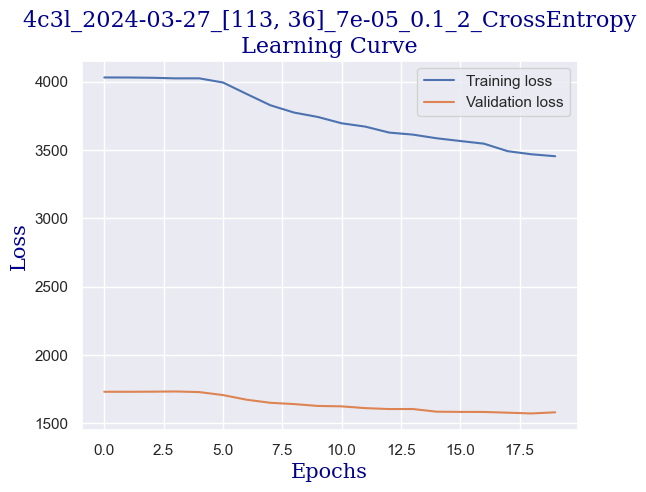

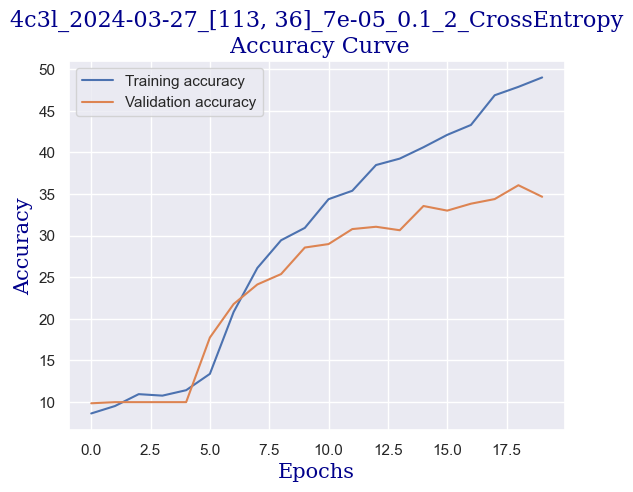

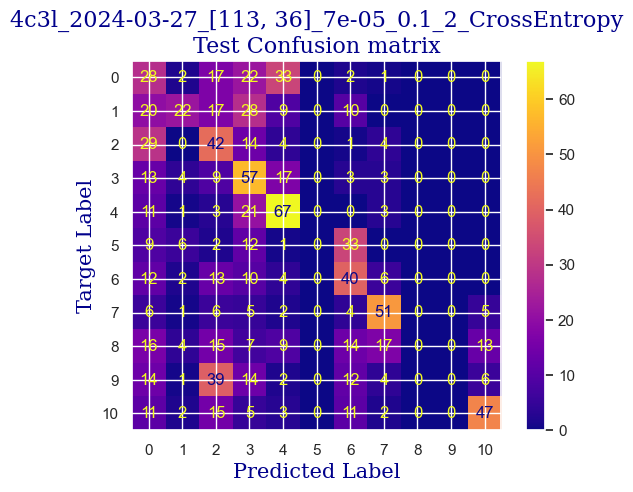

 
 END 4c3l [113, 36] Run Time:  195.46292466700015
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
4495.524319512
4484.600205522001
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.696609161213564
validating...


  5%|██▊                                                      | 1/20 [00:09<03:03,  9.68s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.161213563355146
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.51s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.886377156454492
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.44s/it]

validation accuracy:  11.650485436893204
Training...
train accuracy:  17.251635930993455
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:32,  9.54s/it]

validation accuracy:  22.330097087378643
Training...
train accuracy:  26.591314693634743
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.40s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  29.56573468173706
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.48s/it]

validation accuracy:  24.271844660194176
Training...
train accuracy:  32.54015466983938
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.48s/it]

validation accuracy:  27.184466019417474
Training...
train accuracy:  33.908387864366446
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.49s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  35.39559785841761
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.45s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  35.27662105889352
validating...


 50%|████████████████████████████                            | 10/20 [01:35<01:36,  9.62s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  37.9535990481856
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:24,  9.43s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  38.13206424747174
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.41s/it]

validation accuracy:  32.31622746185853
Training...
train accuracy:  39.08387864366449
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.44s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  39.97620464009518
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.43s/it]

validation accuracy:  32.593619972260754
Training...
train accuracy:  40.57108863771565
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:22<00:47,  9.46s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  40.214158239143366
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.42s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  42.23676383105294
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.40s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  43.842950624628195
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:19,  9.60s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  43.96192742415229
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [03:00<00:09,  9.49s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  43.36704342653183
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.50s/it]

validation accuracy:  38.41886269070735
Testing...


 
 train acc:  43.36704342653183
 
 val acc:  38.41886269070735
 
 test acc:  38.83495145631068


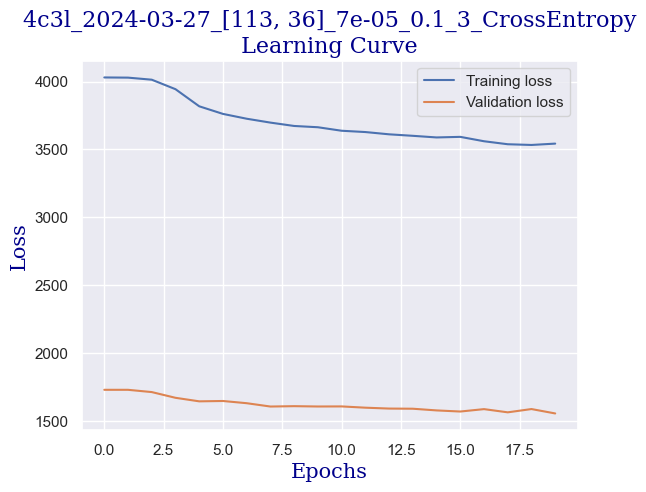

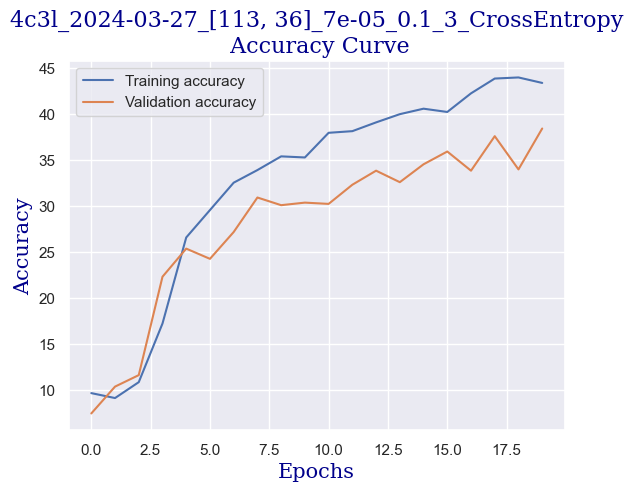

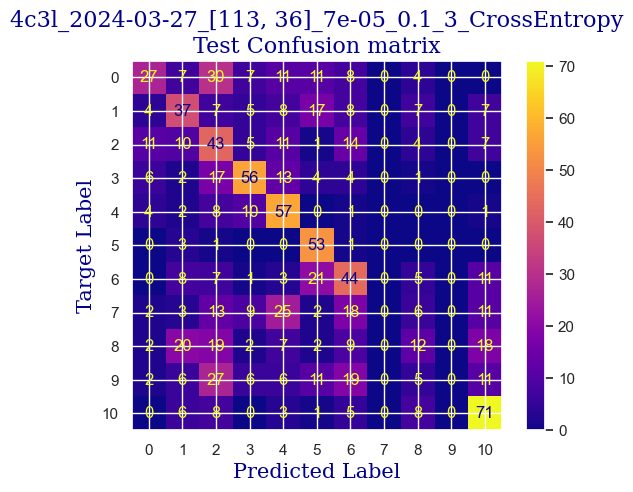

 
 END 4c3l [113, 36] Run Time:  196.27969639000003
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
4691.805148646
4680.881035673
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.458655562165378
validating...


  5%|██▊                                                      | 1/20 [00:09<03:02,  9.62s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:53,  9.63s/it]

validation accuracy:  15.950069348127602
Training...
train accuracy:  19.15526472337894
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.44s/it]

validation accuracy:  26.0748959778086
Training...
train accuracy:  27.543129089827485
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:33,  9.60s/it]

validation accuracy:  28.43273231622746
Training...
train accuracy:  32.3022010707912
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:23,  9.54s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  35.455086258179655
validating...


 30%|█████████████████                                        | 6/20 [00:57<02:13,  9.56s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  37.477691850089236
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.54s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  38.786436644854255
validating...


 40%|██████████████████████▊                                  | 8/20 [01:16<01:54,  9.53s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  39.67876264128495
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.45s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  39.73825104104699
validating...


 50%|████████████████████████████                            | 10/20 [01:35<01:36,  9.69s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  41.879833432480666
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:45<01:26,  9.58s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  43.12908982748364
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:54<01:16,  9.50s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  43.78346222486615
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:04<01:06,  9.55s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  43.90243902439025
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:13<00:56,  9.49s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  45.33016061867936
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:23<00:47,  9.52s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  47.293277810826886
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:32<00:37,  9.39s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  49.256395002974415
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:41<00:28,  9.45s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  49.91076740035693
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:51<00:18,  9.46s/it]

validation accuracy:  44.9375866851595
Training...
train accuracy:  52.11183819155265
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [03:01<00:09,  9.62s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  52.944675788221296
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:10<00:00,  9.53s/it]

validation accuracy:  42.163661581137305
Testing...


 
 train acc:  52.944675788221296
 
 val acc:  42.163661581137305
 
 test acc:  40.58252427184466


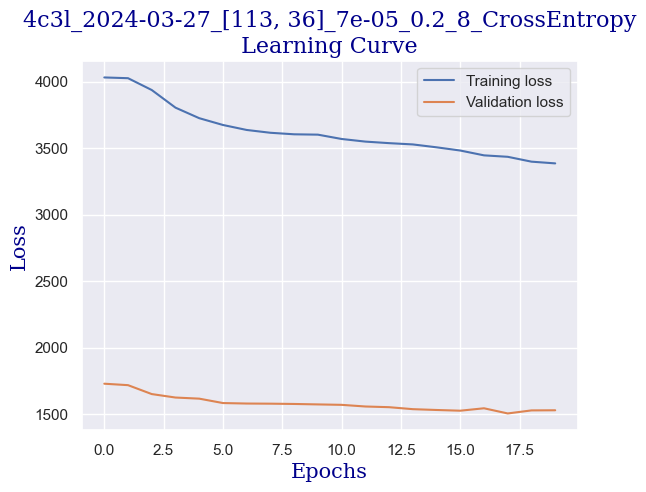

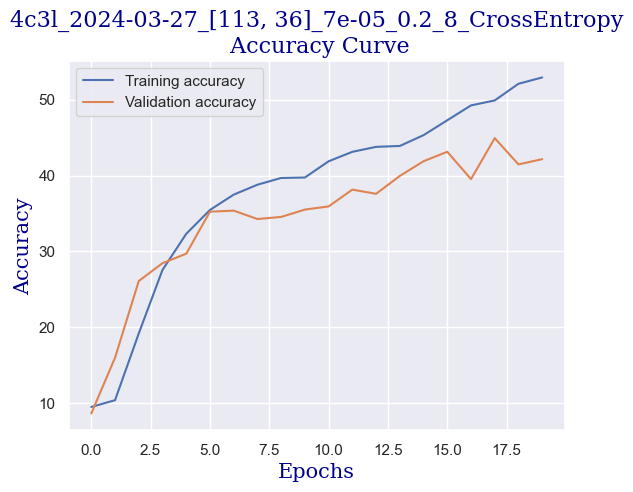

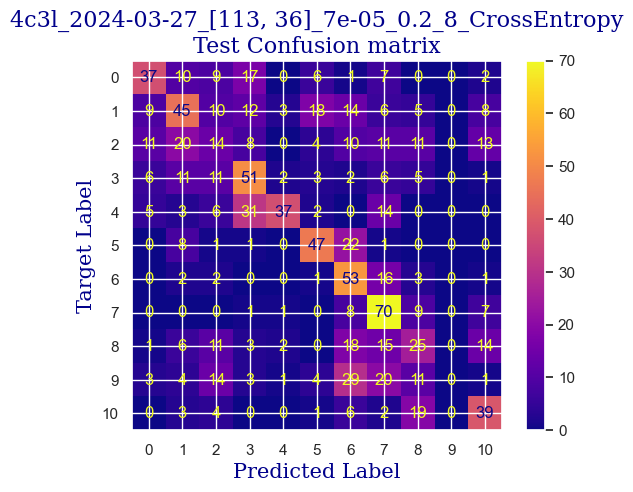

 
 END 4c3l [113, 36] Run Time:  196.85645626299993
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
4888.66263043
4877.738521776
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.923259964306961
validating...


  5%|██▊                                                      | 1/20 [00:09<03:03,  9.67s/it]

validation accuracy:  10.679611650485436
Training...
train accuracy:  10.41046995835812
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:52,  9.56s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.458655562165378
validating...


 15%|████████▌                                                | 3/20 [00:28<02:42,  9.55s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.41046995835812
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:31,  9.50s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.994051160023796
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:23,  9.58s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.172516359309935
validating...


 30%|█████████████████                                        | 6/20 [00:57<02:12,  9.47s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.421772754312908
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:02,  9.46s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.24330755502677
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.46s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  16.954193932183223
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.41s/it]

validation accuracy:  21.7753120665742
Training...
train accuracy:  25.163593099345626
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.47s/it]

validation accuracy:  23.71705963938974
Training...
train accuracy:  28.494943486020226
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:24,  9.38s/it]

validation accuracy:  23.994452149791957
Training...
train accuracy:  33.0755502676978
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.48s/it]

validation accuracy:  28.155339805825243
Training...
train accuracy:  34.62224866151101
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.47s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  36.94229625223082
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:57,  9.55s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  39.97620464009518
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:46,  9.39s/it]

validation accuracy:  22.330097087378643
Training...
train accuracy:  41.82034503271862
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.40s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  43.842950624628195
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:41<00:28,  9.47s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  45.15169541939322
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.47s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  45.3896490184414
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.38s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  46.519928613920285
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.48s/it]

validation accuracy:  34.25797503467407
Testing...


 
 train acc:  46.519928613920285
 
 val acc:  34.25797503467407
 
 test acc:  38.543689320388346


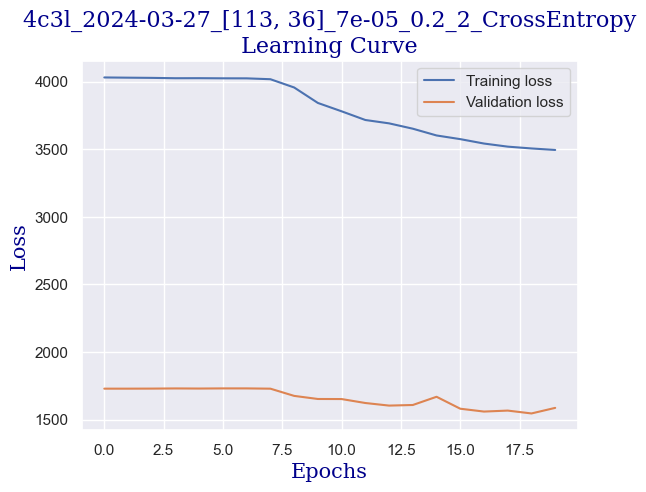

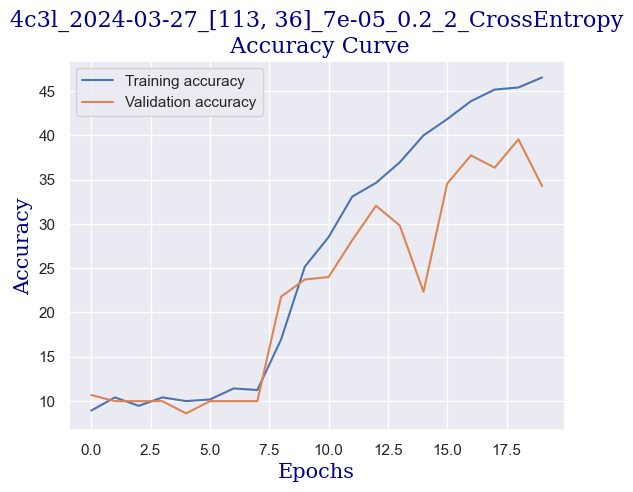

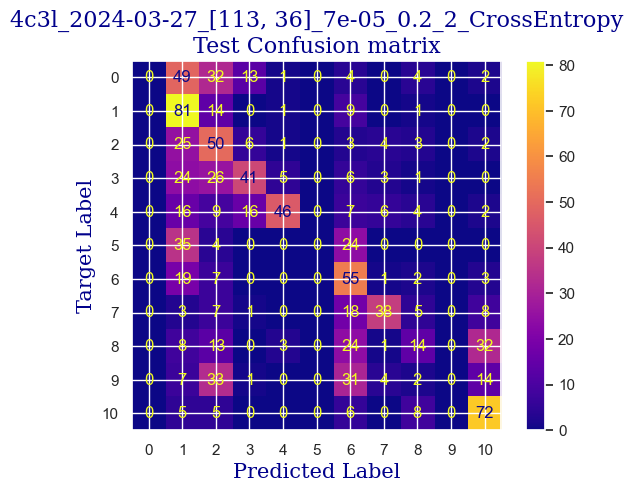

 
 END 4c3l [113, 36] Run Time:  195.84952085300029
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
5084.513094051
5073.588976946
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.161213563355146
validating...


  5%|██▊                                                      | 1/20 [00:09<03:04,  9.72s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.458655562165378
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.54s/it]

validation accuracy:  11.095700416088766
Training...
train accuracy:  18.560380725758478
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.52s/it]

validation accuracy:  20.665742024965326
Training...
train accuracy:  25.698988697204044
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:31,  9.49s/it]

validation accuracy:  25.104022191400833
Training...
train accuracy:  30.220107079119572
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.44s/it]

validation accuracy:  29.958391123439664
Training...
train accuracy:  33.49196906603213
validating...


 30%|█████████████████                                        | 6/20 [00:57<02:13,  9.51s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  37.23973825104105
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.48s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  40.15466983938132
validating...


 40%|██████████████████████▊                                  | 8/20 [01:16<01:54,  9.56s/it]

validation accuracy:  22.88488210818308
Training...
train accuracy:  43.36704342653183
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:44,  9.50s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  45.09220701963117
validating...


 50%|████████████████████████████                            | 10/20 [01:35<01:35,  9.55s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  45.56811421772755
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:24,  9.42s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  48.066627007733494
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.46s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  47.59071980963712
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.43s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  49.79179060083283
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.36s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  51.75490779298036
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:22<00:47,  9.49s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  53.837001784651996
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.45s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  50.386674598453304
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:41<00:28,  9.48s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  54.19393218322427
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.46s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  54.550862581796544
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [03:00<00:09,  9.47s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  54.729327781082695
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.47s/it]

validation accuracy:  43.5506241331484
Testing...


 
 train acc:  54.729327781082695
 
 val acc:  43.5506241331484
 
 test acc:  42.62135922330097


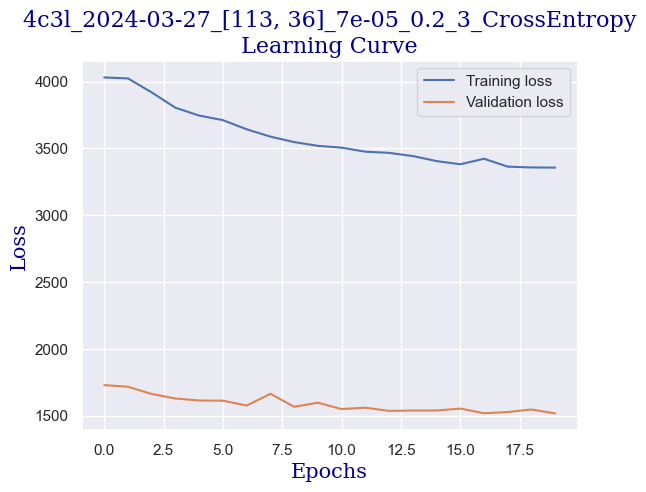

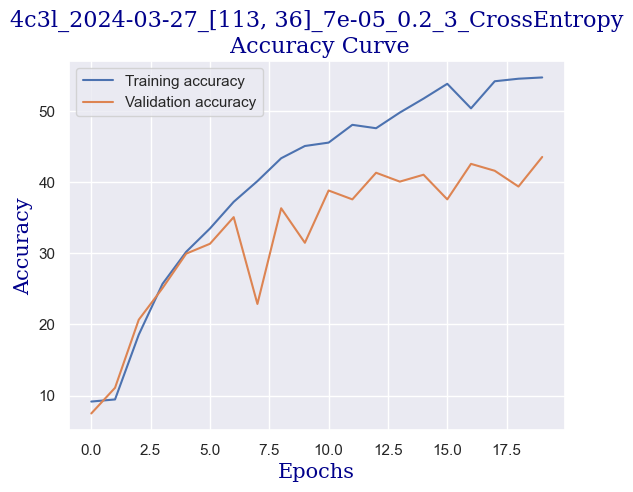

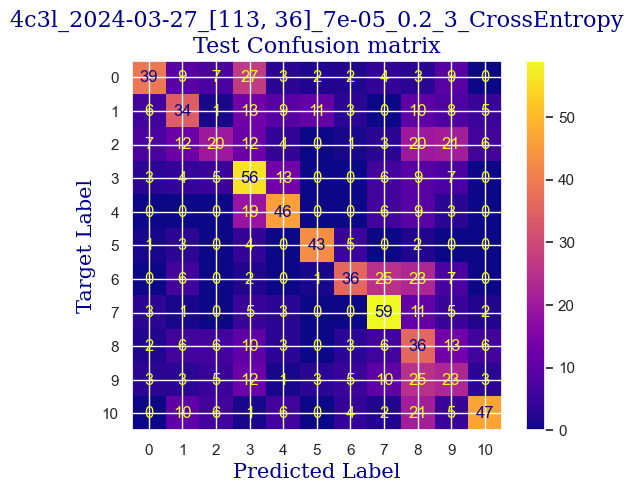

 
 END 4c3l [113, 36] Run Time:  195.6735370870001
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
5280.187592668
5269.263475387
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.339678762641284
validating...


  5%|██▊                                                      | 1/20 [00:09<03:03,  9.67s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:52,  9.60s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.696609161213564
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.53s/it]

validation accuracy:  11.789181692094314
Training...
train accuracy:  14.098750743604995
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:31,  9.45s/it]

validation accuracy:  20.527045769764214
Training...
train accuracy:  23.79535990481856
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:22,  9.51s/it]

validation accuracy:  28.29403606102635
Training...
train accuracy:  30.101130279595477
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:11,  9.40s/it]

validation accuracy:  29.403606102635226
Training...
train accuracy:  34.86020226055919
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:04,  9.54s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  37.477691850089236
validating...


 40%|██████████████████████▊                                  | 8/20 [01:16<01:54,  9.52s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  38.31052944675788
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.43s/it]

validation accuracy:  29.958391123439664
Training...
train accuracy:  41.64187983343248
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.49s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  43.78346222486615
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:24,  9.38s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  44.37834622248661
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.46s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  46.69839381320642
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.44s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  47.947650208209396
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.44s/it]

validation accuracy:  44.79889042995839
Training...
train accuracy:  48.89946460440214
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.43s/it]

validation accuracy:  44.24410540915395
Training...
train accuracy:  50.803093396787624
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:38,  9.51s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  50.684116597263525
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.43s/it]

validation accuracy:  45.35367545076283
Training...
train accuracy:  53.837001784651996
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.43s/it]

validation accuracy:  44.521497919556175
Training...
train accuracy:  54.84830458060678
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.47s/it]

validation accuracy:  44.382801664355064
Training...
train accuracy:  54.19393218322427
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.46s/it]

validation accuracy:  46.74063800277393
Testing...


 
 train acc:  54.19393218322427
 
 val acc:  46.74063800277393
 
 test acc:  43.49514563106796


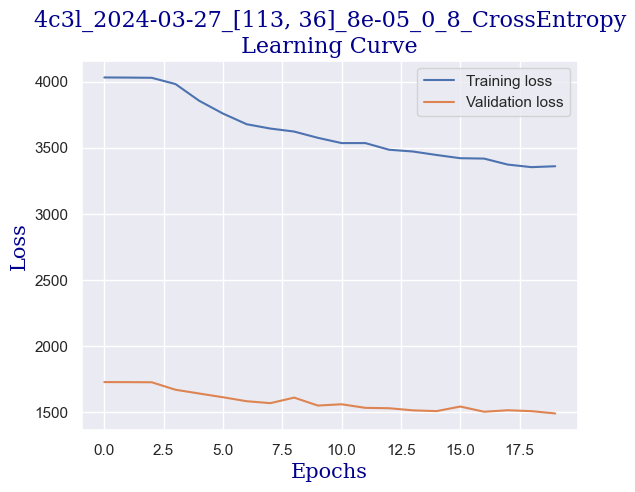

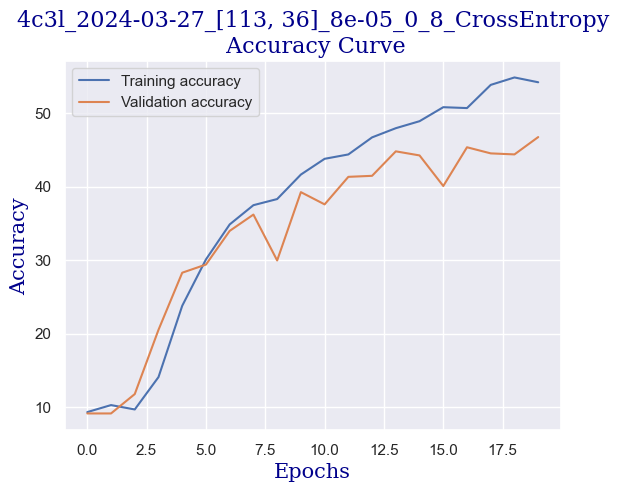

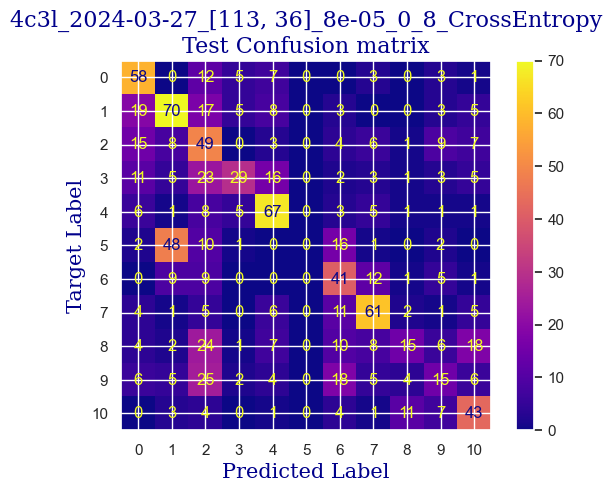

 
 END 4c3l [113, 36] Run Time:  195.48420186699968
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
5475.672721042
5464.748603008
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.923259964306961
validating...


  5%|██▊                                                      | 1/20 [00:09<03:04,  9.68s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.56s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.469958358120167
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.50s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.659726353361094
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:31,  9.46s/it]

validation accuracy:  10.263522884882107
Training...
train accuracy:  14.515169541939322
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:23,  9.58s/it]

validation accuracy:  17.05963938973648
Training...
train accuracy:  22.66508030933968
validating...


 30%|█████████████████                                        | 6/20 [00:57<02:12,  9.46s/it]

validation accuracy:  24.410540915395284
Training...
train accuracy:  30.87447947650208
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.48s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  34.800713860797146
validating...


 40%|██████████████████████▊                                  | 8/20 [01:16<01:54,  9.55s/it]

validation accuracy:  32.31622746185853
Training...
train accuracy:  37.120761451516955
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.43s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  38.60797144556811
validating...


 50%|████████████████████████████                            | 10/20 [01:35<01:35,  9.51s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  39.202855443188575
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:24,  9.39s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  41.93932183224271
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:54<01:16,  9.57s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  43.24806662700773
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.51s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  45.33016061867936
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.40s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  44.55681142177275
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:22<00:47,  9.44s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  48.24509220701963
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.42s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  46.87685901249257
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:41<00:28,  9.45s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  48.89946460440214
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.45s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  49.732302201070794
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [03:00<00:09,  9.48s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  49.43486020226056
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.47s/it]

validation accuracy:  39.528432732316226
Testing...


 
 train acc:  49.43486020226056
 
 val acc:  39.528432732316226
 
 test acc:  44.271844660194176


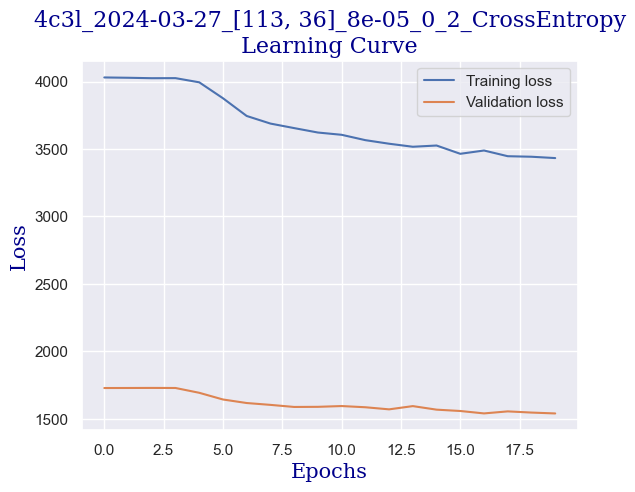

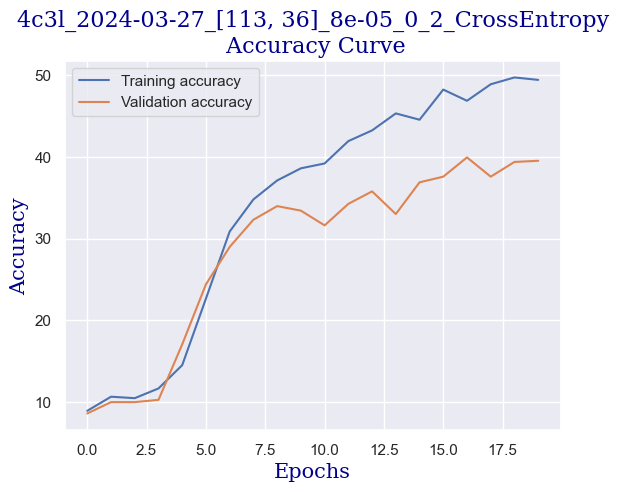

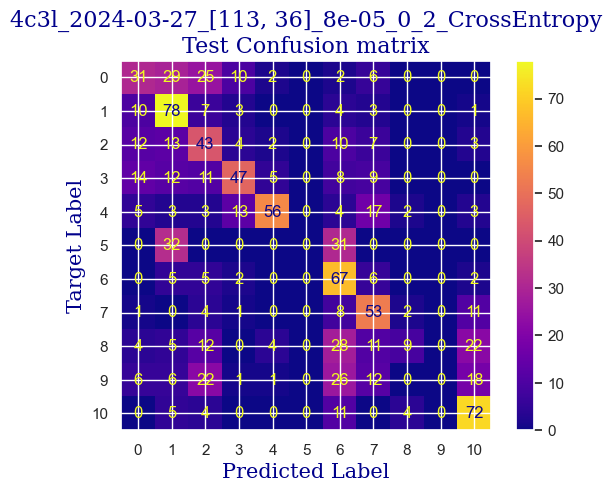

 
 END 4c3l [113, 36] Run Time:  195.6498028419992
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
5671.323593529
5660.3994812460005
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.625817965496728
validating...


  5%|██▊                                                      | 1/20 [00:09<03:04,  9.70s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.172516359309935
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.52s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.053539559785841
validating...


 15%|████████▌                                                | 3/20 [00:28<02:41,  9.49s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  10.648423557406305
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:31,  9.44s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.41046995835812
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:22,  9.50s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.161213563355146
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.46s/it]

validation accuracy:  11.789181692094314
Training...
train accuracy:  12.73051754907793
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:03,  9.52s/it]

validation accuracy:  16.22746185852982
Training...
train accuracy:  21.058893515764428
validating...


 40%|██████████████████████▊                                  | 8/20 [01:16<01:54,  9.50s/it]

validation accuracy:  18.723994452149793
Training...
train accuracy:  23.914336704342652
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.40s/it]

validation accuracy:  21.914008321775313
Training...
train accuracy:  25.93694229625223
validating...


 50%|████████████████████████████                            | 10/20 [01:35<01:35,  9.58s/it]

validation accuracy:  26.352288488210817
Training...
train accuracy:  28.970850684116595
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:25,  9.55s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  34.38429506246282
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:54<01:16,  9.52s/it]

validation accuracy:  28.84882108183079
Training...
train accuracy:  36.466389054134446
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.49s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  38.13206424747174
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:13<00:56,  9.48s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  38.66745984533016
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:22<00:47,  9.42s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  41.4039262343843
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.46s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  41.34443783462225
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:41<00:28,  9.40s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  42.9506246281975
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.40s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  43.307555026769776
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [03:00<00:09,  9.45s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  44.02141582391434
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.46s/it]

validation accuracy:  37.7253814147018
Testing...


 
 train acc:  44.02141582391434
 
 val acc:  37.7253814147018
 
 test acc:  37.76699029126214


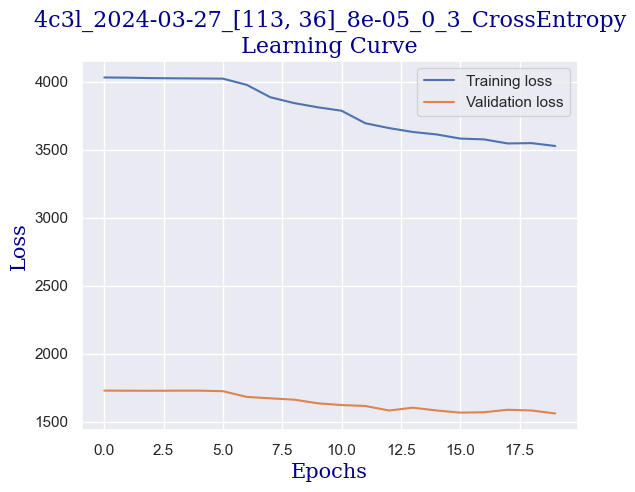

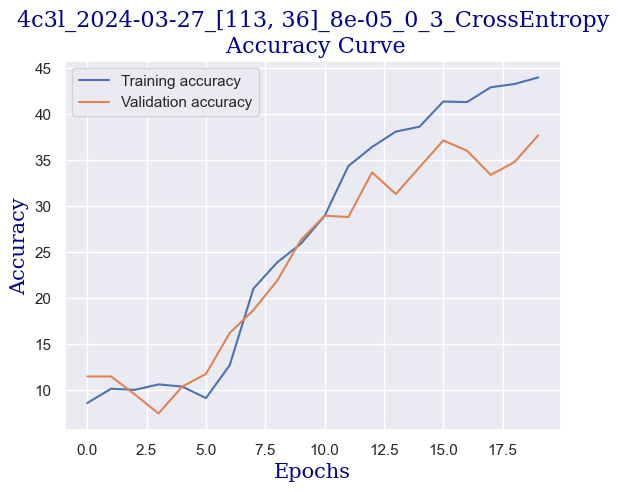

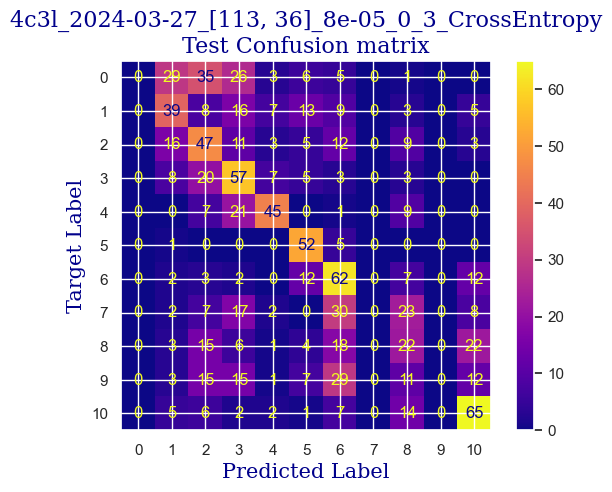

 
 END 4c3l [113, 36] Run Time:  195.6504410059997
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
5866.975342461
5856.051237543
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.042236763831053
validating...


  5%|██▊                                                      | 1/20 [00:09<02:58,  9.39s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  9.57763236168947
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:48,  9.38s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  9.934562760261748
validating...


 15%|████████▌                                                | 3/20 [00:28<02:43,  9.59s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  11.719214753123142
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:31,  9.49s/it]

validation accuracy:  17.198335644937586
Training...
train accuracy:  19.631171921475314
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.44s/it]

validation accuracy:  21.497919556171983
Training...
train accuracy:  27.78108268887567
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:12,  9.47s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  30.458060678167758
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:02,  9.41s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  37.180249851279
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.48s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  38.48899464604402
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.39s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  40.98750743604997
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.47s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  43.60499702558001
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:25,  9.49s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  44.55681142177275
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.46s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  46.2819750148721
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:05,  9.42s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  48.483045806067814
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:55,  9.31s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  50.089232599643076
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:46,  9.39s/it]

validation accuracy:  42.995839112343965
Training...
train accuracy:  52.409280190362885
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.40s/it]

validation accuracy:  46.601941747572816
Training...
train accuracy:  53.77751338488994
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.43s/it]

validation accuracy:  48.95977808599168
Training...
train accuracy:  55.02676977989292
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.40s/it]

validation accuracy:  47.43411927877948
Training...
train accuracy:  58.06067816775729
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.60s/it]

validation accuracy:  47.8502080443828
Training...
train accuracy:  59.19095776323617
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.45s/it]

validation accuracy:  49.237170596393895
Testing...


 
 train acc:  59.19095776323617
 
 val acc:  49.237170596393895
 
 test acc:  45.922330097087375


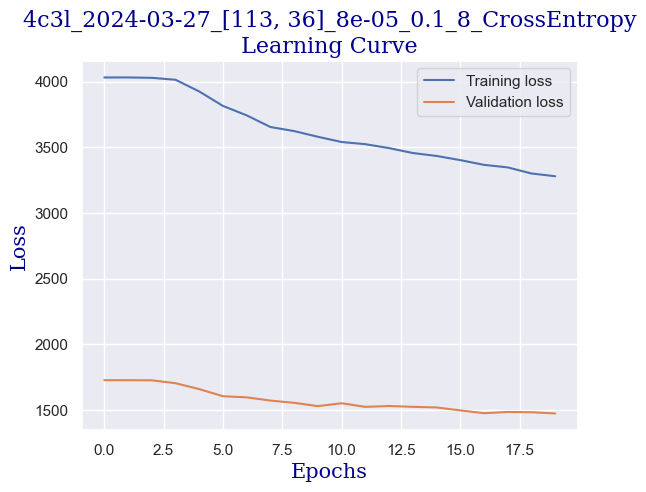

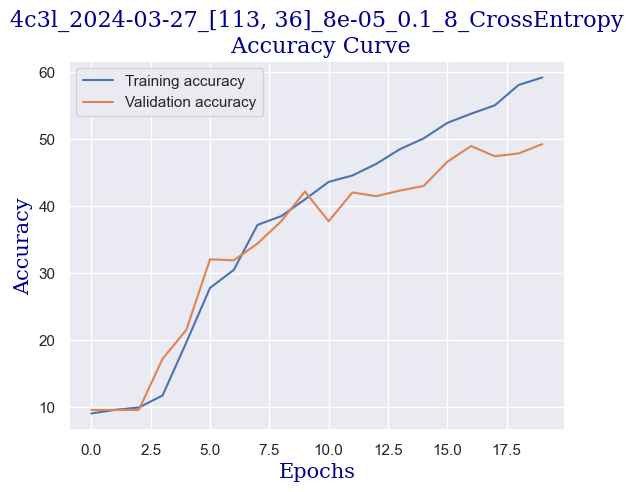

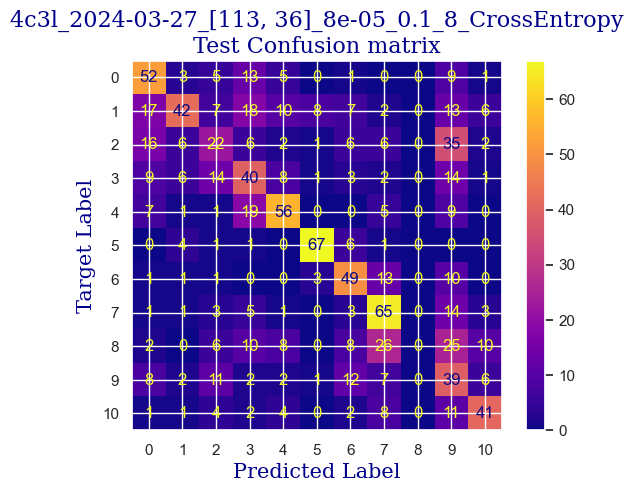

 
 END 4c3l [113, 36] Run Time:  195.7205964220002
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
6062.696862966
6051.772746916
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.923259964306961
validating...


  5%|██▊                                                      | 1/20 [00:09<03:02,  9.63s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.529446757882214
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.50s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  19.928613920285546
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.47s/it]

validation accuracy:  32.17753120665742
Training...
train accuracy:  32.36168947055324
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:30,  9.38s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  33.908387864366446
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:22,  9.50s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  38.786436644854255
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:11,  9.39s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  40.98750743604997
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:01,  9.36s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  43.66448542534206
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:53,  9.46s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  44.02141582391434
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:43,  9.42s/it]

validation accuracy:  44.66019417475729
Training...
train accuracy:  43.78346222486615
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.46s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  46.162998215348004
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:25,  9.46s/it]

validation accuracy:  45.49237170596394
Training...
train accuracy:  47.88816180844736
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:16,  9.50s/it]

validation accuracy:  46.3245492371706
Training...
train accuracy:  47.11481261154075
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.48s/it]

validation accuracy:  48.54368932038835
Training...
train accuracy:  48.483045806067814
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:56,  9.43s/it]

validation accuracy:  48.54368932038835
Training...
train accuracy:  49.97025580011898
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.52s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  49.732302201070794
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.47s/it]

validation accuracy:  45.76976421636616
Training...
train accuracy:  51.576442593694225
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.47s/it]

validation accuracy:  46.18585298196949
Training...
train accuracy:  52.52825698988697
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.44s/it]

validation accuracy:  47.57281553398058
Training...
train accuracy:  54.07495538370017
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.48s/it]

validation accuracy:  47.988904299583915
Training...
train accuracy:  53.12314098750743
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.45s/it]

validation accuracy:  48.95977808599168
Testing...


 
 train acc:  53.12314098750743
 
 val acc:  48.95977808599168
 
 test acc:  46.504854368932044


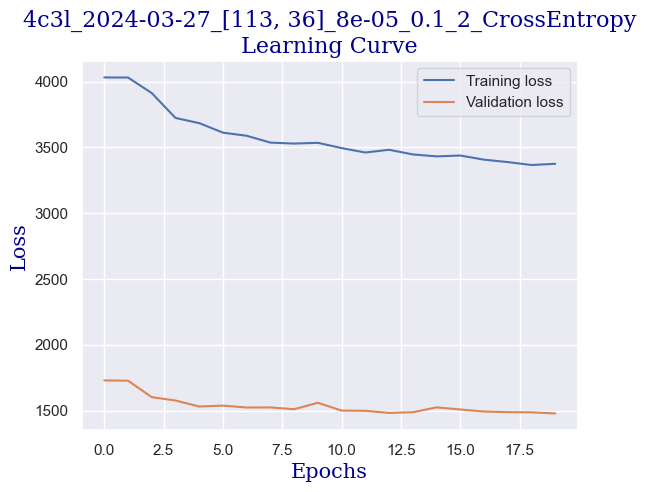

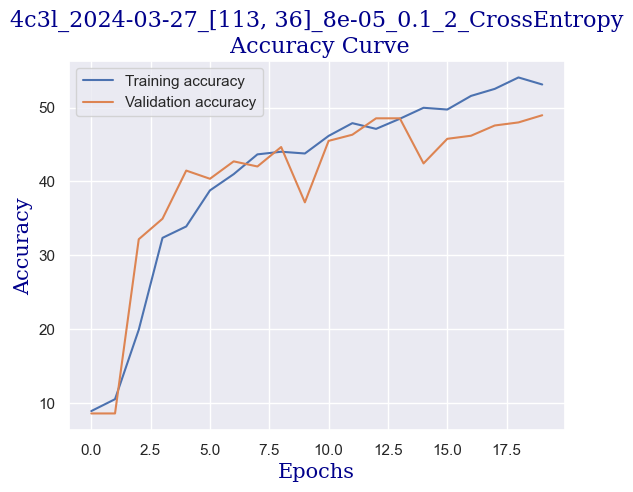

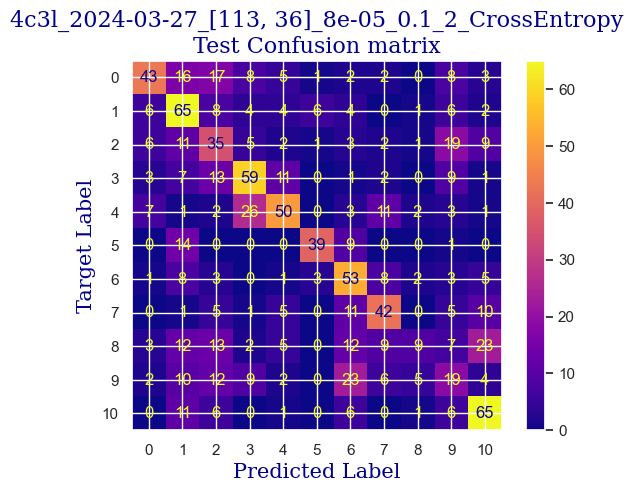

 
 END 4c3l [113, 36] Run Time:  195.22793295500014
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
6257.925844
6247.001728474001
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  7.971445568114217
validating...


  5%|██▊                                                      | 1/20 [00:09<03:01,  9.57s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.23200475907198
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.50s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.767400356930398
validating...


 15%|████████▌                                                | 3/20 [00:28<02:40,  9.46s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.826888756692444
validating...


 20%|███████████▍                                             | 4/20 [00:37<02:30,  9.39s/it]

validation accuracy:  12.89875173370319
Training...
train accuracy:  20.226055919095774
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:21,  9.45s/it]

validation accuracy:  23.994452149791957
Training...
train accuracy:  28.13801308744795
validating...


 30%|█████████████████                                        | 6/20 [00:56<02:10,  9.35s/it]

validation accuracy:  28.29403606102635
Training...
train accuracy:  32.42117787031529
validating...


 35%|███████████████████▉                                     | 7/20 [01:05<02:02,  9.42s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  34.443783462224864
validating...


 40%|██████████████████████▊                                  | 8/20 [01:15<01:52,  9.37s/it]

validation accuracy:  32.31622746185853
Training...
train accuracy:  37.418203450327184
validating...


 45%|█████████████████████████▋                               | 9/20 [01:24<01:42,  9.36s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  35.812016656751936
validating...


 50%|████████████████████████████                            | 10/20 [01:34<01:34,  9.49s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  39.38132064247471
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:43<01:24,  9.39s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  40.333135038667464
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:52<01:14,  9.37s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  40.57108863771565
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:02<01:06,  9.44s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  42.534205829863176
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:11<00:56,  9.36s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  41.70136823319452
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:47,  9.58s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  43.307555026769776
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:38,  9.53s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  45.211183819155266
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.53s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  44.735276621058894
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:19,  9.51s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  45.68709101725163
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.57s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  45.627602617489586
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.45s/it]

validation accuracy:  37.586685159500696
Testing...


 
 train acc:  45.627602617489586
 
 val acc:  37.586685159500696
 
 test acc:  40.58252427184466


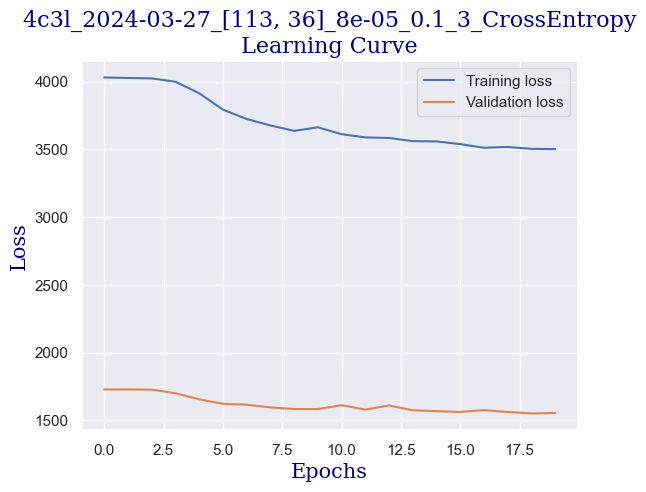

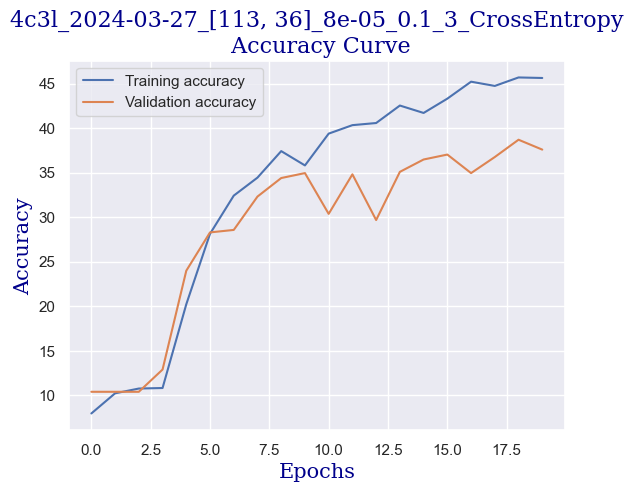

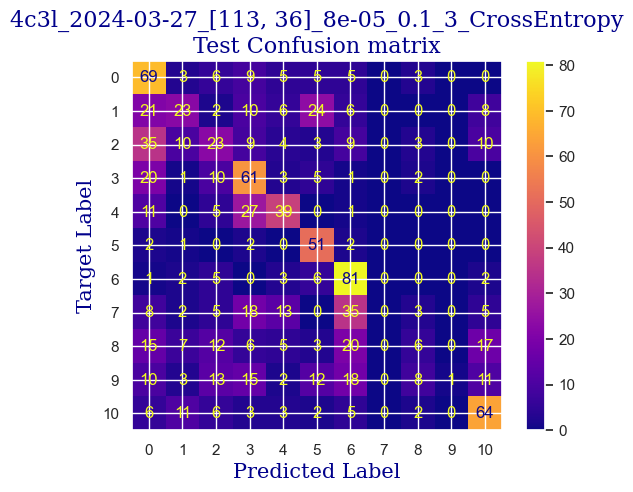

 
 END 4c3l [113, 36] Run Time:  195.41154124399964
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
6453.338460771
6442.4143493930005
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.220701963117191
validating...


  5%|██▊                                                      | 1/20 [00:09<03:06,  9.80s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.696609161213564
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:52,  9.60s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.053539559785841
validating...


 15%|████████▌                                                | 3/20 [00:28<02:43,  9.64s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  45.3896490184414
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:31<00:37,  9.41s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  48.60202260559191
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.41s/it]

validation accuracy:  44.79889042995839
Training...
train accuracy:  49.37537180249851
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:50<00:18,  9.37s/it]

validation accuracy:  47.295423023578365
Training...
train accuracy:  51.63593099345628
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [03:00<00:09,  9.59s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  53.48007138607972
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.48s/it]

validation accuracy:  43.828016643550626
Testing...


 
 train acc:  53.48007138607972
 
 val acc:  43.828016643550626
 
 test acc:  41.55339805825243


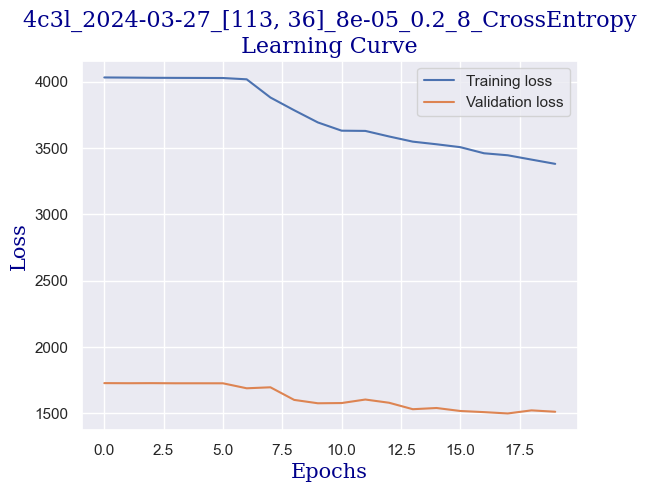

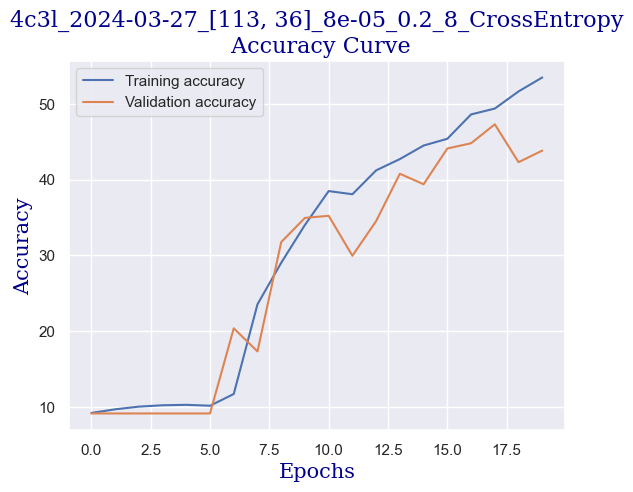

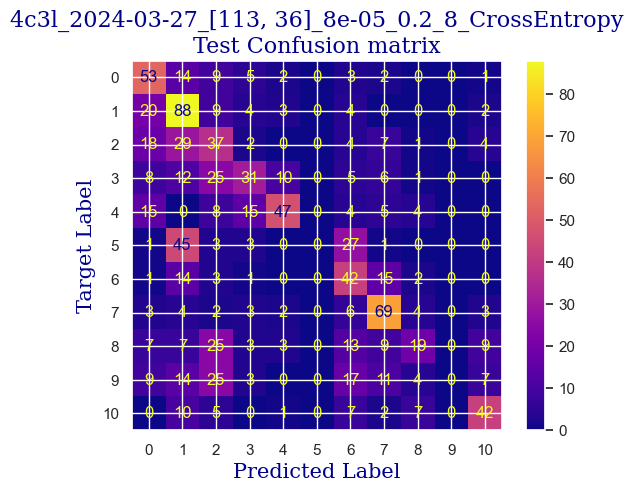

 
 END 4c3l [113, 36] Run Time:  195.838432646
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
6649.179459679
6638.255436186
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.815585960737657
validating...


  5%|██▊                                                      | 1/20 [00:09<03:05,  9.77s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.826888756692444
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:52,  9.58s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 15%|████████▌                                                | 3/20 [00:28<02:44,  9.66s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.875074360499703
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:32,  9.51s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 25%|██████████████▎                                          | 5/20 [00:48<02:24,  9.62s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.23200475907198
validating...


 30%|█████████████████                                        | 6/20 [00:57<02:12,  9.46s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.183819155264723
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:04,  9.56s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.053539559785841
validating...


 40%|██████████████████████▊                                  | 8/20 [01:16<01:54,  9.54s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:44,  9.46s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  10.529446757882214
validating...


 50%|████████████████████████████                            | 10/20 [01:35<01:34,  9.42s/it]

validation accuracy:  10.679611650485436
Training...
train accuracy:  16.597263533610946
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:24,  9.38s/it]

validation accuracy:  19.83356449375867
Training...
train accuracy:  23.49791790600833
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:53<01:15,  9.38s/it]

validation accuracy:  23.71705963938974
Training...
train accuracy:  28.970850684116595
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:05,  9.34s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  32.42117787031529
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:12<00:55,  9.27s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  35.217132659131465
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:21<00:46,  9.34s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  38.786436644854255
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:30<00:37,  9.34s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  41.04699583581202
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:40<00:28,  9.36s/it]

validation accuracy:  27.600554785020805
Training...
train accuracy:  43.24806662700773
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:49<00:18,  9.34s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  44.31885782272457
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:59<00:09,  9.46s/it]

validation accuracy:  28.43273231622746
Training...
train accuracy:  45.44913741820345
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:08<00:00,  9.43s/it]

validation accuracy:  35.92233009708738
Testing...


 
 train acc:  45.44913741820345
 
 val acc:  35.92233009708738
 
 test acc:  38.05825242718446


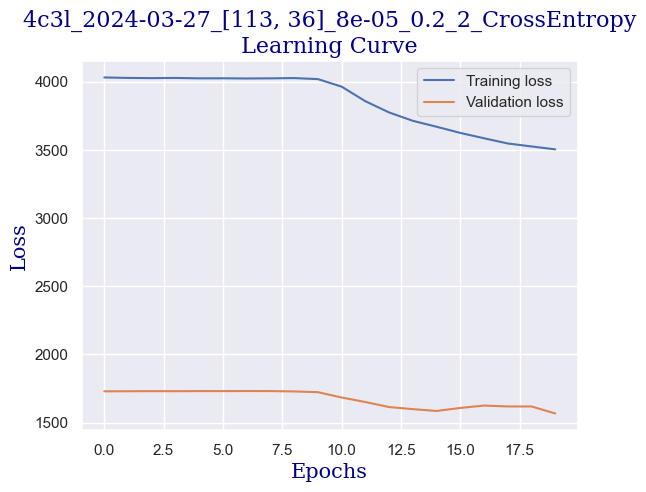

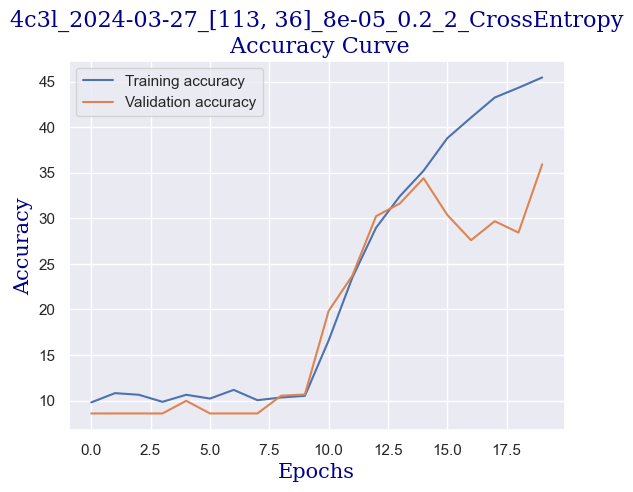

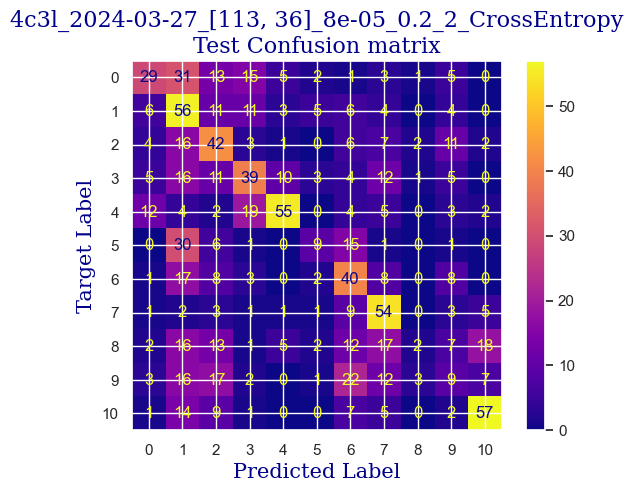

 
 END 4c3l [113, 36] Run Time:  195.01610901000004
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 0 / 5
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
6844.196476409
6833.272358896
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.637120761451518
validating...


  5%|██▊                                                      | 1/20 [00:09<03:05,  9.76s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.637120761451518
validating...


 10%|█████▋                                                   | 2/20 [00:19<02:51,  9.52s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.767400356930398
validating...


 15%|████████▌                                                | 3/20 [00:28<02:43,  9.63s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.778703152885187
validating...


 20%|███████████▍                                             | 4/20 [00:38<02:32,  9.51s/it]

validation accuracy:  11.234396671289876
Training...
train accuracy:  22.427126710291493
validating...


 25%|██████████████▎                                          | 5/20 [00:47<02:24,  9.60s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  30.101130279595477
validating...


 30%|█████████████████                                        | 6/20 [00:57<02:12,  9.45s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  33.016061867935754
validating...


 35%|███████████████████▉                                     | 7/20 [01:06<02:02,  9.42s/it]

validation accuracy:  32.31622746185853
Training...
train accuracy:  34.50327186198691
validating...


 40%|██████████████████████▊                                  | 8/20 [01:16<01:53,  9.50s/it]

validation accuracy:  32.593619972260754
Training...
train accuracy:  36.34741225461035
validating...


 45%|█████████████████████████▋                               | 9/20 [01:25<01:43,  9.42s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  36.58536585365854
validating...


 50%|████████████████████████████                            | 10/20 [01:35<01:35,  9.50s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  37.59666864961332
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:44<01:25,  9.47s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  38.25104104699584
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:54<01:16,  9.62s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  40.749553837001784
validating...


 65%|████████████████████████████████████▍                   | 13/20 [02:03<01:06,  9.54s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  42.23676383105294
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:13<00:57,  9.61s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  38.54848304580607
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:22<00:47,  9.51s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  42.83164782867341
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:32<00:37,  9.46s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  43.842950624628195
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:41<00:28,  9.53s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  44.31885782272457
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:51<00:18,  9.48s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  44.67578822129685
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [03:00<00:09,  9.53s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  44.37834622248661
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:10<00:00,  9.50s/it]

validation accuracy:  41.47018030513176
Testing...


 
 train acc:  44.37834622248661
 
 val acc:  41.47018030513176
 
 test acc:  40.29126213592233


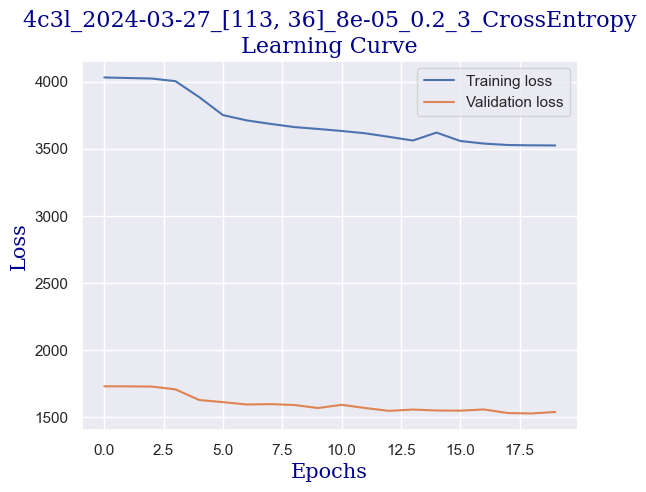

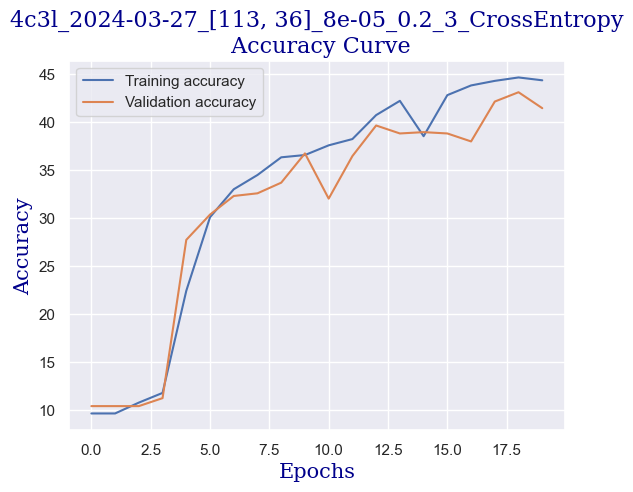

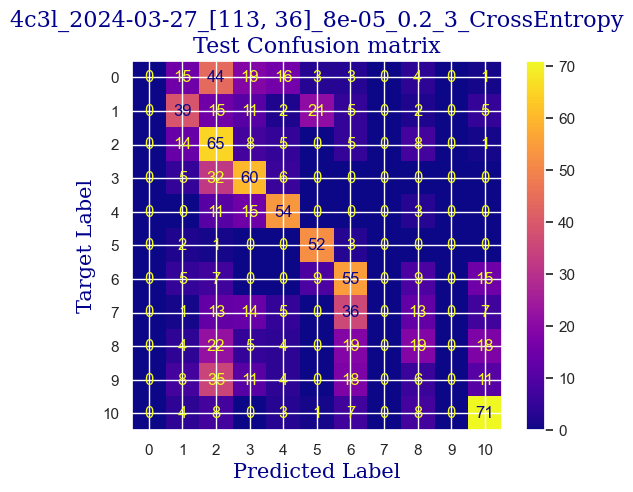

 
 END 4c3l [113, 36] Run Time:  196.42781470200043
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
7040.625152267
7029.701036937
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.815585960737657
validating...


  5%|██▊                                                      | 1/20 [00:09<02:58,  9.37s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.280190362879239
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:45,  9.22s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.75609756097561
validating...


 15%|████████▌                                                | 3/20 [00:27<02:38,  9.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.648423557406305
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:26,  9.18s/it]

validation accuracy:  15.39528432732316
Training...
train accuracy:  15.585960737656157
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:18,  9.25s/it]

validation accuracy:  19.694868238557557
Training...
train accuracy:  25.342058298631763
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:07,  9.09s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  33.19452706722189
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:57,  9.04s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  36.466389054134446
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:49,  9.11s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  40.80904223676383
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:39,  9.07s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  42.23676383105294
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:31,  9.16s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  43.90243902439025
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:21,  9.06s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  44.31885782272457
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:49<01:12,  9.12s/it]

validation accuracy:  45.35367545076283
Training...
train accuracy:  45.80606781677573
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:58<01:03,  9.09s/it]

validation accuracy:  45.214979195561725
Training...
train accuracy:  48.54253420582986
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:07<00:54,  9.03s/it]

validation accuracy:  46.463245492371705
Training...
train accuracy:  49.55383700178465
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:16<00:45,  9.13s/it]

validation accuracy:  48.26629680998613
Training...
train accuracy:  50.50565139797739
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:25<00:36,  9.01s/it]

validation accuracy:  47.988904299583915
Training...
train accuracy:  49.91076740035693
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:35<00:27,  9.15s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  51.21951219512195
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:43<00:17,  8.97s/it]

validation accuracy:  45.214979195561725
Training...
train accuracy:  51.75490779298036
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:52<00:08,  8.94s/it]

validation accuracy:  50.90152565880721
Training...
train accuracy:  52.944675788221296
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:01<00:00,  9.10s/it]

validation accuracy:  43.27323162274618
Testing...


 
 train acc:  52.944675788221296
 
 val acc:  43.27323162274618
 
 test acc:  40.0


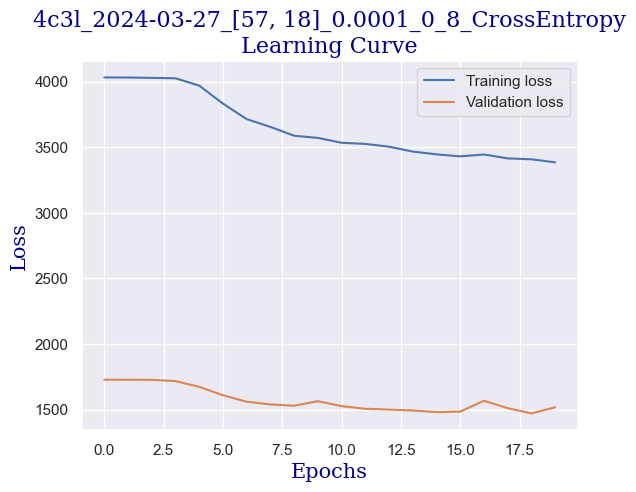

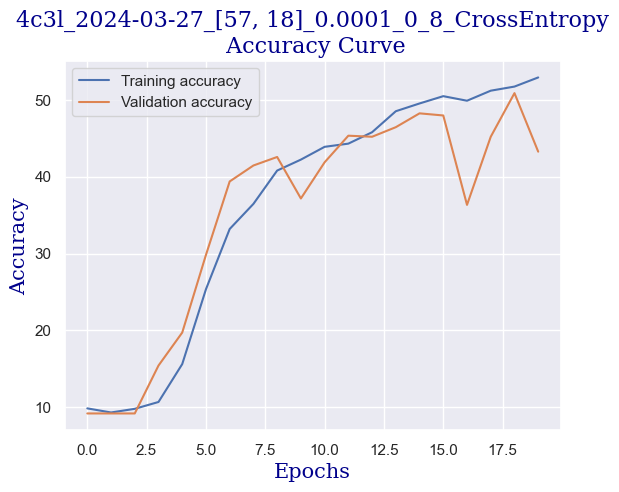

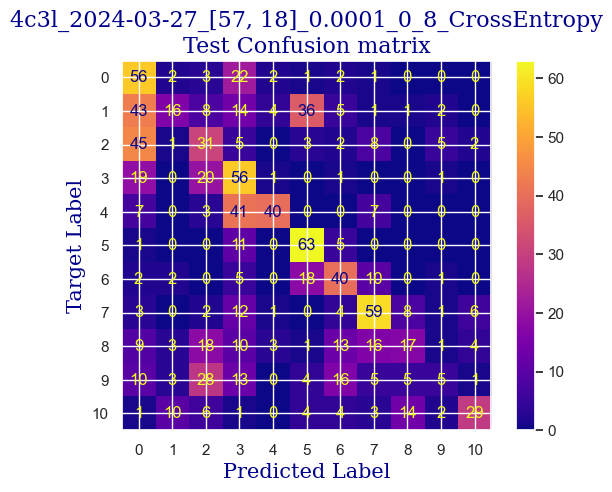

 
 END 4c3l [57, 18] Run Time:  188.23571047699988
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
7228.861779808
7217.937662049
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.982748364069007
validating...


  5%|██▊                                                      | 1/20 [00:09<02:54,  9.16s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.934562760261748
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:45,  9.17s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.113027959547887
validating...


 15%|████████▌                                                | 3/20 [00:27<02:35,  9.13s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.994051160023796
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:26,  9.18s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.053539559785841
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:16,  9.08s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.719214753123142
validating...


 30%|█████████████████                                        | 6/20 [00:54<02:07,  9.09s/it]

validation accuracy:  10.263522884882107
Training...
train accuracy:  12.492563950029744
validating...


 35%|███████████████████▉                                     | 7/20 [01:03<01:58,  9.11s/it]

validation accuracy:  12.76005547850208
Training...
train accuracy:  18.2034503271862
validating...


 40%|██████████████████████▊                                  | 8/20 [01:12<01:48,  9.05s/it]

validation accuracy:  15.53398058252427
Training...
train accuracy:  22.189173111243306
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:40,  9.12s/it]

validation accuracy:  20.527045769764214
Training...
train accuracy:  25.342058298631763
validating...


 50%|████████████████████████████                            | 10/20 [01:30<01:30,  9.01s/it]

validation accuracy:  19.694868238557557
Training...
train accuracy:  27.067221891731112
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:21,  9.08s/it]

validation accuracy:  21.081830790568652
Training...
train accuracy:  28.792385484830458
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:49<01:12,  9.10s/it]

validation accuracy:  22.607489597780862
Training...
train accuracy:  29.863176680547294
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:58<01:03,  9.07s/it]

validation accuracy:  22.330097087378643
Training...
train accuracy:  32.00475907198096
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:07<00:54,  9.09s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  35.63355145746579
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:16<00:45,  9.01s/it]

validation accuracy:  24.965325936199722
Training...
train accuracy:  37.65615704937537
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:25<00:36,  9.08s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  40.57108863771565
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:34<00:27,  9.05s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  42.653182629387274
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:43<00:18,  9.07s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  44.43783462224866
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:52<00:09,  9.05s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  45.211183819155266
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:01<00:00,  9.07s/it]

validation accuracy:  42.163661581137305
Testing...


 
 train acc:  45.211183819155266
 
 val acc:  42.163661581137305
 
 test acc:  38.640776699029125


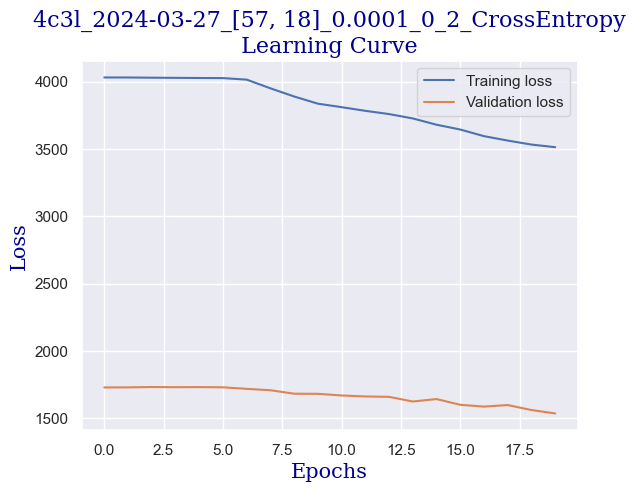

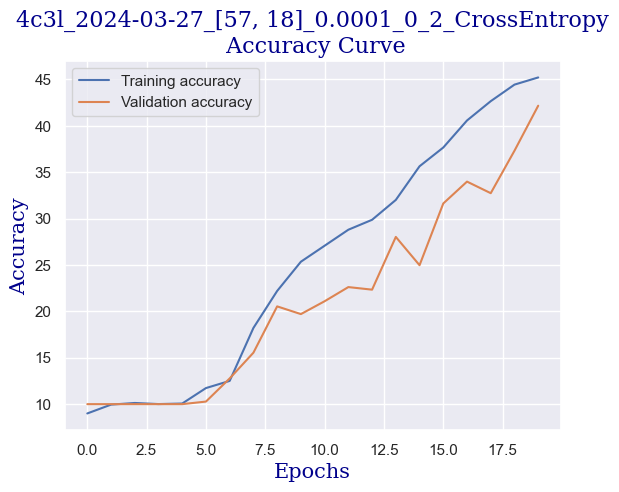

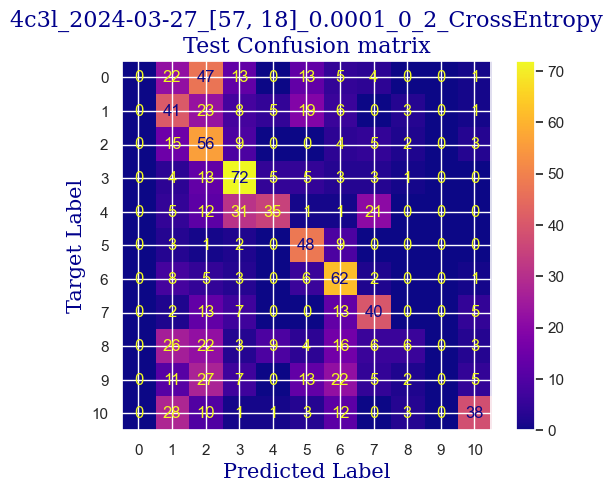

 
 END 4c3l [57, 18] Run Time:  187.9254491769998
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
7416.788102438
7405.863981997
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.982748364069007
validating...


  5%|██▊                                                      | 1/20 [00:08<02:47,  8.81s/it]

validation accuracy:  9.015256588072122
Training...
train accuracy:  8.923259964306961
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:44,  9.16s/it]

validation accuracy:  9.015256588072122
Training...
train accuracy:  9.1017251635931
validating...


 15%|████████▌                                                | 3/20 [00:27<02:34,  9.10s/it]

validation accuracy:  9.015256588072122
Training...
train accuracy:  10.648423557406305
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:25,  9.09s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.815585960737657
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:16,  9.12s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.648423557406305
validating...


 30%|█████████████████                                        | 6/20 [00:54<02:06,  9.03s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.875074360499703
validating...


 35%|███████████████████▉                                     | 7/20 [01:03<01:58,  9.11s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.161213563355146
validating...


 40%|██████████████████████▊                                  | 8/20 [01:12<01:49,  9.09s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.042236763831053
validating...


 45%|█████████████████████████▋                               | 9/20 [01:21<01:40,  9.10s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  13.682331945270674
validating...


 50%|████████████████████████████                            | 10/20 [01:30<01:30,  9.07s/it]

validation accuracy:  22.46879334257975
Training...
train accuracy:  21.47531231409875
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:39<01:20,  8.98s/it]

validation accuracy:  24.410540915395284
Training...
train accuracy:  27.12671029149316
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:48<01:12,  9.02s/it]

validation accuracy:  24.133148404993065
Training...
train accuracy:  30.517549077929807
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:57<01:03,  9.03s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  34.62224866151101
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:06<00:54,  9.09s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  37.477691850089236
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:15<00:45,  9.06s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  38.90541344437835
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:24<00:36,  9.06s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  39.97620464009518
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:34<00:27,  9.05s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  42.71267102914932
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:43<00:18,  9.09s/it]

validation accuracy:  44.79889042995839
Training...
train accuracy:  42.35574063057704
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:52<00:09,  9.05s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  44.14039262343843
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:01<00:00,  9.06s/it]

validation accuracy:  37.447988904299585
Testing...


 
 train acc:  44.14039262343843
 
 val acc:  37.447988904299585
 
 test acc:  37.57281553398058


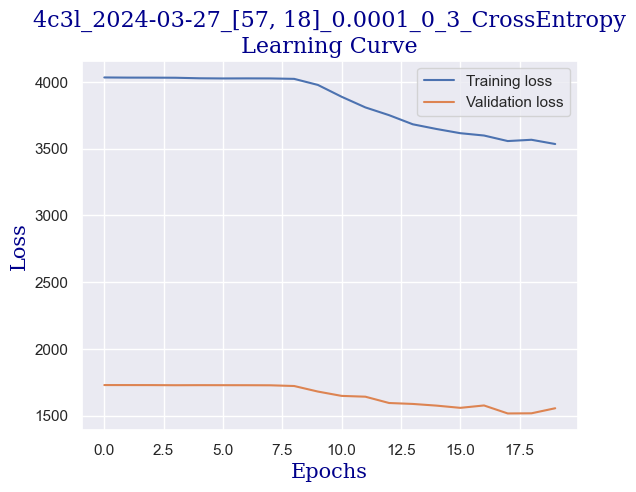

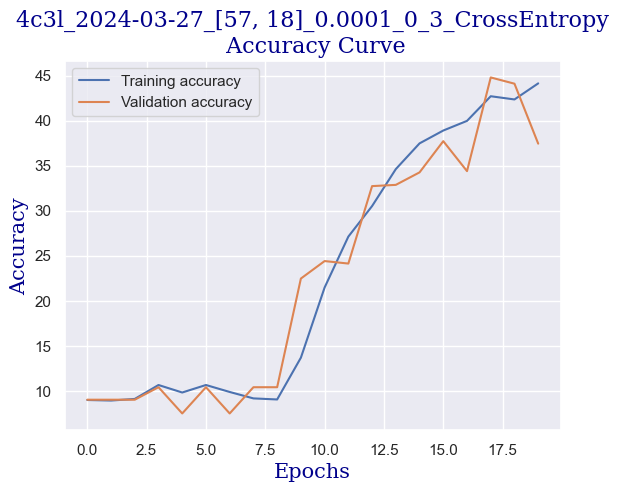

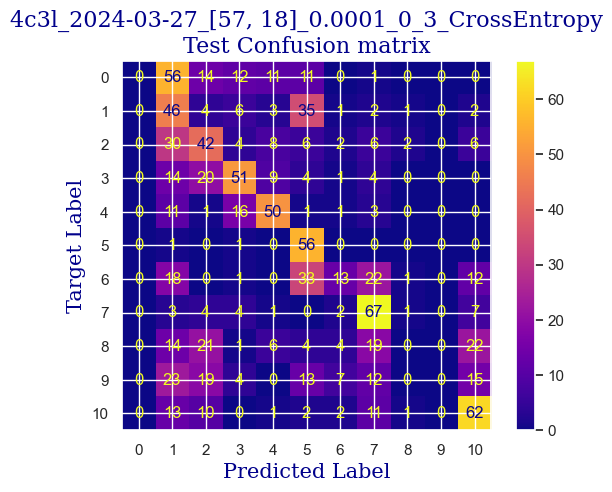

 
 END 4c3l [57, 18] Run Time:  187.9647927850001
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
7604.753867234
7593.829765328001
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.625817965496728
validating...


  5%|██▊                                                      | 1/20 [00:09<02:54,  9.19s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.815585960737657
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:43,  9.07s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.875074360499703
validating...


 15%|████████▌                                                | 3/20 [00:27<02:37,  9.29s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  10.291493158834028
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.24s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.637120761451518
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:17,  9.13s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.469958358120167
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:09,  9.28s/it]

validation accuracy:  22.607489597780862
Training...
train accuracy:  21.237358715050565
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:59,  9.21s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  27.959547888161808
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:51,  9.30s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  31.231409875074363
validating...


 45%|█████████████████████████▋                               | 9/20 [01:23<01:41,  9.22s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  33.0755502676978
validating...


 50%|████████████████████████████                            | 10/20 [01:32<01:31,  9.19s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  35.5145746579417
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:41<01:22,  9.15s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  35.812016656751936
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:50<01:12,  9.11s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  36.34741225461035
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:59<01:04,  9.16s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  38.13206424747174
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:08<00:54,  9.15s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  40.03569303985723
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:17<00:45,  9.15s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  38.37001784651993
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:26<00:36,  9.08s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  41.22546103509816
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:36<00:27,  9.16s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  41.46341463414634
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:44<00:18,  9.09s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  40.45211183819155
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:09,  9.08s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  43.188578227245685
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:03<00:00,  9.16s/it]

validation accuracy:  38.97364771151179
Testing...


 
 train acc:  43.188578227245685
 
 val acc:  38.97364771151179
 
 test acc:  33.49514563106796


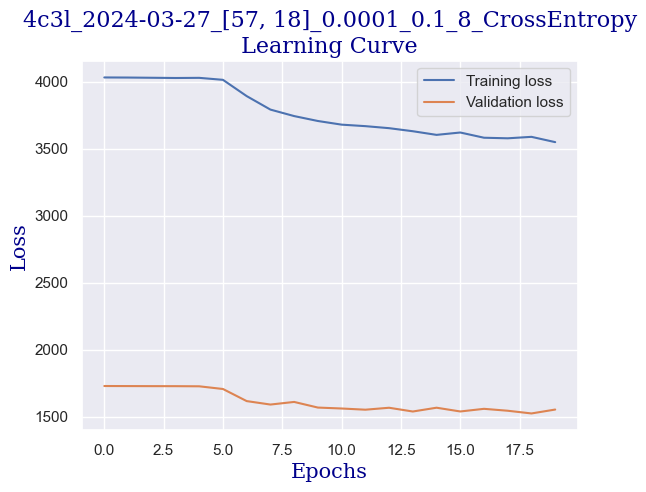

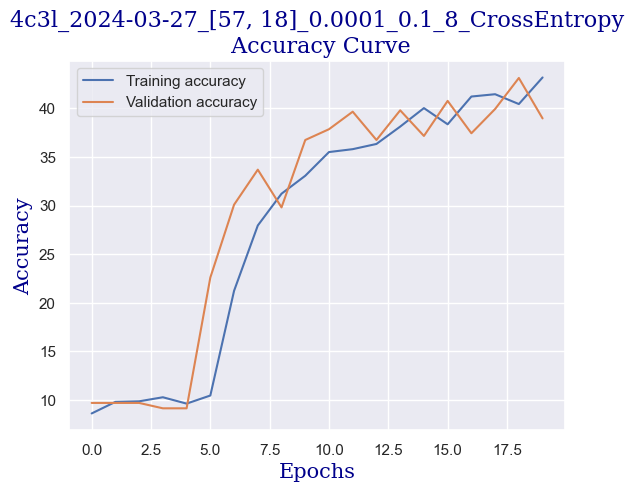

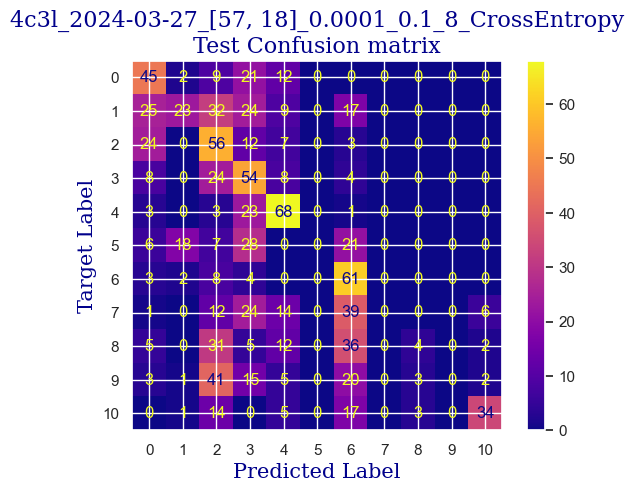

 
 END 4c3l [57, 18] Run Time:  189.4741462030006
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
7794.229087754
7783.304974756
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.469958358120167
validating...


  5%|██▊                                                      | 1/20 [00:09<02:54,  9.21s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.469958358120167
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:44,  9.13s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.529446757882214
validating...


 15%|████████▌                                                | 3/20 [00:27<02:36,  9.18s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.124330755502678
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.20s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:17,  9.15s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:08,  9.18s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.421772754312908
validating...


 35%|███████████████████▉                                     | 7/20 [01:03<01:58,  9.08s/it]

validation accuracy:  11.650485436893204
Training...
train accuracy:  19.036287923854847
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:49,  9.16s/it]

validation accuracy:  16.78224687933426
Training...
train accuracy:  23.854848304580607
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:39,  9.06s/it]

validation accuracy:  21.7753120665742
Training...
train accuracy:  26.948245092207017
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:30,  9.07s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  30.517549077929807
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:22,  9.13s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  31.4098750743605
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:49<01:12,  9.06s/it]

validation accuracy:  30.79056865464632
Training...
train accuracy:  34.027364663890545
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:58<01:03,  9.12s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  36.109458655562165
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:07<00:54,  9.04s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  37.35871505056514
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:16<00:45,  9.08s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  39.6192742415229
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:25<00:36,  9.10s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  39.202855443188575
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:34<00:27,  9.03s/it]

validation accuracy:  28.84882108183079
Training...
train accuracy:  41.4039262343843
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:43<00:18,  9.08s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  42.29625223081499
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:52<00:08,  8.99s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  43.307555026769776
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.10s/it]

validation accuracy:  42.57975034674064
Testing...


 
 train acc:  43.307555026769776
 
 val acc:  42.57975034674064
 
 test acc:  44.1747572815534


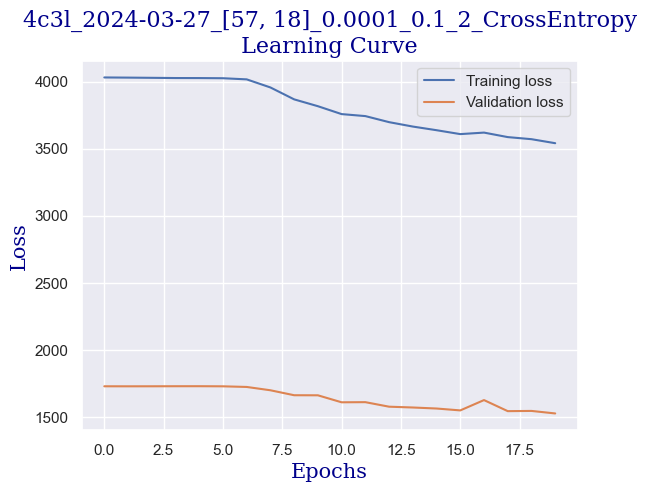

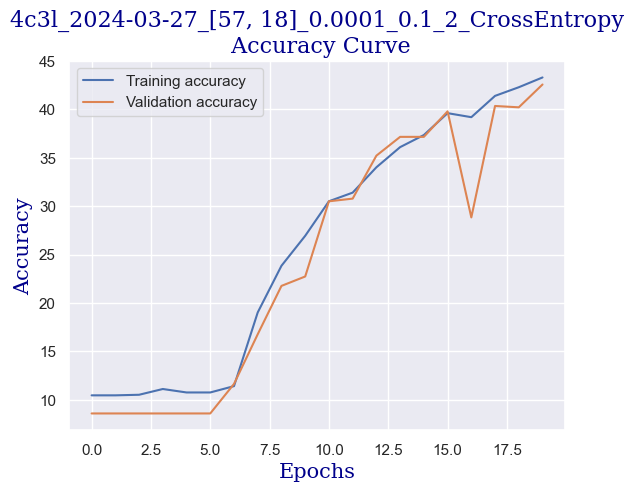

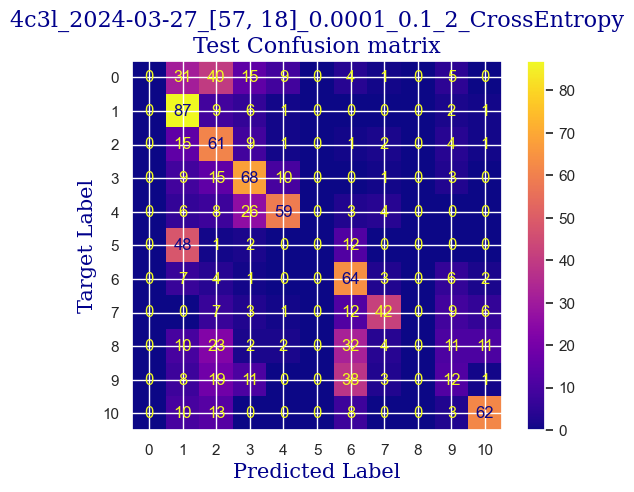

 
 END 4c3l [57, 18] Run Time:  188.21167667700047
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
7982.441751516
7971.517634482
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.875074360499703
validating...


  5%|██▊                                                      | 1/20 [00:09<02:53,  9.11s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.053539559785841
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:47,  9.31s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████▌                                                | 3/20 [00:27<02:35,  9.18s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.172516359309935
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.20s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.875074360499703
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:16,  9.07s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  13.265913146936349
validating...


 30%|█████████████████                                        | 6/20 [00:54<02:06,  9.05s/it]

validation accuracy:  24.133148404993065
Training...
train accuracy:  23.73587150505651
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:59,  9.19s/it]

validation accuracy:  22.46879334257975
Training...
train accuracy:  28.792385484830458
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:49,  9.11s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  29.92266508030934
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:41,  9.24s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  26.29387269482451
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:31,  9.11s/it]

validation accuracy:  28.84882108183079
Training...
train accuracy:  32.71861986912552
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:21,  9.07s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  34.97917906008328
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:49<01:13,  9.15s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  36.4069006543724
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:58<01:03,  9.06s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  39.67876264128495
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:07<00:54,  9.16s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  40.69006543723974
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:16<00:45,  9.10s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  42.59369422962522
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:25<00:36,  9.05s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  41.58239143367044
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:35<00:27,  9.12s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  43.96192742415229
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:44<00:18,  9.04s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  45.92504461629982
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:09,  9.16s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  46.57941701368233
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.13s/it]

validation accuracy:  44.521497919556175
Testing...


 
 train acc:  46.57941701368233
 
 val acc:  44.521497919556175
 
 test acc:  44.5631067961165


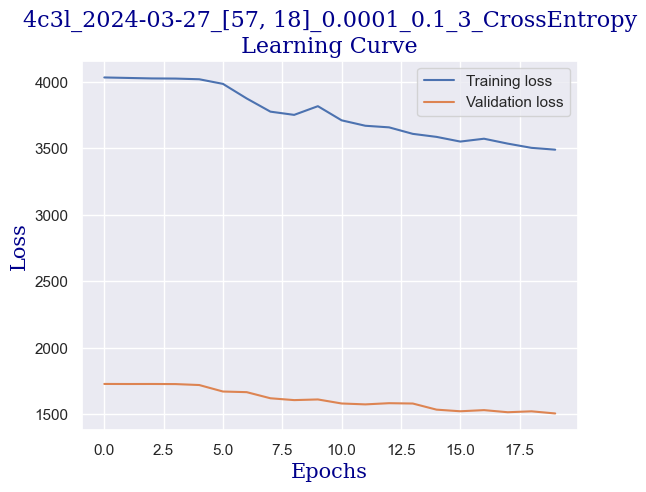

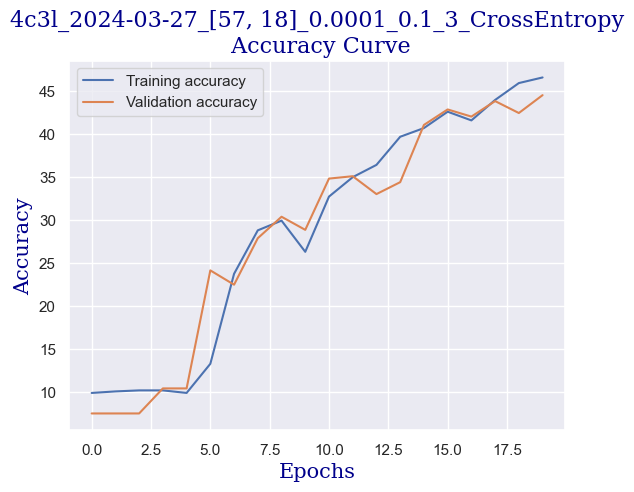

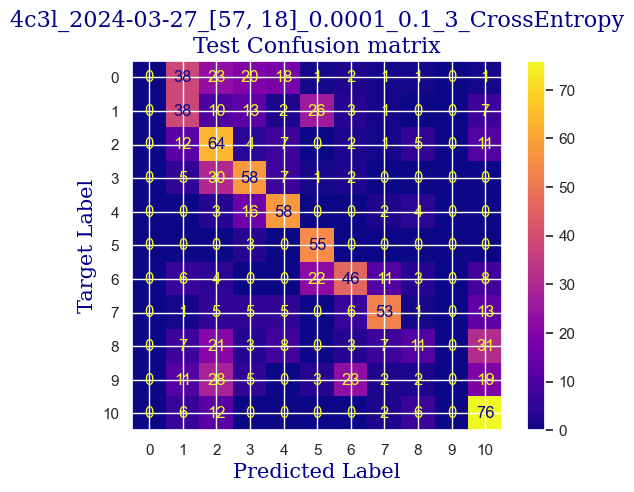

 
 END 4c3l [57, 18] Run Time:  188.75377803599986
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
8171.19661278
8160.272500551
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.291493158834028
validating...


  5%|██▊                                                      | 1/20 [00:09<02:58,  9.38s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.58893515764426
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:44,  9.16s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████▌                                                | 3/20 [00:27<02:36,  9.20s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.934562760261748
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:24,  9.05s/it]

validation accuracy:  9.015256588072122
Training...
train accuracy:  14.336704342653183
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:15,  9.06s/it]

validation accuracy:  22.88488210818308
Training...
train accuracy:  25.401546698393812
validating...


 30%|█████████████████                                        | 6/20 [00:54<02:07,  9.10s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  33.135038667459845
validating...


 35%|███████████████████▉                                     | 7/20 [01:03<01:57,  9.05s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  36.763831052944674
validating...


 40%|██████████████████████▊                                  | 8/20 [01:12<01:49,  9.13s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  40.3926234384295
validating...


 45%|█████████████████████████▋                               | 9/20 [01:21<01:39,  9.04s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  40.5116002379536
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:31,  9.12s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  41.106484235574065
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:22,  9.15s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  43.426531826293875
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:49<01:12,  9.10s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  43.78346222486615
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:58<01:03,  9.13s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  45.56811421772755
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:07<00:54,  9.04s/it]

validation accuracy:  46.04715672676838
Training...
train accuracy:  48.066627007733494
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:16<00:45,  9.08s/it]

validation accuracy:  43.96671289875174
Training...
train accuracy:  47.828673408685304
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:25<00:36,  9.11s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  48.66151100535396
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:34<00:27,  9.13s/it]

validation accuracy:  44.9375866851595
Training...
train accuracy:  49.43486020226056
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:43<00:18,  9.09s/it]

validation accuracy:  49.375866851595006
Training...
train accuracy:  49.55383700178465
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:52<00:09,  9.10s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  50.62462819750149
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.11s/it]

validation accuracy:  46.601941747572816
Testing...


 
 train acc:  50.62462819750149
 
 val acc:  46.601941747572816
 
 test acc:  45.43689320388349


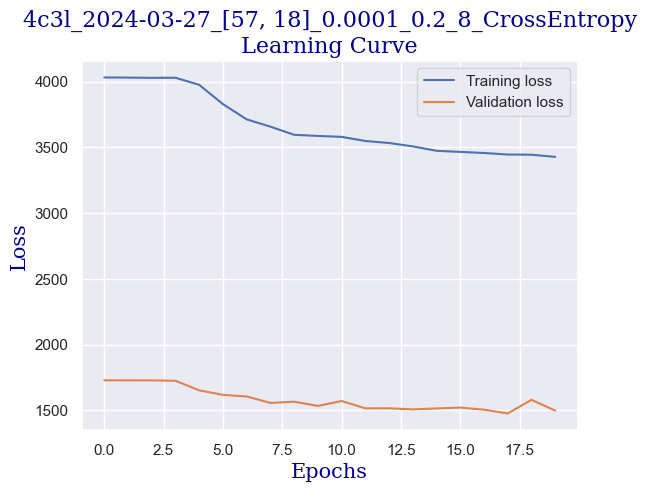

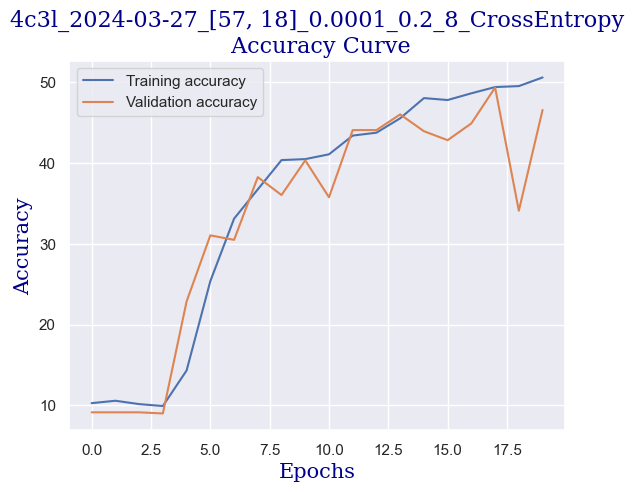

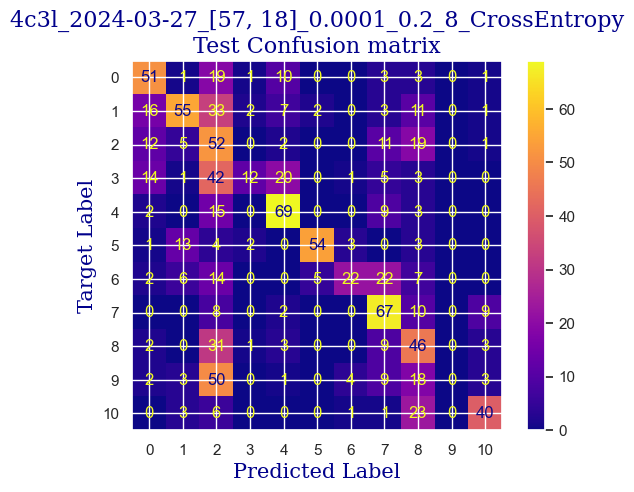

 
 END 4c3l [57, 18] Run Time:  188.33530466799948
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
8359.533122614
8348.609001777999
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  7.733491969066033
validating...


  5%|██▊                                                      | 1/20 [00:09<02:59,  9.47s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:47,  9.29s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 15%|████████▌                                                | 3/20 [00:27<02:36,  9.18s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.362284354550862
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.22s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.707911957168353
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:17,  9.19s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.469958358120167
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:09,  9.26s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.529446757882214
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:59,  9.20s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:50,  9.18s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.815585960737657
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:40,  9.12s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:30,  9.10s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.994051160023796
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:22,  9.12s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:50<01:12,  9.12s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  12.73051754907793
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:59<01:04,  9.23s/it]

validation accuracy:  15.950069348127602
Training...
train accuracy:  16.121356335514577
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:08<00:54,  9.16s/it]

validation accuracy:  19.41747572815534
Training...
train accuracy:  19.98810232004759
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:17<00:46,  9.23s/it]

validation accuracy:  22.330097087378643
Training...
train accuracy:  22.546103509815584
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:26<00:36,  9.01s/it]

validation accuracy:  22.191400832177532
Training...
train accuracy:  25.223081499107675
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:35<00:27,  9.03s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  27.067221891731112
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:44<00:18,  9.03s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  30.279595478881618
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:09,  9.04s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  33.19452706722189
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.13s/it]

validation accuracy:  34.95145631067961
Testing...


 
 train acc:  33.19452706722189
 
 val acc:  34.95145631067961
 
 test acc:  35.43689320388349


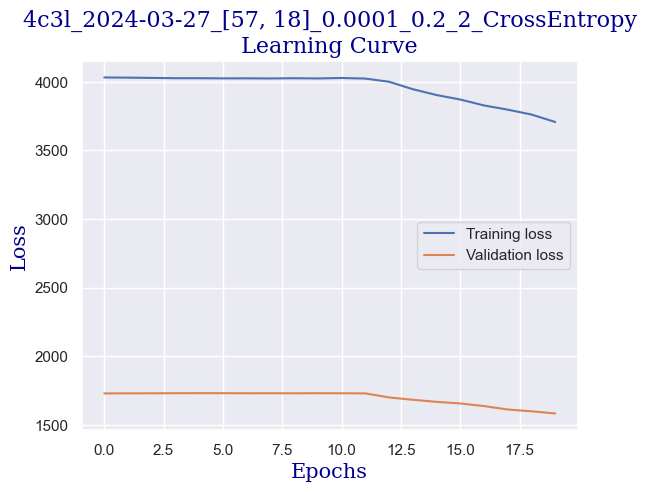

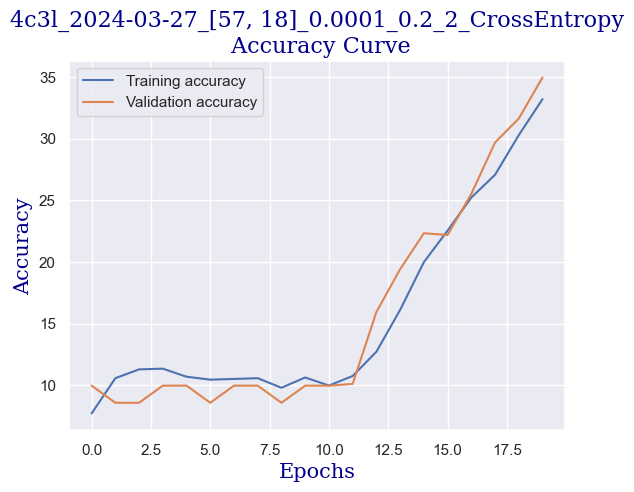

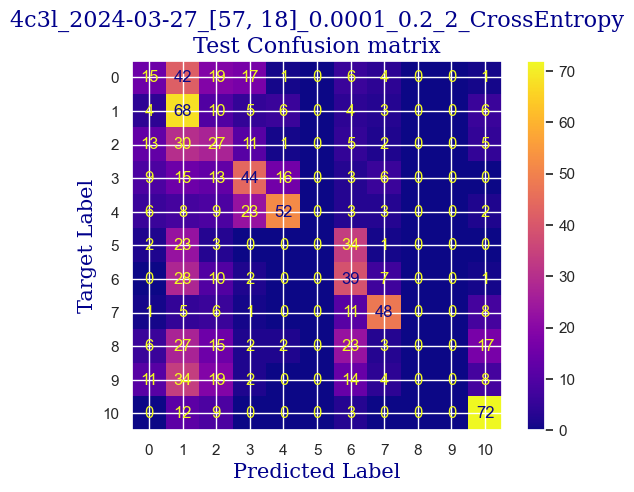

 
 END 4c3l [57, 18] Run Time:  189.01633713499905
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
8548.55046708
8537.626363063
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  7.911957168352171
validating...


  5%|██▊                                                      | 1/20 [00:09<02:55,  9.24s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.172516359309935
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:46,  9.25s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.350981558596075
validating...


 15%|████████▌                                                | 3/20 [00:27<02:36,  9.21s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.58893515764426
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.19s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  14.931588340273647
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:18,  9.22s/it]

validation accuracy:  20.943134535367545
Training...
train accuracy:  20.6424747174301
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:08,  9.19s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  20.70196311719215
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:59,  9.20s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  24.747174301011302
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:49,  9.16s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  30.220107079119572
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:41,  9.24s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  32.95657346817371
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:31,  9.18s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  36.04997025580012
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:41<01:22,  9.18s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  37.537180249851275
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:50<01:13,  9.15s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  40.45211183819155
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:59<01:03,  9.09s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  39.85722784057109
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:08<00:54,  9.15s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  39.50029744199881
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:17<00:45,  9.07s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  41.106484235574065
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:26<00:36,  9.09s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  42.534205829863176
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:35<00:27,  9.06s/it]

validation accuracy:  41.19278779472954
Training...
train accuracy:  42.47471743010113
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:44<00:18,  9.05s/it]

validation accuracy:  33.14840499306519
Training...
train accuracy:  42.23676383105294
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:09,  9.12s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  43.90243902439025
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.13s/it]

validation accuracy:  42.0249653259362
Testing...


 
 train acc:  43.90243902439025
 
 val acc:  42.0249653259362
 
 test acc:  39.6116504854369


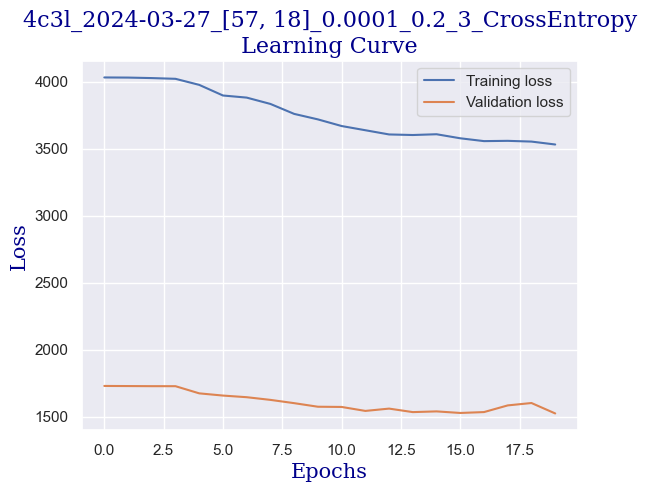

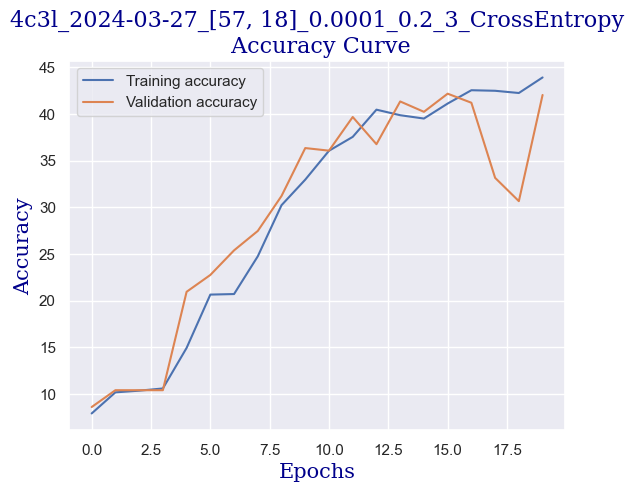

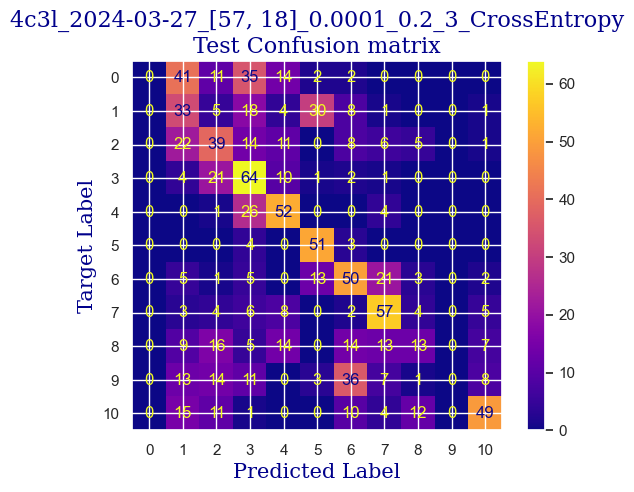

 
 END 4c3l [57, 18] Run Time:  188.82811188099913
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
8737.379773945
8726.455657638999
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.1017251635931
validating...


  5%|██▊                                                      | 1/20 [00:09<02:54,  9.20s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.280190362879239
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:44,  9.11s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.053539559785841
validating...


 15%|████████▌                                                | 3/20 [00:27<02:38,  9.30s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.161213563355146
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.21s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.994051160023796
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:19,  9.32s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  12.135633551457465
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:07,  9.14s/it]

validation accuracy:  19.972260748959776
Training...
train accuracy:  19.750148720999405
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:58,  9.13s/it]

validation accuracy:  16.36615811373093
Training...
train accuracy:  24.44973230220107
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:50,  9.21s/it]

validation accuracy:  18.307905686546462
Training...
train accuracy:  30.220107079119572
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:40,  9.12s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  31.647828673408686
validating...


 50%|████████████████████████████                            | 10/20 [01:32<01:32,  9.28s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  35.75252825698988
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:41<01:22,  9.14s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  39.08387864366449
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:50<01:13,  9.20s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  40.333135038667464
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:59<01:04,  9.19s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  42.415229030339084
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:08<00:54,  9.11s/it]

validation accuracy:  45.35367545076283
Training...
train accuracy:  42.653182629387274
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:17<00:45,  9.17s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  43.96192742415229
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:26<00:36,  9.08s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  44.6162998215348
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:35<00:27,  9.12s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  46.519928613920285
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:44<00:18,  9.08s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  46.34146341463415
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:09,  9.09s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  47.76918500892326
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.15s/it]

validation accuracy:  38.28016643550624
Testing...


 
 train acc:  47.76918500892326
 
 val acc:  38.28016643550624
 
 test acc:  35.92233009708738


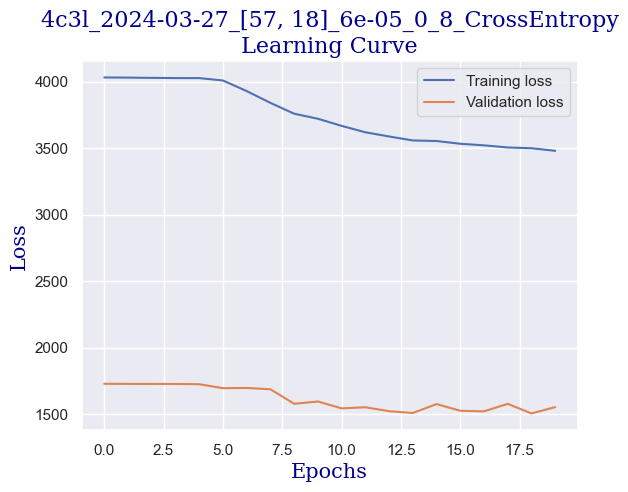

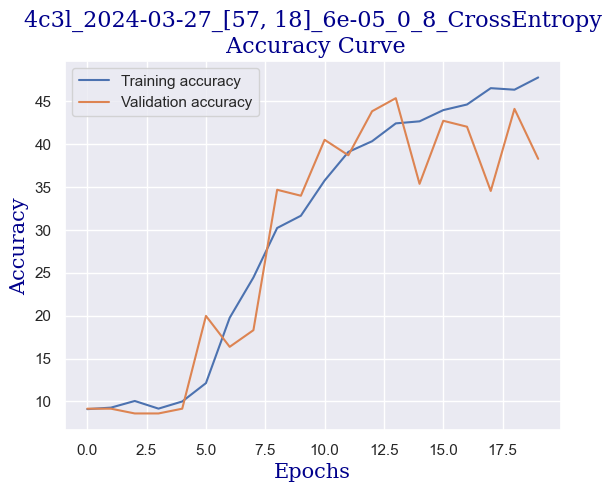

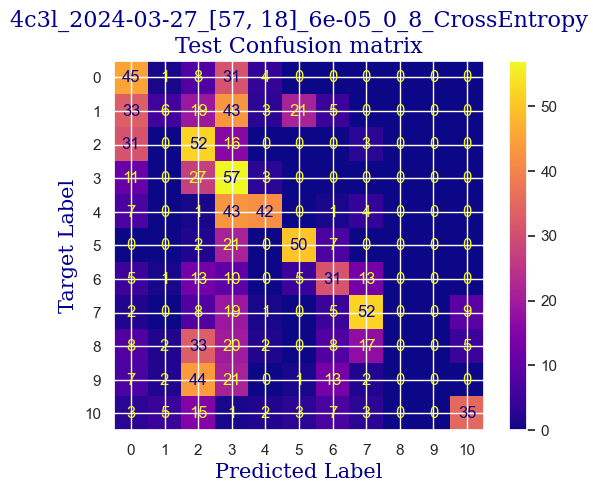

 
 END 4c3l [57, 18] Run Time:  189.22562524800014
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
8926.606446466
8915.682334377
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.57763236168947
validating...


  5%|██▊                                                      | 1/20 [00:09<03:05,  9.78s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.707911957168353
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:44,  9.15s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 15%|████████▌                                                | 3/20 [00:27<02:34,  9.10s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.005353955978585
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.20s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.469958358120167
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:16,  9.08s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.945865556216537
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:08,  9.21s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.291493158834028
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:59,  9.18s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.826888756692444
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:49,  9.14s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.529446757882214
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:41,  9.22s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:31,  9.10s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:22,  9.17s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:50<01:13,  9.18s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:59<01:04,  9.28s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:08<00:55,  9.22s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:17<00:45,  9.13s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.957168352171326
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:26<00:36,  9.19s/it]

validation accuracy:  13.314840499306518
Training...
train accuracy:  20.46400951814396
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:36<00:27,  9.15s/it]

validation accuracy:  25.93619972260749
Training...
train accuracy:  25.639500297441998
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:45<00:18,  9.20s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  28.316478286734085
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:54<00:09,  9.15s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  29.803688280785245
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:03<00:00,  9.19s/it]

validation accuracy:  24.687933425797503
Testing...


 
 train acc:  29.803688280785245
 
 val acc:  24.687933425797503
 
 test acc:  24.951456310679614


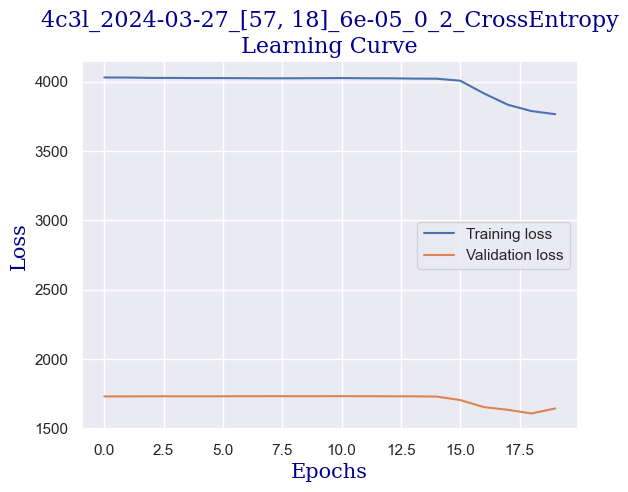

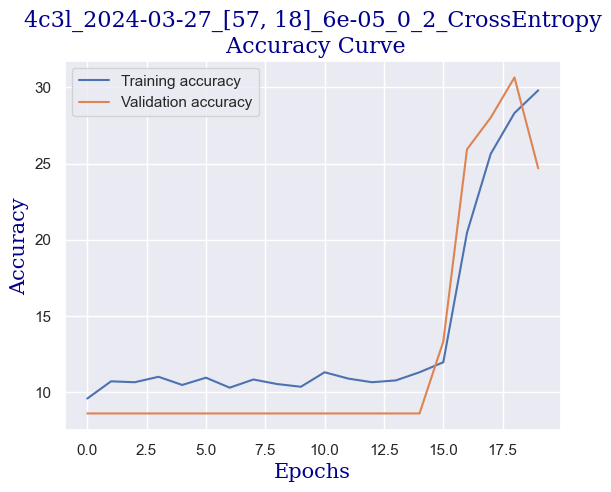

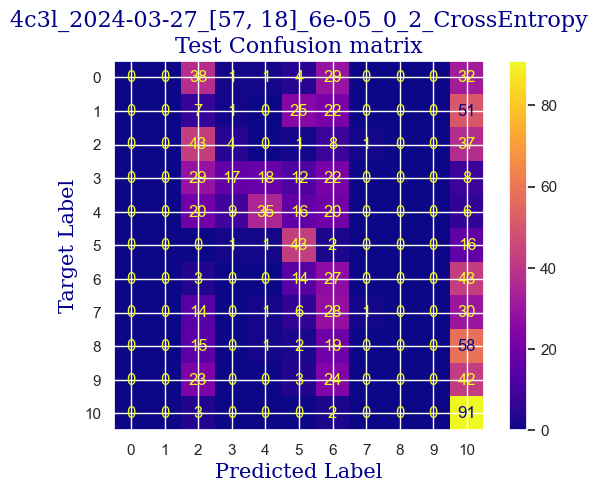

 
 END 4c3l [57, 18] Run Time:  189.95448624100027
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
9116.562061455
9105.637947214
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.23200475907198
validating...


  5%|██▊                                                      | 1/20 [00:09<02:54,  9.17s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.469958358120167
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:45,  9.22s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████▌                                                | 3/20 [00:27<02:36,  9.21s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.540749553837001
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.21s/it]

validation accuracy:  11.234396671289876
Training...
train accuracy:  18.262938726948246
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:17,  9.17s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  22.903033908387865
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:08,  9.18s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  28.435455086258184
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:58,  9.14s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  30.87447947650208
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:49,  9.14s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  32.71861986912552
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:40,  9.11s/it]

validation accuracy:  24.271844660194176
Training...
train accuracy:  34.62224866151101
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:30,  9.09s/it]

validation accuracy:  27.323162274618586
Training...
train accuracy:  35.63355145746579
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:22,  9.18s/it]

validation accuracy:  24.410540915395284
Training...
train accuracy:  36.2879238548483
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:49<01:12,  9.12s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  36.2879238548483
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:59<01:04,  9.16s/it]

validation accuracy:  28.155339805825243
Training...
train accuracy:  38.37001784651993
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:08<00:54,  9.15s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  38.72694824509221
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:17<00:45,  9.11s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  39.91671624033313
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:26<00:36,  9.19s/it]

validation accuracy:  28.155339805825243
Training...
train accuracy:  39.97620464009518
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:35<00:27,  9.11s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  40.98750743604997
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:44<00:18,  9.15s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  42.77215942891136
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:09,  9.13s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  42.9506246281975
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.14s/it]

validation accuracy:  35.92233009708738
Testing...


 
 train acc:  42.9506246281975
 
 val acc:  35.92233009708738
 
 test acc:  37.18446601941748


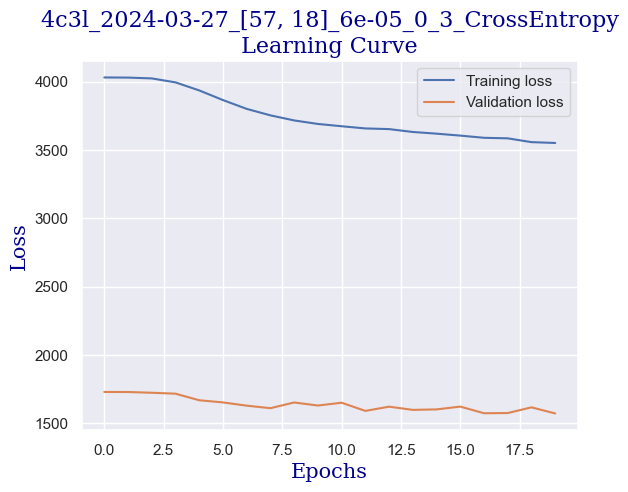

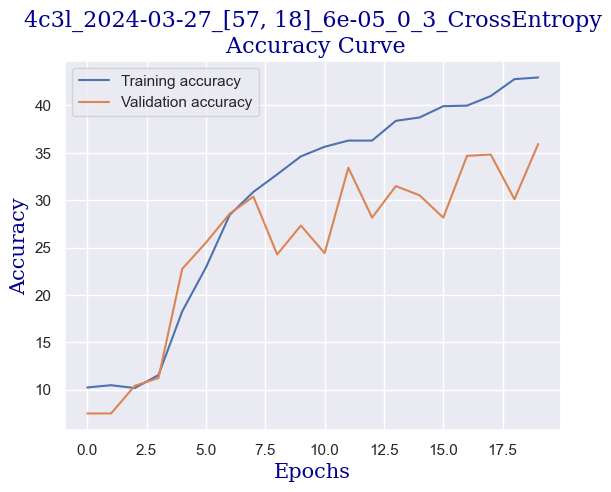

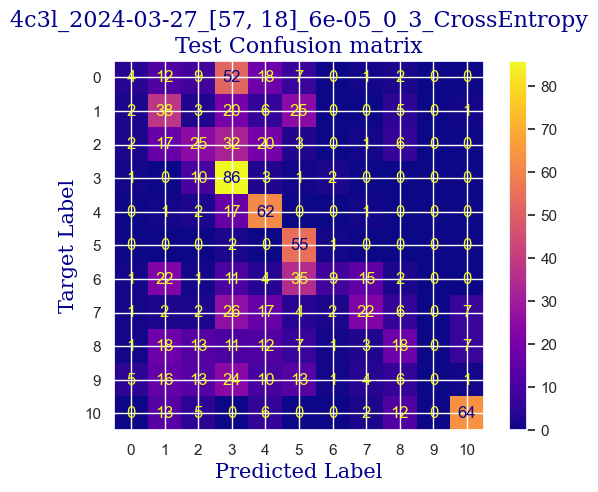

 
 END 4c3l [57, 18] Run Time:  189.22433116499997
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
9305.787304004
9294.863187096998
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.923259964306961
validating...


  5%|██▊                                                      | 1/20 [00:09<02:52,  9.06s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  9.75609756097561
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:46,  9.24s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.469958358120167
validating...


 15%|████████▌                                                | 3/20 [00:27<02:34,  9.06s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  11.362284354550862
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.23s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.75609756097561
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:18,  9.21s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  12.492563950029744
validating...


 30%|█████████████████                                        | 6/20 [00:54<02:08,  9.16s/it]

validation accuracy:  15.256588072122051
Training...
train accuracy:  20.52349791790601
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:59,  9.20s/it]

validation accuracy:  17.614424410540916
Training...
train accuracy:  27.900059488399766
validating...


 40%|██████████████████████▊                                  | 8/20 [01:12<01:48,  9.04s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  32.83759666864962
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:39,  9.04s/it]

validation accuracy:  26.907073509015255
Training...
train accuracy:  34.68173706127305
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:31,  9.13s/it]

validation accuracy:  26.49098474341193
Training...
train accuracy:  37.120761451516955
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:21,  9.09s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  39.202855443188575
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:49<01:13,  9.14s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  40.57108863771565
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:58<01:03,  9.03s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  41.16597263533611
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:07<00:54,  9.05s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  40.27364663890541
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:16<00:45,  9.11s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  42.9506246281975
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:25<00:36,  9.06s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  42.71267102914932
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:34<00:27,  9.13s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  44.55681142177275
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:43<00:18,  9.06s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  45.27067221891731
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:09,  9.12s/it]

validation accuracy:  44.9375866851595
Training...
train accuracy:  46.22248661511005
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.10s/it]

validation accuracy:  43.689320388349515
Testing...


 
 train acc:  46.22248661511005
 
 val acc:  43.689320388349515
 
 test acc:  41.16504854368932


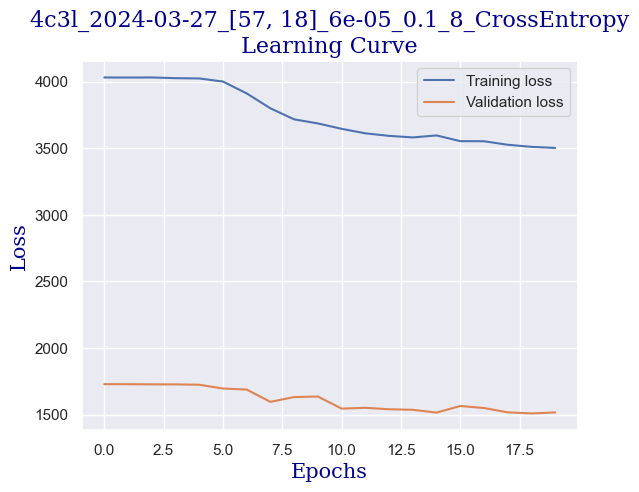

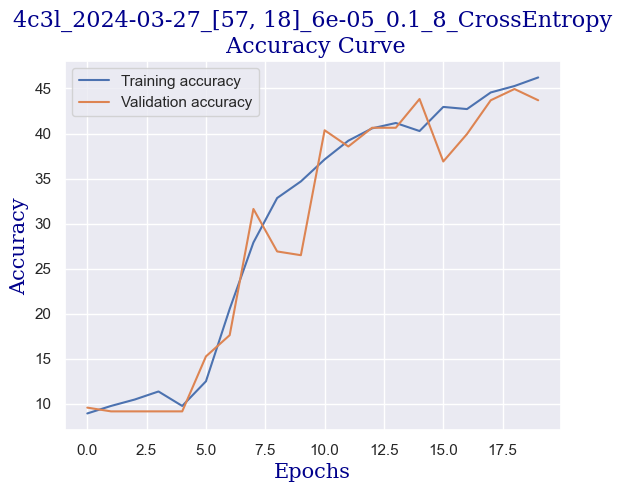

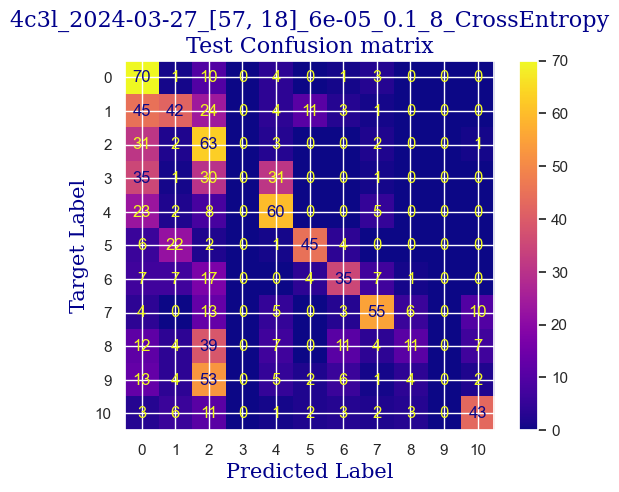

 
 END 4c3l [57, 18] Run Time:  188.31378759200015
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
9494.102169036
9483.17805712
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.982748364069007
validating...


  5%|██▊                                                      | 1/20 [00:09<02:57,  9.35s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.005353955978585
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:44,  9.12s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 15%|████████▌                                                | 3/20 [00:27<02:37,  9.27s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.529446757882214
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:28,  9.25s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:18,  9.22s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.957168352171326
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:09,  9.23s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.362284354550862
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:58,  9.13s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  12.314098750743604
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:50,  9.17s/it]

validation accuracy:  14.701803051317613
Training...
train accuracy:  16.835217132659132
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:40,  9.18s/it]

validation accuracy:  21.914008321775313
Training...
train accuracy:  23.61689470553242
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:31,  9.19s/it]

validation accuracy:  27.600554785020805
Training...
train accuracy:  26.055919095776325
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:41<01:22,  9.19s/it]

validation accuracy:  26.49098474341193
Training...
train accuracy:  29.92266508030934
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:50<01:13,  9.14s/it]

validation accuracy:  24.133148404993065
Training...
train accuracy:  30.04164187983343
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:59<01:04,  9.15s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  33.19452706722189
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:08<00:54,  9.11s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  35.217132659131465
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:17<00:45,  9.12s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  35.93099345627603
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:26<00:36,  9.09s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  38.845925044616294
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:35<00:27,  9.07s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  38.013087447947655
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:44<00:18,  9.03s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  38.31052944675788
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:09,  9.15s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  39.202855443188575
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.15s/it]

validation accuracy:  35.09015256588072
Testing...


 
 train acc:  39.202855443188575
 
 val acc:  35.09015256588072
 
 test acc:  36.699029126213595


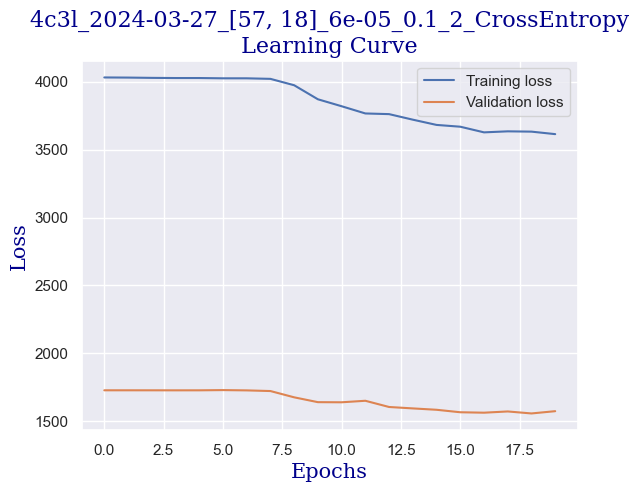

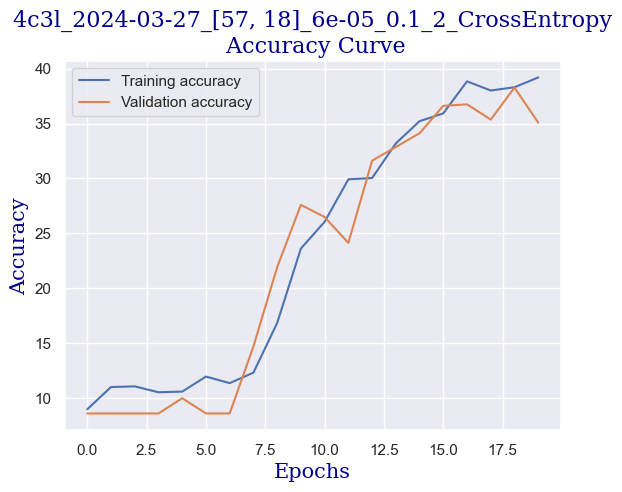

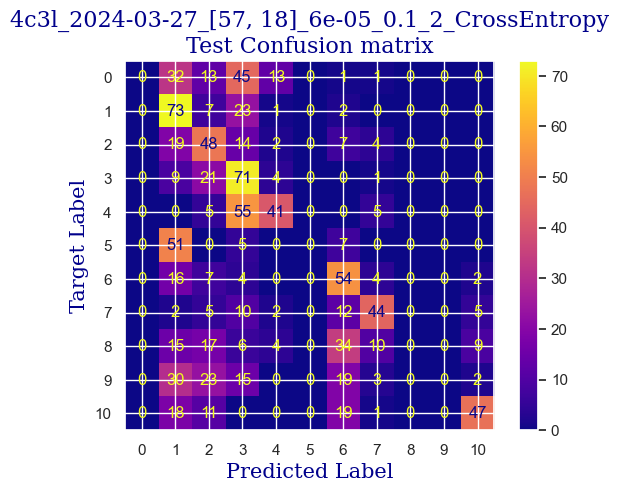

 
 END 4c3l [57, 18] Run Time:  189.03154575000008
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
9683.135048926
9672.210946968
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.982748364069007
validating...


  5%|██▊                                                      | 1/20 [00:09<02:56,  9.30s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  9.339678762641284
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:44,  9.16s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████▌                                                | 3/20 [00:27<02:36,  9.18s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.042236763831053
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:27,  9.23s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.518143961927423
validating...


 25%|██████████████▎                                          | 5/20 [00:46<02:17,  9.20s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.172516359309935
validating...


 30%|█████████████████                                        | 6/20 [00:55<02:10,  9.31s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.1017251635931
validating...


 35%|███████████████████▉                                     | 7/20 [01:04<01:59,  9.22s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  12.433075550267699
validating...


 40%|██████████████████████▊                                  | 8/20 [01:13<01:50,  9.25s/it]

validation accuracy:  21.220527045769764
Training...
train accuracy:  20.404521118381915
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:40,  9.15s/it]

validation accuracy:  24.687933425797503
Training...
train accuracy:  25.99643069601428
validating...


 50%|████████████████████████████                            | 10/20 [01:32<01:32,  9.21s/it]

validation accuracy:  26.768377253814148
Training...
train accuracy:  28.19750148720999
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:21,  9.10s/it]

validation accuracy:  28.155339805825243
Training...
train accuracy:  30.398572278405712
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:50<01:12,  9.09s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  30.636525877453895
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:59<01:03,  9.12s/it]

validation accuracy:  25.65880721220527
Training...
train accuracy:  33.19452706722189
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:08<00:54,  9.01s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  33.135038667459845
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:16<00:44,  9.00s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  33.72992266508031
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:26<00:36,  9.15s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  36.94229625223082
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:35<00:27,  9.06s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  36.466389054134446
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:44<00:18,  9.11s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  37.35871505056514
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:08,  8.99s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  37.35871505056514
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.11s/it]

validation accuracy:  37.309292649098474
Testing...


 
 train acc:  37.35871505056514
 
 val acc:  37.309292649098474
 
 test acc:  36.79611650485437


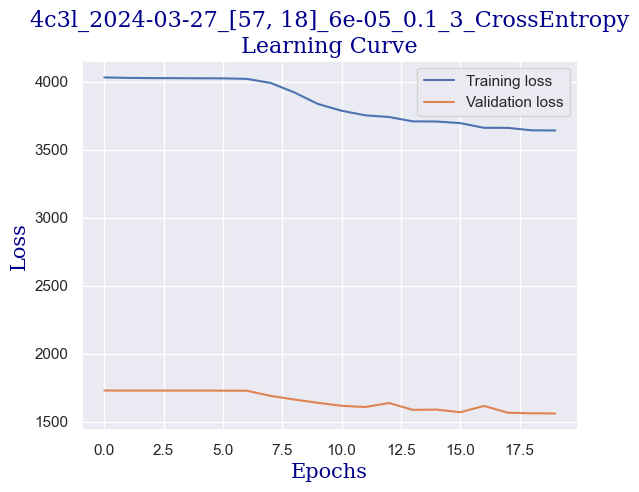

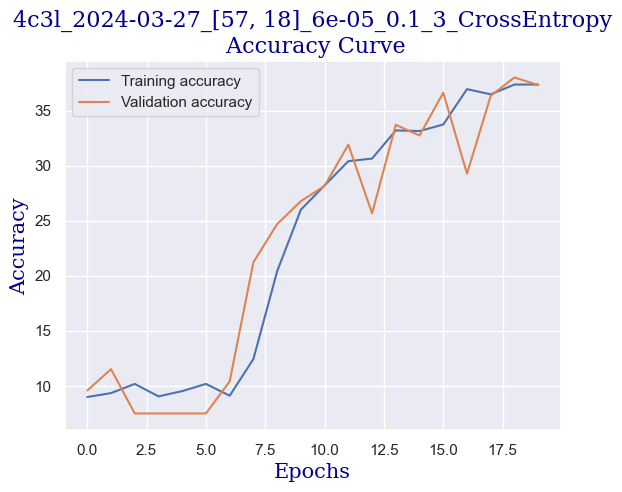

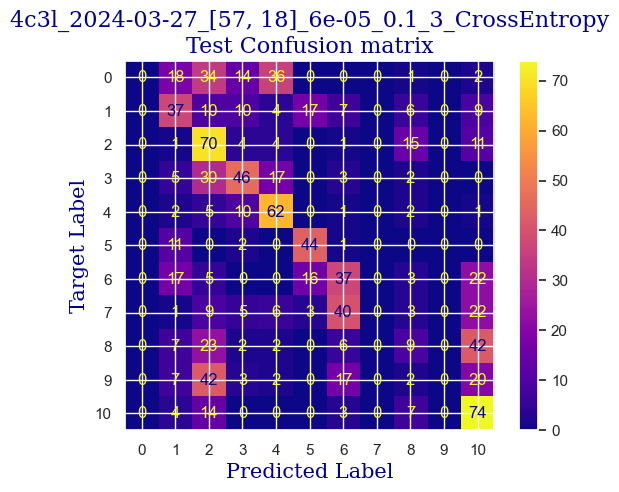

 
 END 4c3l [57, 18] Run Time:  188.6166504619996
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
9871.754203972
9860.830101212
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  7.792980368828078
validating...


  5%|██▊                                                      | 1/20 [00:09<02:54,  9.20s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.637120761451518
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:46,  9.24s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.934562760261748
validating...


 15%|████████▌                                                | 3/20 [00:27<02:35,  9.15s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:25,  9.11s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.696609161213564
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:16,  9.10s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  11.06484235574063
validating...


 30%|█████████████████                                        | 6/20 [00:54<02:07,  9.09s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  11.421772754312908
validating...


 35%|███████████████████▉                                     | 7/20 [01:03<01:58,  9.09s/it]

validation accuracy:  15.53398058252427
Training...
train accuracy:  16.656751933372995
validating...


 40%|██████████████████████▊                                  | 8/20 [01:12<01:48,  9.05s/it]

validation accuracy:  24.826629680998614
Training...
train accuracy:  22.546103509815584
validating...


 45%|█████████████████████████▋                               | 9/20 [01:22<01:40,  9.15s/it]

validation accuracy:  30.79056865464632
Training...
train accuracy:  29.327781082688876
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:30,  9.08s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  34.20582986317668
validating...


 55%|██████████████████████████████▊                         | 11/20 [01:40<01:21,  9.08s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  36.466389054134446
validating...


 60%|█████████████████████████████████▌                      | 12/20 [01:49<01:12,  9.08s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  38.31052944675788
validating...


 65%|████████████████████████████████████▍                   | 13/20 [01:58<01:03,  9.04s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  40.214158239143366
validating...


 70%|███████████████████████████████████████▏                | 14/20 [02:07<00:55,  9.26s/it]

validation accuracy:  45.49237170596394
Training...
train accuracy:  41.34443783462225
validating...


 75%|██████████████████████████████████████████              | 15/20 [02:16<00:45,  9.12s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  42.35574063057704
validating...


 80%|████████████████████████████████████████████▊           | 16/20 [02:26<00:36,  9.22s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  43.069601427721594
validating...


 85%|███████████████████████████████████████████████▌        | 17/20 [02:35<00:27,  9.16s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  44.6162998215348
validating...


 90%|██████████████████████████████████████████████████▍     | 18/20 [02:44<00:18,  9.12s/it]

validation accuracy:  45.35367545076283
Training...
train accuracy:  47.531231409875076
validating...


 95%|█████████████████████████████████████████████████████▏  | 19/20 [02:53<00:09,  9.18s/it]

validation accuracy:  47.01803051317614
Training...
train accuracy:  45.508625817965495
validating...


100%|████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.12s/it]

validation accuracy:  44.24410540915395
Testing...


 
 train acc:  45.508625817965495
 
 val acc:  44.24410540915395
 
 test acc:  44.36893203883495


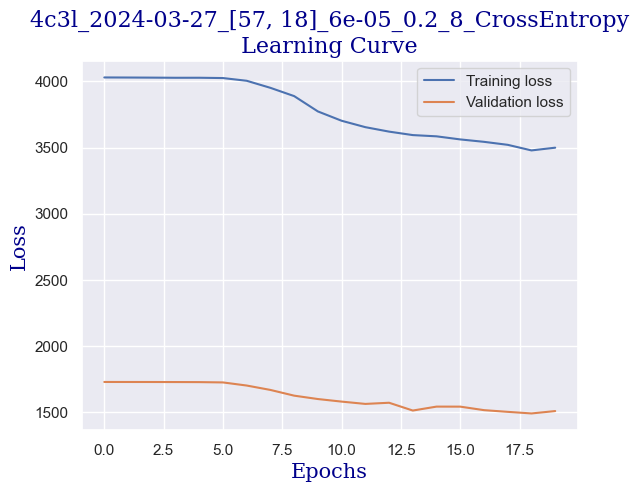

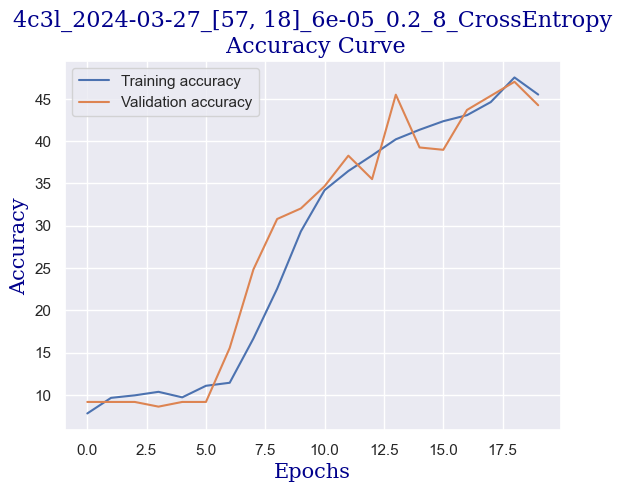

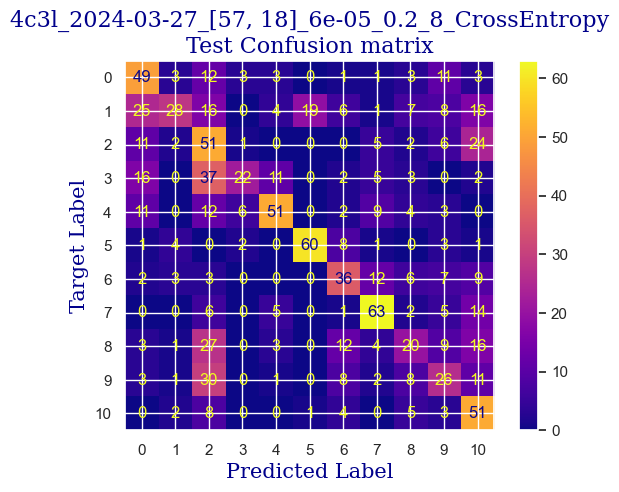

 
 END 4c3l [57, 18] Run Time:  188.52453598100146
Model:  4c3l  idx: 0 / 1
resolution:  [57, 18]   idx: 1 / 5
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
10060.279799403
10049.355689270998
Total epochs: 20


  0%|                                                                 | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.280190362879239
validating...


  5%|██▊                                                      | 1/20 [00:08<02:50,  8.96s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 10%|█████▋                                                   | 2/20 [00:18<02:42,  9.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.696609161213564
validating...


 15%|████████▌                                                | 3/20 [00:27<02:35,  9.14s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.875074360499703
validating...


 20%|███████████▍                                             | 4/20 [00:36<02:25,  9.12s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.945865556216537
validating...


 25%|██████████████▎                                          | 5/20 [00:45<02:18,  9.22s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.529446757882214
validating...


 30%|█████████████████                                        | 6/20 [00:54<02:07,  9.09s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 35%|███████████████████▉                                     | 7/20 [01:03<01:58,  9.09s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  12.016656751933374
validating...


 40%|██████████████████████▊                                  | 8/20 [01:12<01:49,  9.11s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.350981558596075
validating...


 45%|█████████████████████████▋                               | 9/20 [01:21<01:39,  9.06s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.005353955978585
validating...


 50%|████████████████████████████                            | 10/20 [01:31<01:31,  9.16s/it]

validation accuracy:  9.986130374479888
Training...


In [ ]:
_go(config)